In [1]:
import os
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"   # see issue #152
os.environ["CUDA_VISIBLE_DEVICES"]="1,2"

In [2]:
from tensorflow.python.client import device_lib
print (device_lib.list_local_devices())

[name: "/cpu:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 3896864084219050437
, name: "/gpu:0"
device_type: "GPU"
memory_limit: 5996529869
locality {
  bus_id: 1
}
incarnation: 8864180586140644824
physical_device_desc: "device: 0, name: GeForce GTX 980 Ti, pci bus id: 0000:02:00.0"
, name: "/gpu:1"
device_type: "GPU"
memory_limit: 5996171879
locality {
  bus_id: 1
}
incarnation: 6228426530845789920
physical_device_desc: "device: 1, name: GeForce GTX 980 Ti, pci bus id: 0000:03:00.0"
]


# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Extracting mnist: 100%|██████████| 60.0K/60.0K [00:11<00:00, 5.45KFile/s]


Extracting celeba...


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

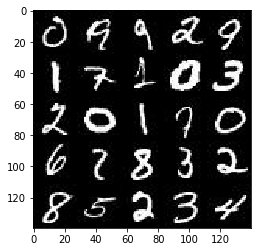

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

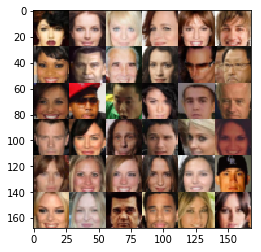

In [3]:
show_n_images = 40

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.1.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    inputs_ = tf.placeholder(tf.float32, [None, image_width, image_height, image_channels], "inputs")
    z = tf.placeholder(tf.float32, [None, z_dim], name="z")
    lr = tf.placeholder(tf.float32, name="learning_rate")
    
    return inputs_, z, lr


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
import numpy as np
def discriminator(images, reuse=False, alpha=0.2):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    with tf.variable_scope("discriminator", reuse=reuse):
        # input images 28*28*3
        x1 = tf.layers.conv2d(images, 64, 5, strides=2, padding="same")
        relu1 = tf.maximum(alpha*x1, x1)
        # 14*14*64
        
        x2 = tf.layers.conv2d(relu1, 128, 5, strides=2, padding="same")
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha*bn2, bn2)
        # 7*7*128
        
        x3 = tf.layers.conv2d(relu2, 256, 5, strides=2, padding="same")
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha*bn3, bn3)
        # 4*4*256
        
        x4 = tf.layers.conv2d(relu3, 512, 3, strides=2, padding="same")
        bn4 = tf.layers.batch_normalization(x4, training=True)
        relu4 = tf.maximum(alpha*bn4, bn4)
        # 2*2*512
        
        # flatten it
        flat = tf.reshape(relu4, (-1, 2*2*512))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
        return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True, alpha=0.2):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    with tf.variable_scope("generator", reuse= not is_train):
        # Input z
        x1 = tf.layers.dense(z, 4*4*512)
        # 4*4*512
        
        x1 = tf.reshape(x1, (-1,4,4,512))
        bn1 = tf.layers.batch_normalization(x1, training=is_train)
        relu1 = tf.maximum(bn1, alpha*bn1)
        # 4*4*512
        
        x2 = tf.layers.conv2d_transpose(relu1, 256, 5, strides=2, padding="same")
        bn2 = tf.layers.batch_normalization(x2, training=is_train)
        relu2 = tf.maximum(bn2, alpha*bn2)
        # 8*8*256
        
        x3 = tf.layers.conv2d_transpose(relu2, 128, 5, strides=2, padding="same")
        bn3 = tf.layers.batch_normalization(x3, training=is_train)
        relu3 = tf.maximum(bn3, alpha*bn3)
        # 16*16*128
        
        x4 = tf.layers.conv2d_transpose(relu3, 32, 5, strides=2, padding="same")
        bn4 = tf.layers.batch_normalization(x4, training=is_train)
        relu4 = tf.maximum(bn4, alpha*bn4)
        # 32*32*32
        
        x5 = tf.layers.conv2d(relu4, out_channel_dim, 5, strides=1, padding="same")
        logits = tf.image.resize_images(x5, [28,28])
        out = tf.tanh(logits)
        # 28*28*3
        
    return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # generator and discriminator
    g_out = generator(input_z, out_channel_dim, is_train=True)
    d_out_real, d_logits_real = discriminator(input_real, reuse=False)
    d_out_fake, d_logits_fake = discriminator(g_out, reuse=True)
    # discriminator loss
    d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, 
                    labels=tf.ones_like(d_logits_real)))
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, 
                    labels=tf.zeros_like(d_logits_fake)))
    d_loss = d_loss_real + d_loss_fake
    # generator loss
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, 
                labels=tf.ones_like(d_logits_fake)))
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    t_vars = tf.trainable_variables()
    g_vars = [i for i in t_vars if "generator" in i.name]
    d_vars = [i for i in t_vars if "discriminator" in i.name]

    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS, scope='discriminator')):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1).minimize(d_loss, var_list=d_vars)
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS, scope='generator')):
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1).minimize(g_loss, var_list=g_vars)
    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:
losses = []
samples = []
tf_cfg = tf.ConfigProto(allow_soft_placement=True)
tf_cfg.gpu_options.per_process_gpu_memory_fraction = 0.4
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    # inputs
    _, image_width, image_height, image_channels = data_shape
    input_real, input_z, lr = model_inputs(image_width, image_height, image_channels, z_dim)
    # loss
    d_loss, g_loss = model_loss(input_real, input_z, image_channels)
    # opt
    d_train_opt, g_train_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    # generator
    z_generated = generator(input_z, image_channels, is_train=False)
    
    
    iteration = 0
    with tf.Session(config=tf_cfg) as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                batch_images *= 2
                iteration += 1
                # sample z
                batch_z = np.random.uniform(-0.5, 0.5, size=(batch_size, z_dim))
                # run optimizers
                _ = sess.run(d_train_opt, feed_dict={input_real: batch_images, input_z: batch_z})
                _ = sess.run(g_train_opt, feed_dict={input_z: batch_z})
                # show
                if iteration % 100 == 0:
                    show_generator_output(sess, 25, input_z, image_channels, data_image_mode)
                if iteration % 10 == 0:
                # At the end of each epoch, get the losses and print them out
                    train_loss_d = sess.run(d_loss, {input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})
                    print("Epoch {}/{}...".format(epoch_i+1, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))    
#                     # Save losses to view after training
#                     losses.append((train_loss_d, train_loss_g))

#             # Sample from generator as we're training for viewing afterwards
#             sample_z = np.random.uniform(-0.5, 0.5, size=(16, z_dim))
#             gen_samples = sess.run(
#                            z_generated,
#                            feed_dict={input_z: sample_z})
#             samples.append(gen_samples)        

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/3... Discriminator Loss: 0.0688... Generator Loss: 3.2816
Epoch 1/3... Discriminator Loss: 0.0296... Generator Loss: 3.9053
Epoch 1/3... Discriminator Loss: 0.0663... Generator Loss: 3.4965
Epoch 1/3... Discriminator Loss: 0.0305... Generator Loss: 5.4691
Epoch 1/3... Discriminator Loss: 0.0411... Generator Loss: 6.2027
Epoch 1/3... Discriminator Loss: 0.0604... Generator Loss: 5.7828
Epoch 1/3... Discriminator Loss: 2.0345... Generator Loss: 0.1716
Epoch 1/3... Discriminator Loss: 1.3168... Generator Loss: 0.5144
Epoch 1/3... Discriminator Loss: 0.9485... Generator Loss: 1.1038


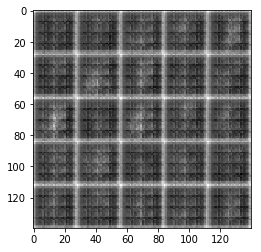

Epoch 1/3... Discriminator Loss: 0.5468... Generator Loss: 1.2818
Epoch 1/3... Discriminator Loss: 0.6460... Generator Loss: 1.2795
Epoch 1/3... Discriminator Loss: 0.5534... Generator Loss: 1.4736
Epoch 1/3... Discriminator Loss: 0.6896... Generator Loss: 1.2887
Epoch 1/3... Discriminator Loss: 0.7729... Generator Loss: 1.3849
Epoch 1/3... Discriminator Loss: 0.7077... Generator Loss: 1.1119
Epoch 1/3... Discriminator Loss: 0.6518... Generator Loss: 1.4203
Epoch 1/3... Discriminator Loss: 1.4465... Generator Loss: 0.3753
Epoch 1/3... Discriminator Loss: 0.8724... Generator Loss: 1.0932
Epoch 1/3... Discriminator Loss: 0.7001... Generator Loss: 1.6254


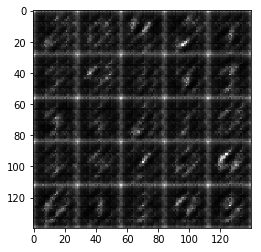

Epoch 1/3... Discriminator Loss: 0.8635... Generator Loss: 1.4160
Epoch 1/3... Discriminator Loss: 0.9870... Generator Loss: 0.8815
Epoch 1/3... Discriminator Loss: 0.7958... Generator Loss: 1.5312
Epoch 1/3... Discriminator Loss: 1.0274... Generator Loss: 2.5026
Epoch 1/3... Discriminator Loss: 0.8368... Generator Loss: 0.9874
Epoch 1/3... Discriminator Loss: 0.9827... Generator Loss: 0.7094
Epoch 1/3... Discriminator Loss: 0.7672... Generator Loss: 1.1318
Epoch 1/3... Discriminator Loss: 0.8238... Generator Loss: 1.8323
Epoch 1/3... Discriminator Loss: 0.6945... Generator Loss: 1.3369
Epoch 1/3... Discriminator Loss: 0.6674... Generator Loss: 1.2017


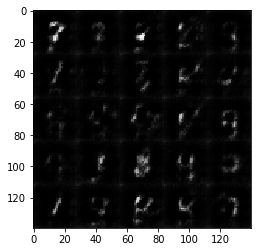

Epoch 1/3... Discriminator Loss: 0.7405... Generator Loss: 1.4868
Epoch 1/3... Discriminator Loss: 0.6994... Generator Loss: 1.2014
Epoch 1/3... Discriminator Loss: 0.9508... Generator Loss: 0.7064
Epoch 1/3... Discriminator Loss: 0.7666... Generator Loss: 1.5777
Epoch 1/3... Discriminator Loss: 0.5886... Generator Loss: 1.1800
Epoch 1/3... Discriminator Loss: 0.5024... Generator Loss: 1.4061
Epoch 1/3... Discriminator Loss: 0.6812... Generator Loss: 1.5334
Epoch 1/3... Discriminator Loss: 0.6900... Generator Loss: 1.3218
Epoch 1/3... Discriminator Loss: 0.6680... Generator Loss: 1.0965
Epoch 1/3... Discriminator Loss: 0.8356... Generator Loss: 2.0861


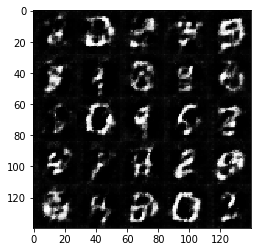

Epoch 1/3... Discriminator Loss: 0.7039... Generator Loss: 1.3987
Epoch 1/3... Discriminator Loss: 0.5251... Generator Loss: 1.3881
Epoch 1/3... Discriminator Loss: 0.7654... Generator Loss: 1.2444
Epoch 1/3... Discriminator Loss: 0.6859... Generator Loss: 2.0308
Epoch 1/3... Discriminator Loss: 0.9988... Generator Loss: 0.6021
Epoch 1/3... Discriminator Loss: 1.3564... Generator Loss: 0.4160
Epoch 1/3... Discriminator Loss: 0.6652... Generator Loss: 1.1138
Epoch 1/3... Discriminator Loss: 0.5945... Generator Loss: 1.3941
Epoch 1/3... Discriminator Loss: 0.7425... Generator Loss: 1.0716
Epoch 1/3... Discriminator Loss: 0.7493... Generator Loss: 0.8403


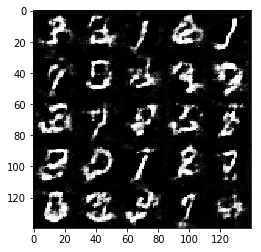

Epoch 1/3... Discriminator Loss: 1.1276... Generator Loss: 0.5015
Epoch 1/3... Discriminator Loss: 0.5556... Generator Loss: 1.3829
Epoch 1/3... Discriminator Loss: 0.5614... Generator Loss: 1.4512
Epoch 1/3... Discriminator Loss: 0.6845... Generator Loss: 1.1614
Epoch 1/3... Discriminator Loss: 0.7045... Generator Loss: 0.9942
Epoch 1/3... Discriminator Loss: 0.6559... Generator Loss: 1.1052
Epoch 1/3... Discriminator Loss: 0.9068... Generator Loss: 2.2625
Epoch 1/3... Discriminator Loss: 0.6953... Generator Loss: 1.6778
Epoch 1/3... Discriminator Loss: 0.7449... Generator Loss: 1.1117
Epoch 1/3... Discriminator Loss: 0.9218... Generator Loss: 0.7189


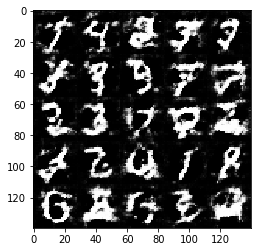

Epoch 1/3... Discriminator Loss: 0.7061... Generator Loss: 1.5914
Epoch 1/3... Discriminator Loss: 1.0881... Generator Loss: 2.8799
Epoch 1/3... Discriminator Loss: 0.6467... Generator Loss: 1.1198
Epoch 1/3... Discriminator Loss: 0.7117... Generator Loss: 1.5239
Epoch 1/3... Discriminator Loss: 0.6364... Generator Loss: 1.2493
Epoch 1/3... Discriminator Loss: 0.9811... Generator Loss: 0.6425
Epoch 1/3... Discriminator Loss: 0.6547... Generator Loss: 1.6160
Epoch 1/3... Discriminator Loss: 0.5949... Generator Loss: 1.9418
Epoch 1/3... Discriminator Loss: 1.1356... Generator Loss: 0.5089
Epoch 1/3... Discriminator Loss: 0.6294... Generator Loss: 1.3853


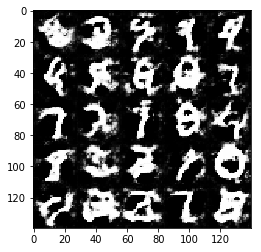

Epoch 1/3... Discriminator Loss: 0.6261... Generator Loss: 2.2894
Epoch 1/3... Discriminator Loss: 0.8131... Generator Loss: 0.8493
Epoch 1/3... Discriminator Loss: 0.7466... Generator Loss: 2.0836
Epoch 1/3... Discriminator Loss: 0.5999... Generator Loss: 1.2780
Epoch 1/3... Discriminator Loss: 0.7375... Generator Loss: 1.1754
Epoch 1/3... Discriminator Loss: 1.4936... Generator Loss: 0.3556
Epoch 1/3... Discriminator Loss: 0.8368... Generator Loss: 1.0209
Epoch 1/3... Discriminator Loss: 0.6246... Generator Loss: 1.5588
Epoch 1/3... Discriminator Loss: 1.0627... Generator Loss: 0.5502
Epoch 1/3... Discriminator Loss: 0.8010... Generator Loss: 2.3254


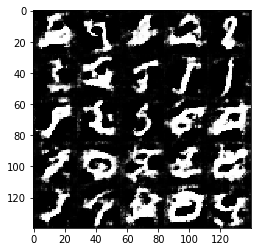

Epoch 1/3... Discriminator Loss: 0.6967... Generator Loss: 1.8073
Epoch 1/3... Discriminator Loss: 0.6339... Generator Loss: 1.7906
Epoch 1/3... Discriminator Loss: 0.6949... Generator Loss: 2.3207
Epoch 1/3... Discriminator Loss: 0.8577... Generator Loss: 2.8075
Epoch 1/3... Discriminator Loss: 0.8063... Generator Loss: 0.9276
Epoch 1/3... Discriminator Loss: 0.7531... Generator Loss: 1.5638
Epoch 1/3... Discriminator Loss: 0.6474... Generator Loss: 1.2992
Epoch 1/3... Discriminator Loss: 0.6894... Generator Loss: 1.8592
Epoch 1/3... Discriminator Loss: 0.7344... Generator Loss: 0.8956
Epoch 1/3... Discriminator Loss: 0.8139... Generator Loss: 0.7592


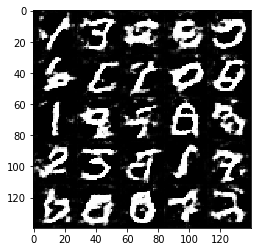

Epoch 1/3... Discriminator Loss: 0.8768... Generator Loss: 0.7314
Epoch 1/3... Discriminator Loss: 1.0550... Generator Loss: 0.5241
Epoch 1/3... Discriminator Loss: 0.9102... Generator Loss: 0.7264
Epoch 1/3... Discriminator Loss: 0.8079... Generator Loss: 0.8442
Epoch 2/3... Discriminator Loss: 0.5772... Generator Loss: 1.1483
Epoch 2/3... Discriminator Loss: 1.0301... Generator Loss: 2.3619
Epoch 2/3... Discriminator Loss: 0.6403... Generator Loss: 1.3308
Epoch 2/3... Discriminator Loss: 0.8635... Generator Loss: 0.6954
Epoch 2/3... Discriminator Loss: 0.6665... Generator Loss: 2.2746
Epoch 2/3... Discriminator Loss: 0.6416... Generator Loss: 1.3463


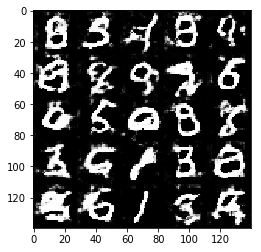

Epoch 2/3... Discriminator Loss: 0.7448... Generator Loss: 0.9754
Epoch 2/3... Discriminator Loss: 0.7694... Generator Loss: 0.9201
Epoch 2/3... Discriminator Loss: 0.7910... Generator Loss: 0.8955
Epoch 2/3... Discriminator Loss: 0.8164... Generator Loss: 0.9240
Epoch 2/3... Discriminator Loss: 0.6812... Generator Loss: 1.0429
Epoch 2/3... Discriminator Loss: 1.1011... Generator Loss: 0.5206
Epoch 2/3... Discriminator Loss: 0.7210... Generator Loss: 2.0374
Epoch 2/3... Discriminator Loss: 0.6817... Generator Loss: 1.3039
Epoch 2/3... Discriminator Loss: 0.7548... Generator Loss: 1.0317
Epoch 2/3... Discriminator Loss: 0.7858... Generator Loss: 0.8549


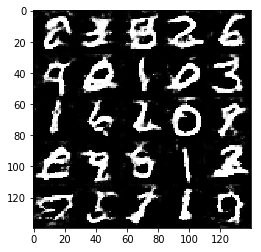

Epoch 2/3... Discriminator Loss: 0.8129... Generator Loss: 1.1214
Epoch 2/3... Discriminator Loss: 0.5791... Generator Loss: 1.2413
Epoch 2/3... Discriminator Loss: 0.7478... Generator Loss: 2.2599
Epoch 2/3... Discriminator Loss: 0.6187... Generator Loss: 1.2902
Epoch 2/3... Discriminator Loss: 0.5367... Generator Loss: 1.3341
Epoch 2/3... Discriminator Loss: 0.5760... Generator Loss: 1.3530
Epoch 2/3... Discriminator Loss: 0.5912... Generator Loss: 1.1191
Epoch 2/3... Discriminator Loss: 0.9035... Generator Loss: 2.6651
Epoch 2/3... Discriminator Loss: 0.9471... Generator Loss: 0.6898
Epoch 2/3... Discriminator Loss: 0.5962... Generator Loss: 1.0690


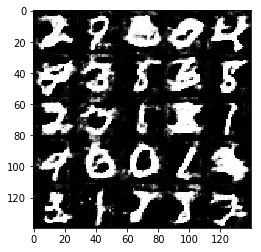

Epoch 2/3... Discriminator Loss: 0.6968... Generator Loss: 0.9336
Epoch 2/3... Discriminator Loss: 0.7902... Generator Loss: 0.7904
Epoch 2/3... Discriminator Loss: 0.8315... Generator Loss: 0.8672
Epoch 2/3... Discriminator Loss: 0.9470... Generator Loss: 0.6952
Epoch 2/3... Discriminator Loss: 0.8368... Generator Loss: 0.7484
Epoch 2/3... Discriminator Loss: 0.9241... Generator Loss: 1.5820
Epoch 2/3... Discriminator Loss: 1.2754... Generator Loss: 0.4082
Epoch 2/3... Discriminator Loss: 0.6978... Generator Loss: 2.3275
Epoch 2/3... Discriminator Loss: 0.7367... Generator Loss: 1.0353
Epoch 2/3... Discriminator Loss: 0.7405... Generator Loss: 0.9379


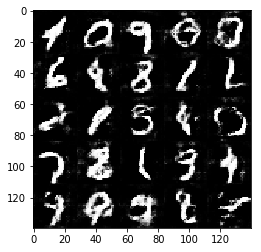

Epoch 2/3... Discriminator Loss: 0.5267... Generator Loss: 1.5304
Epoch 2/3... Discriminator Loss: 1.3830... Generator Loss: 0.3586
Epoch 2/3... Discriminator Loss: 0.7930... Generator Loss: 0.8864
Epoch 2/3... Discriminator Loss: 0.7316... Generator Loss: 0.9721
Epoch 2/3... Discriminator Loss: 0.8508... Generator Loss: 1.1849
Epoch 2/3... Discriminator Loss: 0.5910... Generator Loss: 1.7399
Epoch 2/3... Discriminator Loss: 1.1318... Generator Loss: 0.5234
Epoch 2/3... Discriminator Loss: 0.7500... Generator Loss: 1.2674
Epoch 2/3... Discriminator Loss: 1.2747... Generator Loss: 0.3963
Epoch 2/3... Discriminator Loss: 1.0045... Generator Loss: 0.9924


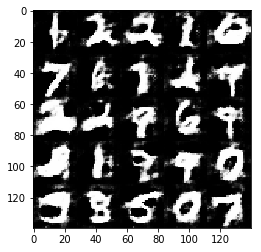

Epoch 2/3... Discriminator Loss: 0.5282... Generator Loss: 1.3011
Epoch 2/3... Discriminator Loss: 0.9242... Generator Loss: 0.7441
Epoch 2/3... Discriminator Loss: 0.8648... Generator Loss: 1.7192
Epoch 2/3... Discriminator Loss: 0.8465... Generator Loss: 0.8304
Epoch 2/3... Discriminator Loss: 0.8253... Generator Loss: 1.1108
Epoch 2/3... Discriminator Loss: 0.8572... Generator Loss: 0.7408
Epoch 2/3... Discriminator Loss: 0.7484... Generator Loss: 0.9739
Epoch 2/3... Discriminator Loss: 0.7581... Generator Loss: 0.9175
Epoch 2/3... Discriminator Loss: 1.0064... Generator Loss: 0.6592
Epoch 2/3... Discriminator Loss: 0.8489... Generator Loss: 2.3735


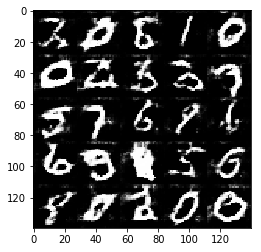

Epoch 2/3... Discriminator Loss: 1.2897... Generator Loss: 0.3760
Epoch 2/3... Discriminator Loss: 1.4117... Generator Loss: 0.3439
Epoch 2/3... Discriminator Loss: 0.5366... Generator Loss: 1.4104
Epoch 2/3... Discriminator Loss: 0.5583... Generator Loss: 1.5403
Epoch 2/3... Discriminator Loss: 0.6976... Generator Loss: 1.2466
Epoch 2/3... Discriminator Loss: 1.0902... Generator Loss: 0.5144
Epoch 2/3... Discriminator Loss: 1.1584... Generator Loss: 0.4737
Epoch 2/3... Discriminator Loss: 0.5844... Generator Loss: 1.1550
Epoch 2/3... Discriminator Loss: 0.8972... Generator Loss: 0.7972
Epoch 2/3... Discriminator Loss: 0.7597... Generator Loss: 0.8122


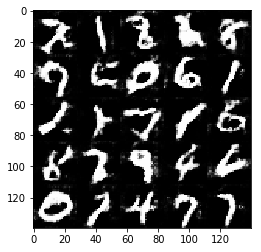

Epoch 2/3... Discriminator Loss: 0.8862... Generator Loss: 1.8191
Epoch 2/3... Discriminator Loss: 0.5957... Generator Loss: 1.1661
Epoch 2/3... Discriminator Loss: 0.7736... Generator Loss: 0.8291
Epoch 2/3... Discriminator Loss: 0.7698... Generator Loss: 0.8023
Epoch 2/3... Discriminator Loss: 0.6167... Generator Loss: 1.2292
Epoch 2/3... Discriminator Loss: 2.7833... Generator Loss: 0.1122
Epoch 2/3... Discriminator Loss: 0.7075... Generator Loss: 1.1047
Epoch 2/3... Discriminator Loss: 0.7215... Generator Loss: 0.8598
Epoch 2/3... Discriminator Loss: 0.7157... Generator Loss: 0.8667
Epoch 2/3... Discriminator Loss: 0.8005... Generator Loss: 0.7939


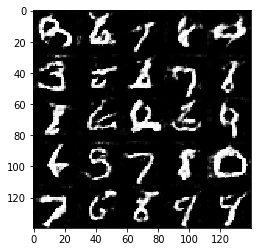

Epoch 2/3... Discriminator Loss: 0.8048... Generator Loss: 0.8167
Epoch 2/3... Discriminator Loss: 0.7234... Generator Loss: 0.8641
Epoch 2/3... Discriminator Loss: 1.1954... Generator Loss: 0.4366
Epoch 2/3... Discriminator Loss: 1.0475... Generator Loss: 1.0197
Epoch 2/3... Discriminator Loss: 0.8167... Generator Loss: 1.2410
Epoch 2/3... Discriminator Loss: 0.6011... Generator Loss: 1.0467
Epoch 2/3... Discriminator Loss: 0.8090... Generator Loss: 0.8229
Epoch 2/3... Discriminator Loss: 0.5496... Generator Loss: 1.1460
Epoch 2/3... Discriminator Loss: 1.8838... Generator Loss: 0.2056
Epoch 2/3... Discriminator Loss: 1.2455... Generator Loss: 0.4280


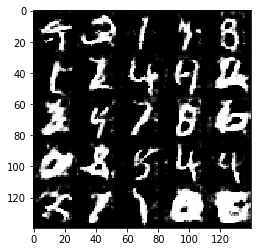

Epoch 2/3... Discriminator Loss: 0.8254... Generator Loss: 0.7951
Epoch 2/3... Discriminator Loss: 1.2300... Generator Loss: 0.4397
Epoch 2/3... Discriminator Loss: 0.6040... Generator Loss: 1.1238
Epoch 2/3... Discriminator Loss: 0.9347... Generator Loss: 0.6264
Epoch 2/3... Discriminator Loss: 1.4455... Generator Loss: 0.3393
Epoch 2/3... Discriminator Loss: 0.8180... Generator Loss: 2.2690
Epoch 2/3... Discriminator Loss: 0.5406... Generator Loss: 1.1492
Epoch 2/3... Discriminator Loss: 0.7292... Generator Loss: 0.9940
Epoch 3/3... Discriminator Loss: 0.8195... Generator Loss: 0.7629
Epoch 3/3... Discriminator Loss: 0.7253... Generator Loss: 1.3575


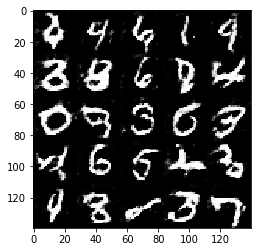

Epoch 3/3... Discriminator Loss: 1.8917... Generator Loss: 0.2069
Epoch 3/3... Discriminator Loss: 0.7369... Generator Loss: 0.9372
Epoch 3/3... Discriminator Loss: 0.6725... Generator Loss: 0.9518
Epoch 3/3... Discriminator Loss: 0.8969... Generator Loss: 0.7098
Epoch 3/3... Discriminator Loss: 0.9053... Generator Loss: 0.6402
Epoch 3/3... Discriminator Loss: 0.8505... Generator Loss: 0.7309
Epoch 3/3... Discriminator Loss: 0.4912... Generator Loss: 2.3423
Epoch 3/3... Discriminator Loss: 0.6747... Generator Loss: 1.0498
Epoch 3/3... Discriminator Loss: 1.5089... Generator Loss: 0.3259
Epoch 3/3... Discriminator Loss: 1.7643... Generator Loss: 0.2400


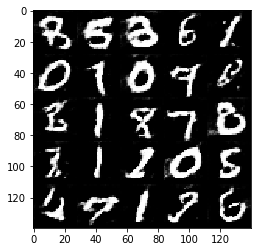

Epoch 3/3... Discriminator Loss: 0.8083... Generator Loss: 2.2367
Epoch 3/3... Discriminator Loss: 0.8621... Generator Loss: 0.6949
Epoch 3/3... Discriminator Loss: 1.3241... Generator Loss: 0.3906
Epoch 3/3... Discriminator Loss: 0.8154... Generator Loss: 0.8106
Epoch 3/3... Discriminator Loss: 0.9124... Generator Loss: 0.6388
Epoch 3/3... Discriminator Loss: 0.5381... Generator Loss: 1.4453
Epoch 3/3... Discriminator Loss: 1.8238... Generator Loss: 0.2366
Epoch 3/3... Discriminator Loss: 1.2131... Generator Loss: 0.4608
Epoch 3/3... Discriminator Loss: 0.6168... Generator Loss: 1.0699
Epoch 3/3... Discriminator Loss: 0.6050... Generator Loss: 0.9704


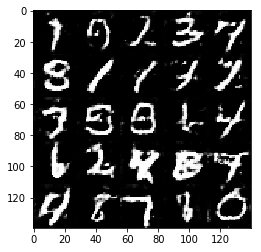

Epoch 3/3... Discriminator Loss: 1.0381... Generator Loss: 0.5955
Epoch 3/3... Discriminator Loss: 0.6869... Generator Loss: 0.8847
Epoch 3/3... Discriminator Loss: 0.5384... Generator Loss: 1.2426
Epoch 3/3... Discriminator Loss: 0.6263... Generator Loss: 1.0143
Epoch 3/3... Discriminator Loss: 1.3860... Generator Loss: 0.3637
Epoch 3/3... Discriminator Loss: 1.7232... Generator Loss: 0.2462
Epoch 3/3... Discriminator Loss: 0.9904... Generator Loss: 0.5969
Epoch 3/3... Discriminator Loss: 0.5191... Generator Loss: 1.4207
Epoch 3/3... Discriminator Loss: 1.4472... Generator Loss: 0.3152
Epoch 3/3... Discriminator Loss: 0.6562... Generator Loss: 2.2764


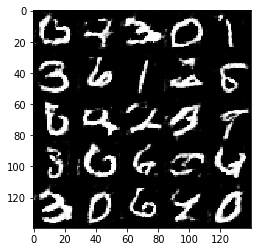

Epoch 3/3... Discriminator Loss: 2.2906... Generator Loss: 4.7228
Epoch 3/3... Discriminator Loss: 1.3604... Generator Loss: 2.4635
Epoch 3/3... Discriminator Loss: 0.6333... Generator Loss: 1.1386
Epoch 3/3... Discriminator Loss: 0.4757... Generator Loss: 1.5097
Epoch 3/3... Discriminator Loss: 0.8520... Generator Loss: 0.6959
Epoch 3/3... Discriminator Loss: 0.7154... Generator Loss: 0.9393
Epoch 3/3... Discriminator Loss: 0.5539... Generator Loss: 1.9639
Epoch 3/3... Discriminator Loss: 0.5191... Generator Loss: 1.2190
Epoch 3/3... Discriminator Loss: 0.6213... Generator Loss: 1.1329
Epoch 3/3... Discriminator Loss: 1.0771... Generator Loss: 0.5458


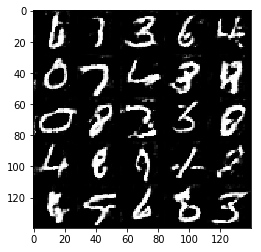

Epoch 3/3... Discriminator Loss: 0.9215... Generator Loss: 0.6746
Epoch 3/3... Discriminator Loss: 0.6574... Generator Loss: 2.2320
Epoch 3/3... Discriminator Loss: 0.5421... Generator Loss: 1.4142
Epoch 3/3... Discriminator Loss: 0.6355... Generator Loss: 2.1727
Epoch 3/3... Discriminator Loss: 0.7044... Generator Loss: 0.9789
Epoch 3/3... Discriminator Loss: 0.8103... Generator Loss: 0.7687
Epoch 3/3... Discriminator Loss: 0.7628... Generator Loss: 1.8788
Epoch 3/3... Discriminator Loss: 1.0666... Generator Loss: 0.5154
Epoch 3/3... Discriminator Loss: 1.1871... Generator Loss: 0.4705
Epoch 3/3... Discriminator Loss: 0.6376... Generator Loss: 1.0720


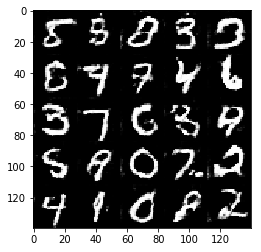

Epoch 3/3... Discriminator Loss: 0.6260... Generator Loss: 0.9359
Epoch 3/3... Discriminator Loss: 0.7734... Generator Loss: 0.8237
Epoch 3/3... Discriminator Loss: 0.9503... Generator Loss: 2.3619
Epoch 3/3... Discriminator Loss: 0.4754... Generator Loss: 1.2762
Epoch 3/3... Discriminator Loss: 1.2668... Generator Loss: 2.6499
Epoch 3/3... Discriminator Loss: 0.9775... Generator Loss: 0.6184
Epoch 3/3... Discriminator Loss: 0.7127... Generator Loss: 0.8922
Epoch 3/3... Discriminator Loss: 0.6245... Generator Loss: 0.9922
Epoch 3/3... Discriminator Loss: 0.5781... Generator Loss: 1.0455
Epoch 3/3... Discriminator Loss: 0.3209... Generator Loss: 1.8079


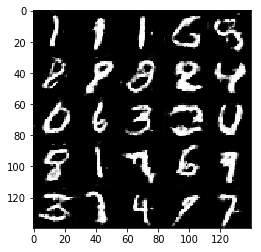

Epoch 3/3... Discriminator Loss: 0.9621... Generator Loss: 0.7526
Epoch 3/3... Discriminator Loss: 0.6530... Generator Loss: 1.1633
Epoch 3/3... Discriminator Loss: 0.5922... Generator Loss: 1.1766
Epoch 3/3... Discriminator Loss: 0.5969... Generator Loss: 1.1251
Epoch 3/3... Discriminator Loss: 0.7997... Generator Loss: 0.7530
Epoch 3/3... Discriminator Loss: 0.7404... Generator Loss: 1.6849
Epoch 3/3... Discriminator Loss: 0.5656... Generator Loss: 1.4944
Epoch 3/3... Discriminator Loss: 0.8860... Generator Loss: 0.6748
Epoch 3/3... Discriminator Loss: 2.4125... Generator Loss: 0.1248
Epoch 3/3... Discriminator Loss: 0.6382... Generator Loss: 1.2108


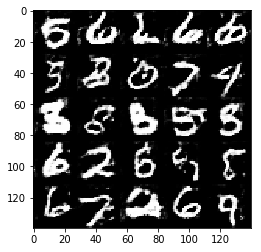

Epoch 3/3... Discriminator Loss: 1.0246... Generator Loss: 0.5616
Epoch 3/3... Discriminator Loss: 0.4816... Generator Loss: 1.3875
Epoch 3/3... Discriminator Loss: 0.9956... Generator Loss: 0.5906
Epoch 3/3... Discriminator Loss: 0.6416... Generator Loss: 1.1034
Epoch 3/3... Discriminator Loss: 1.2294... Generator Loss: 0.4179
Epoch 3/3... Discriminator Loss: 1.0142... Generator Loss: 0.5943
Epoch 3/3... Discriminator Loss: 0.7821... Generator Loss: 0.8313
Epoch 3/3... Discriminator Loss: 0.5894... Generator Loss: 1.0277
Epoch 3/3... Discriminator Loss: 0.8245... Generator Loss: 1.2608
Epoch 3/3... Discriminator Loss: 0.6853... Generator Loss: 1.1541


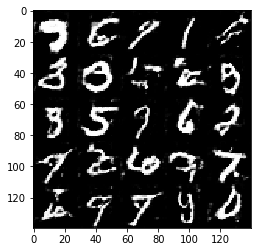

Epoch 3/3... Discriminator Loss: 0.9299... Generator Loss: 0.6517
Epoch 3/3... Discriminator Loss: 1.5387... Generator Loss: 0.2980
Epoch 3/3... Discriminator Loss: 0.7221... Generator Loss: 1.2027
Epoch 3/3... Discriminator Loss: 0.7229... Generator Loss: 0.9173
Epoch 3/3... Discriminator Loss: 0.4374... Generator Loss: 1.4138
Epoch 3/3... Discriminator Loss: 0.5280... Generator Loss: 1.1709
Epoch 3/3... Discriminator Loss: 1.1384... Generator Loss: 0.4895
Epoch 3/3... Discriminator Loss: 0.8327... Generator Loss: 0.8254
Epoch 3/3... Discriminator Loss: 1.4917... Generator Loss: 0.3353
Epoch 3/3... Discriminator Loss: 0.5541... Generator Loss: 1.1137


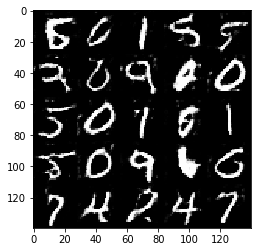

Epoch 3/3... Discriminator Loss: 0.4966... Generator Loss: 1.6495
Epoch 3/3... Discriminator Loss: 0.8827... Generator Loss: 0.7234


In [ ]:
batch_size = 64
z_dim = 100
learning_rate = 0.0001
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 3

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/5... Discriminator Loss: 0.3375... Generator Loss: 1.8306
Epoch 1/5... Discriminator Loss: 0.3006... Generator Loss: 1.6392
Epoch 1/5... Discriminator Loss: 0.1053... Generator Loss: 2.8164
Epoch 1/5... Discriminator Loss: 0.0892... Generator Loss: 5.2559
Epoch 1/5... Discriminator Loss: 0.1714... Generator Loss: 8.2113
Epoch 1/5... Discriminator Loss: 0.6928... Generator Loss: 1.0378
Epoch 1/5... Discriminator Loss: 0.4637... Generator Loss: 1.8565
Epoch 1/5... Discriminator Loss: 0.5092... Generator Loss: 1.3794
Epoch 1/5... Discriminator Loss: 0.7415... Generator Loss: 1.0440


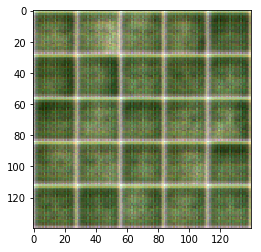

Epoch 1/5... Discriminator Loss: 0.7005... Generator Loss: 1.0828
Epoch 1/5... Discriminator Loss: 0.8040... Generator Loss: 0.7666
Epoch 1/5... Discriminator Loss: 0.4324... Generator Loss: 2.1599
Epoch 1/5... Discriminator Loss: 0.3682... Generator Loss: 2.0818
Epoch 1/5... Discriminator Loss: 0.7951... Generator Loss: 1.0130
Epoch 1/5... Discriminator Loss: 0.5287... Generator Loss: 1.3330
Epoch 1/5... Discriminator Loss: 1.0190... Generator Loss: 0.6607
Epoch 1/5... Discriminator Loss: 0.9626... Generator Loss: 0.7402
Epoch 1/5... Discriminator Loss: 0.9870... Generator Loss: 0.6743
Epoch 1/5... Discriminator Loss: 0.8304... Generator Loss: 3.9190


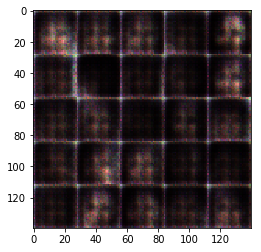

Epoch 1/5... Discriminator Loss: 1.1596... Generator Loss: 0.5632
Epoch 1/5... Discriminator Loss: 0.8788... Generator Loss: 0.8901
Epoch 1/5... Discriminator Loss: 0.6651... Generator Loss: 1.1754
Epoch 1/5... Discriminator Loss: 0.6408... Generator Loss: 1.1552
Epoch 1/5... Discriminator Loss: 1.2972... Generator Loss: 0.4543
Epoch 1/5... Discriminator Loss: 0.6015... Generator Loss: 1.3365
Epoch 1/5... Discriminator Loss: 1.0552... Generator Loss: 0.7547
Epoch 1/5... Discriminator Loss: 0.8762... Generator Loss: 0.9181
Epoch 1/5... Discriminator Loss: 0.5393... Generator Loss: 1.5276
Epoch 1/5... Discriminator Loss: 0.8422... Generator Loss: 0.8801


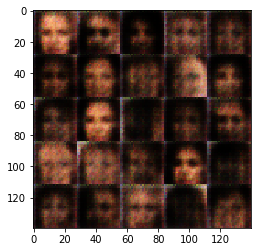

Epoch 1/5... Discriminator Loss: 0.9840... Generator Loss: 2.2002
Epoch 1/5... Discriminator Loss: 0.7704... Generator Loss: 0.9985
Epoch 1/5... Discriminator Loss: 0.7947... Generator Loss: 1.1936
Epoch 1/5... Discriminator Loss: 0.6542... Generator Loss: 1.3521
Epoch 1/5... Discriminator Loss: 0.5674... Generator Loss: 1.9739
Epoch 1/5... Discriminator Loss: 0.6491... Generator Loss: 1.3735
Epoch 1/5... Discriminator Loss: 0.6623... Generator Loss: 1.3220
Epoch 1/5... Discriminator Loss: 0.5864... Generator Loss: 2.2541
Epoch 1/5... Discriminator Loss: 0.9491... Generator Loss: 1.3010
Epoch 1/5... Discriminator Loss: 0.7940... Generator Loss: 1.0729


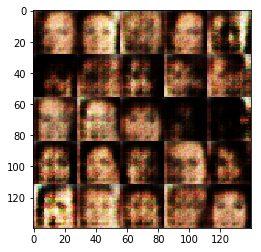

Epoch 1/5... Discriminator Loss: 1.0691... Generator Loss: 0.7801
Epoch 1/5... Discriminator Loss: 1.0953... Generator Loss: 0.6639
Epoch 1/5... Discriminator Loss: 0.7980... Generator Loss: 1.5511
Epoch 1/5... Discriminator Loss: 1.2056... Generator Loss: 0.6054
Epoch 1/5... Discriminator Loss: 0.9705... Generator Loss: 1.4018
Epoch 1/5... Discriminator Loss: 0.9672... Generator Loss: 2.5026
Epoch 1/5... Discriminator Loss: 1.0563... Generator Loss: 0.8097
Epoch 1/5... Discriminator Loss: 0.7659... Generator Loss: 2.6741
Epoch 1/5... Discriminator Loss: 1.1871... Generator Loss: 0.5246
Epoch 1/5... Discriminator Loss: 0.8636... Generator Loss: 1.7127


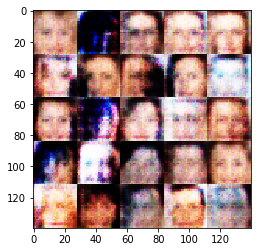

Epoch 1/5... Discriminator Loss: 0.8152... Generator Loss: 1.0535
Epoch 1/5... Discriminator Loss: 0.9735... Generator Loss: 1.7542
Epoch 1/5... Discriminator Loss: 0.9294... Generator Loss: 1.3334
Epoch 1/5... Discriminator Loss: 0.9352... Generator Loss: 0.7490
Epoch 1/5... Discriminator Loss: 0.7611... Generator Loss: 1.5518
Epoch 1/5... Discriminator Loss: 0.7506... Generator Loss: 1.3174
Epoch 1/5... Discriminator Loss: 1.0824... Generator Loss: 2.4145
Epoch 1/5... Discriminator Loss: 1.0102... Generator Loss: 1.7782
Epoch 1/5... Discriminator Loss: 0.9038... Generator Loss: 1.1092
Epoch 1/5... Discriminator Loss: 0.8877... Generator Loss: 1.0493


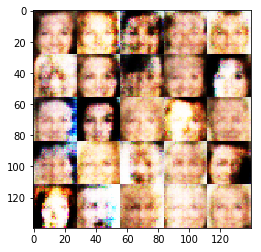

Epoch 1/5... Discriminator Loss: 0.9695... Generator Loss: 0.8595
Epoch 1/5... Discriminator Loss: 0.7850... Generator Loss: 1.0613
Epoch 1/5... Discriminator Loss: 0.8024... Generator Loss: 1.1662
Epoch 1/5... Discriminator Loss: 0.9204... Generator Loss: 1.9698
Epoch 1/5... Discriminator Loss: 0.8746... Generator Loss: 0.7391
Epoch 1/5... Discriminator Loss: 0.9919... Generator Loss: 0.7492
Epoch 1/5... Discriminator Loss: 0.9010... Generator Loss: 1.4629
Epoch 1/5... Discriminator Loss: 0.8624... Generator Loss: 0.9385
Epoch 1/5... Discriminator Loss: 0.8903... Generator Loss: 2.5821
Epoch 1/5... Discriminator Loss: 0.8108... Generator Loss: 1.0390


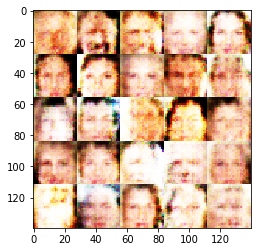

Epoch 1/5... Discriminator Loss: 1.1192... Generator Loss: 0.6587
Epoch 1/5... Discriminator Loss: 0.9598... Generator Loss: 1.2937
Epoch 1/5... Discriminator Loss: 0.8266... Generator Loss: 1.1016
Epoch 1/5... Discriminator Loss: 0.9161... Generator Loss: 0.8695
Epoch 1/5... Discriminator Loss: 0.6898... Generator Loss: 1.1967
Epoch 1/5... Discriminator Loss: 1.0627... Generator Loss: 0.8423
Epoch 1/5... Discriminator Loss: 0.8857... Generator Loss: 0.9879
Epoch 1/5... Discriminator Loss: 0.8812... Generator Loss: 0.9098
Epoch 1/5... Discriminator Loss: 0.9725... Generator Loss: 1.6689
Epoch 1/5... Discriminator Loss: 0.8330... Generator Loss: 0.9048


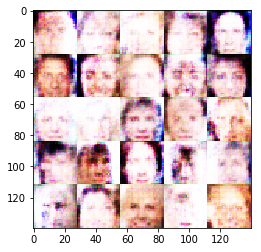

Epoch 1/5... Discriminator Loss: 0.9637... Generator Loss: 0.8304
Epoch 1/5... Discriminator Loss: 0.8967... Generator Loss: 0.9161
Epoch 1/5... Discriminator Loss: 1.1280... Generator Loss: 0.5763
Epoch 1/5... Discriminator Loss: 0.7634... Generator Loss: 1.1221
Epoch 1/5... Discriminator Loss: 0.8775... Generator Loss: 0.9099
Epoch 1/5... Discriminator Loss: 0.8624... Generator Loss: 1.8952
Epoch 1/5... Discriminator Loss: 1.1154... Generator Loss: 0.8935
Epoch 1/5... Discriminator Loss: 1.0572... Generator Loss: 0.7235
Epoch 1/5... Discriminator Loss: 0.8600... Generator Loss: 1.0130
Epoch 1/5... Discriminator Loss: 0.8191... Generator Loss: 1.1368


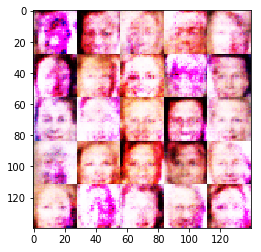

Epoch 1/5... Discriminator Loss: 1.0360... Generator Loss: 0.7167
Epoch 1/5... Discriminator Loss: 0.8563... Generator Loss: 1.1731
Epoch 1/5... Discriminator Loss: 0.8043... Generator Loss: 1.1039
Epoch 1/5... Discriminator Loss: 0.8839... Generator Loss: 1.4110
Epoch 1/5... Discriminator Loss: 0.8178... Generator Loss: 0.9506
Epoch 1/5... Discriminator Loss: 0.9476... Generator Loss: 0.8337
Epoch 1/5... Discriminator Loss: 0.9584... Generator Loss: 0.9309
Epoch 1/5... Discriminator Loss: 0.7793... Generator Loss: 1.0337
Epoch 1/5... Discriminator Loss: 0.9640... Generator Loss: 0.7154
Epoch 1/5... Discriminator Loss: 1.0581... Generator Loss: 0.8080


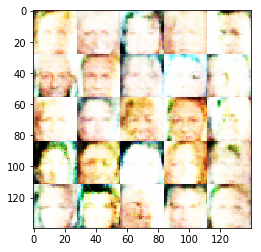

Epoch 1/5... Discriminator Loss: 0.8092... Generator Loss: 1.4343
Epoch 1/5... Discriminator Loss: 0.8826... Generator Loss: 1.1576
Epoch 1/5... Discriminator Loss: 1.0895... Generator Loss: 1.5756
Epoch 1/5... Discriminator Loss: 0.9497... Generator Loss: 0.8502
Epoch 1/5... Discriminator Loss: 0.8478... Generator Loss: 1.7701
Epoch 1/5... Discriminator Loss: 0.8021... Generator Loss: 1.3131
Epoch 1/5... Discriminator Loss: 0.9347... Generator Loss: 0.7746
Epoch 1/5... Discriminator Loss: 1.0901... Generator Loss: 0.7440
Epoch 1/5... Discriminator Loss: 0.9319... Generator Loss: 1.3053
Epoch 1/5... Discriminator Loss: 1.0552... Generator Loss: 0.5932


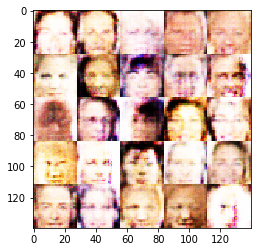

Epoch 1/5... Discriminator Loss: 0.9266... Generator Loss: 0.8200
Epoch 1/5... Discriminator Loss: 0.9895... Generator Loss: 0.6916
Epoch 1/5... Discriminator Loss: 1.1331... Generator Loss: 0.5565
Epoch 1/5... Discriminator Loss: 0.7391... Generator Loss: 1.0319
Epoch 1/5... Discriminator Loss: 1.0478... Generator Loss: 0.8389
Epoch 1/5... Discriminator Loss: 0.8535... Generator Loss: 0.9009
Epoch 1/5... Discriminator Loss: 1.1654... Generator Loss: 0.5420
Epoch 1/5... Discriminator Loss: 0.9018... Generator Loss: 1.0087
Epoch 1/5... Discriminator Loss: 0.7064... Generator Loss: 1.1952
Epoch 1/5... Discriminator Loss: 0.8722... Generator Loss: 0.8042


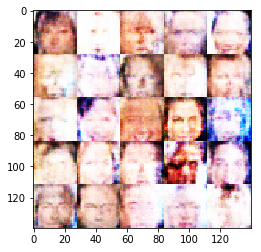

Epoch 1/5... Discriminator Loss: 0.9892... Generator Loss: 0.8096
Epoch 1/5... Discriminator Loss: 1.5130... Generator Loss: 0.3130
Epoch 1/5... Discriminator Loss: 0.7539... Generator Loss: 1.6624
Epoch 1/5... Discriminator Loss: 0.8912... Generator Loss: 0.8569
Epoch 1/5... Discriminator Loss: 0.9303... Generator Loss: 0.8283
Epoch 1/5... Discriminator Loss: 0.8944... Generator Loss: 0.9856
Epoch 1/5... Discriminator Loss: 1.0921... Generator Loss: 0.6014
Epoch 1/5... Discriminator Loss: 0.8910... Generator Loss: 1.0531
Epoch 1/5... Discriminator Loss: 1.0443... Generator Loss: 0.5956
Epoch 1/5... Discriminator Loss: 1.0537... Generator Loss: 0.5737


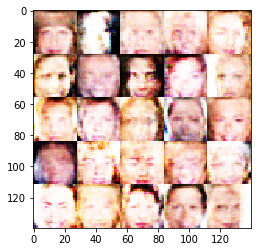

Epoch 1/5... Discriminator Loss: 1.0362... Generator Loss: 1.1774
Epoch 1/5... Discriminator Loss: 0.9841... Generator Loss: 0.7374
Epoch 1/5... Discriminator Loss: 1.3160... Generator Loss: 0.7227
Epoch 1/5... Discriminator Loss: 0.9380... Generator Loss: 0.7100
Epoch 1/5... Discriminator Loss: 1.0261... Generator Loss: 0.6859
Epoch 1/5... Discriminator Loss: 0.8639... Generator Loss: 0.9383
Epoch 1/5... Discriminator Loss: 0.6956... Generator Loss: 1.0135
Epoch 1/5... Discriminator Loss: 1.0441... Generator Loss: 1.2318
Epoch 1/5... Discriminator Loss: 1.1655... Generator Loss: 0.5637
Epoch 1/5... Discriminator Loss: 1.0667... Generator Loss: 0.6486


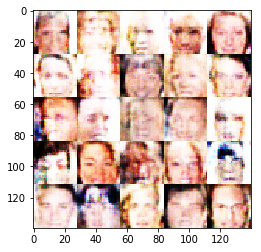

Epoch 1/5... Discriminator Loss: 0.8414... Generator Loss: 0.9638
Epoch 1/5... Discriminator Loss: 0.7447... Generator Loss: 1.1798
Epoch 1/5... Discriminator Loss: 0.7482... Generator Loss: 0.9892
Epoch 1/5... Discriminator Loss: 0.8512... Generator Loss: 0.8987
Epoch 1/5... Discriminator Loss: 0.9533... Generator Loss: 0.8367
Epoch 1/5... Discriminator Loss: 1.1135... Generator Loss: 0.5488
Epoch 1/5... Discriminator Loss: 0.7682... Generator Loss: 0.9412
Epoch 1/5... Discriminator Loss: 0.8730... Generator Loss: 1.0008
Epoch 1/5... Discriminator Loss: 0.9398... Generator Loss: 1.3017
Epoch 1/5... Discriminator Loss: 0.7878... Generator Loss: 0.8941


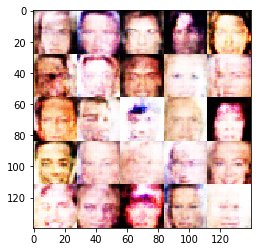

Epoch 1/5... Discriminator Loss: 0.8101... Generator Loss: 1.1450
Epoch 1/5... Discriminator Loss: 0.7950... Generator Loss: 1.2027
Epoch 1/5... Discriminator Loss: 0.8814... Generator Loss: 0.8991
Epoch 1/5... Discriminator Loss: 1.1133... Generator Loss: 0.9303
Epoch 1/5... Discriminator Loss: 0.9958... Generator Loss: 0.7332
Epoch 1/5... Discriminator Loss: 0.9869... Generator Loss: 0.6558
Epoch 1/5... Discriminator Loss: 0.9913... Generator Loss: 0.7795
Epoch 1/5... Discriminator Loss: 0.7692... Generator Loss: 1.1384
Epoch 1/5... Discriminator Loss: 0.9596... Generator Loss: 0.7269
Epoch 1/5... Discriminator Loss: 1.2418... Generator Loss: 0.4984


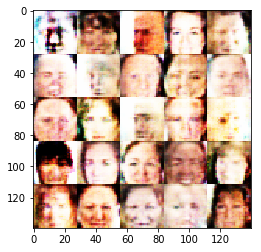

Epoch 1/5... Discriminator Loss: 0.8530... Generator Loss: 1.2521
Epoch 1/5... Discriminator Loss: 0.8463... Generator Loss: 1.1076
Epoch 1/5... Discriminator Loss: 0.9965... Generator Loss: 0.8124
Epoch 1/5... Discriminator Loss: 0.9659... Generator Loss: 1.4359
Epoch 1/5... Discriminator Loss: 1.0129... Generator Loss: 0.6651
Epoch 1/5... Discriminator Loss: 1.0198... Generator Loss: 0.7257
Epoch 1/5... Discriminator Loss: 0.8124... Generator Loss: 1.1217
Epoch 1/5... Discriminator Loss: 0.7260... Generator Loss: 1.1630
Epoch 1/5... Discriminator Loss: 0.9299... Generator Loss: 0.8875
Epoch 1/5... Discriminator Loss: 0.8114... Generator Loss: 1.3120


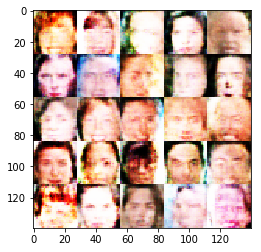

Epoch 1/5... Discriminator Loss: 0.9247... Generator Loss: 1.0972
Epoch 1/5... Discriminator Loss: 1.0597... Generator Loss: 0.5720
Epoch 1/5... Discriminator Loss: 1.4579... Generator Loss: 0.3378
Epoch 1/5... Discriminator Loss: 1.0020... Generator Loss: 0.8094
Epoch 1/5... Discriminator Loss: 1.0595... Generator Loss: 1.2536
Epoch 1/5... Discriminator Loss: 1.0889... Generator Loss: 0.6197
Epoch 1/5... Discriminator Loss: 1.0413... Generator Loss: 0.7777
Epoch 1/5... Discriminator Loss: 1.1382... Generator Loss: 0.7007
Epoch 1/5... Discriminator Loss: 0.8803... Generator Loss: 0.8417
Epoch 1/5... Discriminator Loss: 1.1899... Generator Loss: 0.4874


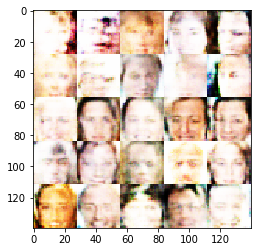

Epoch 1/5... Discriminator Loss: 1.1411... Generator Loss: 0.5758
Epoch 1/5... Discriminator Loss: 0.9328... Generator Loss: 1.0116
Epoch 1/5... Discriminator Loss: 0.7985... Generator Loss: 0.8600
Epoch 1/5... Discriminator Loss: 0.9817... Generator Loss: 0.7401
Epoch 1/5... Discriminator Loss: 1.1153... Generator Loss: 0.5928
Epoch 1/5... Discriminator Loss: 0.8354... Generator Loss: 1.0482
Epoch 1/5... Discriminator Loss: 1.0757... Generator Loss: 0.6240
Epoch 1/5... Discriminator Loss: 0.9255... Generator Loss: 0.8579
Epoch 1/5... Discriminator Loss: 1.1322... Generator Loss: 0.5506
Epoch 1/5... Discriminator Loss: 0.7790... Generator Loss: 1.8169


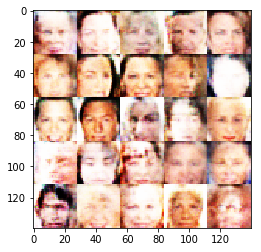

Epoch 1/5... Discriminator Loss: 0.6684... Generator Loss: 1.3297
Epoch 1/5... Discriminator Loss: 0.8981... Generator Loss: 1.1908
Epoch 1/5... Discriminator Loss: 0.9264... Generator Loss: 0.7469
Epoch 1/5... Discriminator Loss: 0.8342... Generator Loss: 1.2753
Epoch 1/5... Discriminator Loss: 0.9920... Generator Loss: 0.9856
Epoch 1/5... Discriminator Loss: 0.8870... Generator Loss: 0.7888
Epoch 1/5... Discriminator Loss: 1.0651... Generator Loss: 0.6574
Epoch 1/5... Discriminator Loss: 1.0098... Generator Loss: 0.6385
Epoch 1/5... Discriminator Loss: 0.9191... Generator Loss: 0.9019
Epoch 1/5... Discriminator Loss: 1.0696... Generator Loss: 0.6070


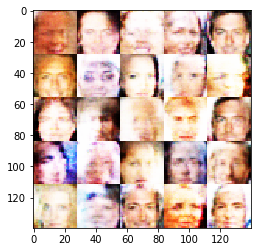

Epoch 1/5... Discriminator Loss: 0.8915... Generator Loss: 0.9492
Epoch 1/5... Discriminator Loss: 0.8169... Generator Loss: 1.0265
Epoch 1/5... Discriminator Loss: 0.8306... Generator Loss: 0.8665
Epoch 1/5... Discriminator Loss: 0.7618... Generator Loss: 1.0120
Epoch 1/5... Discriminator Loss: 0.8007... Generator Loss: 1.4097
Epoch 1/5... Discriminator Loss: 0.8796... Generator Loss: 1.1893
Epoch 1/5... Discriminator Loss: 0.8789... Generator Loss: 0.9623
Epoch 1/5... Discriminator Loss: 1.0021... Generator Loss: 0.8235
Epoch 1/5... Discriminator Loss: 0.8281... Generator Loss: 1.0707
Epoch 1/5... Discriminator Loss: 0.8641... Generator Loss: 0.8429


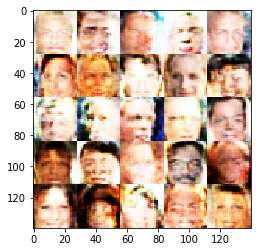

Epoch 1/5... Discriminator Loss: 0.9887... Generator Loss: 0.7087
Epoch 1/5... Discriminator Loss: 1.0863... Generator Loss: 0.5562
Epoch 1/5... Discriminator Loss: 1.0441... Generator Loss: 0.7096
Epoch 1/5... Discriminator Loss: 0.4973... Generator Loss: 1.4036
Epoch 1/5... Discriminator Loss: 0.8939... Generator Loss: 0.9318
Epoch 1/5... Discriminator Loss: 0.6605... Generator Loss: 1.0612
Epoch 1/5... Discriminator Loss: 0.8656... Generator Loss: 0.8730
Epoch 1/5... Discriminator Loss: 0.7811... Generator Loss: 1.1831
Epoch 1/5... Discriminator Loss: 1.1134... Generator Loss: 0.7030
Epoch 1/5... Discriminator Loss: 1.0173... Generator Loss: 0.7072


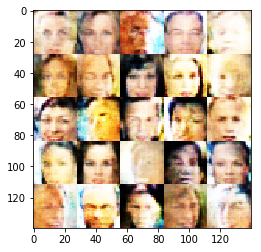

Epoch 1/5... Discriminator Loss: 0.9205... Generator Loss: 1.8867
Epoch 1/5... Discriminator Loss: 1.2183... Generator Loss: 0.4836
Epoch 1/5... Discriminator Loss: 0.9030... Generator Loss: 0.7553
Epoch 1/5... Discriminator Loss: 1.0162... Generator Loss: 0.7490
Epoch 1/5... Discriminator Loss: 0.9141... Generator Loss: 0.8118
Epoch 1/5... Discriminator Loss: 0.9605... Generator Loss: 0.7298
Epoch 1/5... Discriminator Loss: 0.7872... Generator Loss: 1.1120
Epoch 1/5... Discriminator Loss: 1.0061... Generator Loss: 0.6480
Epoch 1/5... Discriminator Loss: 1.0303... Generator Loss: 0.6029
Epoch 1/5... Discriminator Loss: 0.8458... Generator Loss: 0.9547


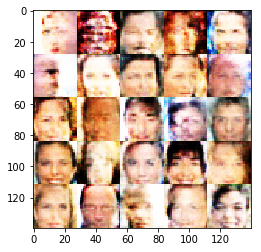

Epoch 1/5... Discriminator Loss: 0.8376... Generator Loss: 1.1601
Epoch 1/5... Discriminator Loss: 1.5111... Generator Loss: 0.3579
Epoch 1/5... Discriminator Loss: 1.1514... Generator Loss: 0.5989
Epoch 1/5... Discriminator Loss: 1.0416... Generator Loss: 0.7170
Epoch 1/5... Discriminator Loss: 1.1134... Generator Loss: 0.7876
Epoch 1/5... Discriminator Loss: 0.8329... Generator Loss: 0.9612
Epoch 1/5... Discriminator Loss: 0.9928... Generator Loss: 0.6900
Epoch 1/5... Discriminator Loss: 1.0602... Generator Loss: 0.5892
Epoch 1/5... Discriminator Loss: 0.6439... Generator Loss: 1.2802
Epoch 1/5... Discriminator Loss: 1.4199... Generator Loss: 2.1823


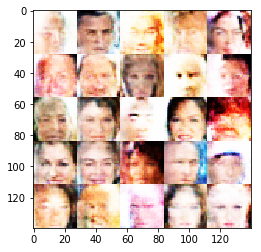

Epoch 1/5... Discriminator Loss: 0.9552... Generator Loss: 0.6608
Epoch 1/5... Discriminator Loss: 0.7536... Generator Loss: 0.9813
Epoch 1/5... Discriminator Loss: 0.7248... Generator Loss: 1.4649
Epoch 1/5... Discriminator Loss: 1.0071... Generator Loss: 0.6694
Epoch 1/5... Discriminator Loss: 0.8368... Generator Loss: 1.1700
Epoch 1/5... Discriminator Loss: 1.0257... Generator Loss: 0.6393
Epoch 1/5... Discriminator Loss: 0.9965... Generator Loss: 0.7291
Epoch 1/5... Discriminator Loss: 0.8475... Generator Loss: 0.8763
Epoch 1/5... Discriminator Loss: 1.2566... Generator Loss: 0.5048
Epoch 1/5... Discriminator Loss: 0.9514... Generator Loss: 0.6635


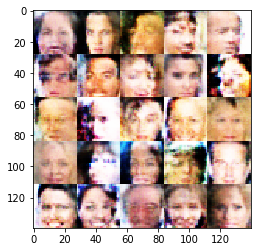

Epoch 1/5... Discriminator Loss: 0.8315... Generator Loss: 0.9348
Epoch 1/5... Discriminator Loss: 0.7664... Generator Loss: 1.3350
Epoch 1/5... Discriminator Loss: 0.8621... Generator Loss: 1.0166
Epoch 1/5... Discriminator Loss: 1.1240... Generator Loss: 0.5731
Epoch 1/5... Discriminator Loss: 1.0291... Generator Loss: 0.6577
Epoch 1/5... Discriminator Loss: 0.8509... Generator Loss: 1.7807
Epoch 1/5... Discriminator Loss: 0.8672... Generator Loss: 0.9613
Epoch 1/5... Discriminator Loss: 0.7334... Generator Loss: 1.1025
Epoch 1/5... Discriminator Loss: 1.2978... Generator Loss: 0.4421
Epoch 1/5... Discriminator Loss: 1.2357... Generator Loss: 0.4898


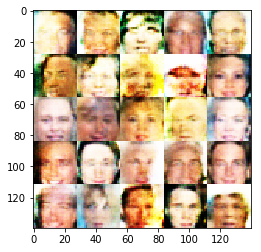

Epoch 1/5... Discriminator Loss: 0.8204... Generator Loss: 0.9698
Epoch 1/5... Discriminator Loss: 1.0832... Generator Loss: 1.8345
Epoch 1/5... Discriminator Loss: 0.7724... Generator Loss: 1.0292
Epoch 1/5... Discriminator Loss: 1.3243... Generator Loss: 0.4381
Epoch 1/5... Discriminator Loss: 0.9189... Generator Loss: 0.8348
Epoch 1/5... Discriminator Loss: 1.0893... Generator Loss: 0.5414
Epoch 1/5... Discriminator Loss: 0.8272... Generator Loss: 0.9677
Epoch 1/5... Discriminator Loss: 0.7819... Generator Loss: 0.9192
Epoch 1/5... Discriminator Loss: 1.0250... Generator Loss: 1.2355
Epoch 1/5... Discriminator Loss: 0.7569... Generator Loss: 1.2224


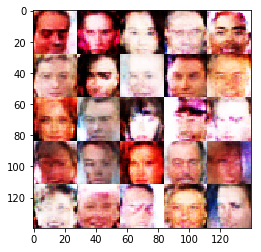

Epoch 1/5... Discriminator Loss: 1.5111... Generator Loss: 0.3430
Epoch 1/5... Discriminator Loss: 1.2010... Generator Loss: 0.4934
Epoch 1/5... Discriminator Loss: 0.8619... Generator Loss: 1.0001
Epoch 1/5... Discriminator Loss: 1.0065... Generator Loss: 0.7497
Epoch 1/5... Discriminator Loss: 0.7994... Generator Loss: 0.9277
Epoch 1/5... Discriminator Loss: 1.0249... Generator Loss: 0.7077
Epoch 1/5... Discriminator Loss: 0.9451... Generator Loss: 0.7005
Epoch 1/5... Discriminator Loss: 0.7692... Generator Loss: 1.0419
Epoch 1/5... Discriminator Loss: 1.1644... Generator Loss: 0.6523
Epoch 1/5... Discriminator Loss: 0.8557... Generator Loss: 0.8805


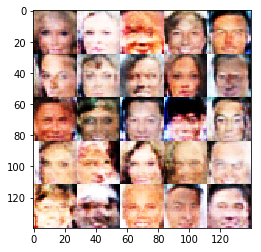

Epoch 1/5... Discriminator Loss: 1.1669... Generator Loss: 0.5609
Epoch 1/5... Discriminator Loss: 1.2618... Generator Loss: 0.6175
Epoch 1/5... Discriminator Loss: 1.1589... Generator Loss: 0.6174
Epoch 1/5... Discriminator Loss: 1.0455... Generator Loss: 0.6667
Epoch 1/5... Discriminator Loss: 0.8871... Generator Loss: 0.7213
Epoch 1/5... Discriminator Loss: 1.2593... Generator Loss: 0.4561
Epoch 1/5... Discriminator Loss: 0.8931... Generator Loss: 0.8569
Epoch 1/5... Discriminator Loss: 0.8661... Generator Loss: 0.8495
Epoch 1/5... Discriminator Loss: 0.8186... Generator Loss: 1.5424
Epoch 1/5... Discriminator Loss: 0.7622... Generator Loss: 1.1881


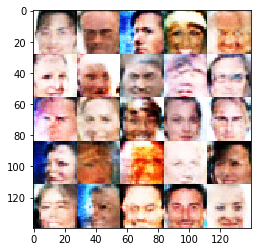

Epoch 1/5... Discriminator Loss: 0.9862... Generator Loss: 0.6580
Epoch 1/5... Discriminator Loss: 0.8013... Generator Loss: 0.8295
Epoch 1/5... Discriminator Loss: 0.6199... Generator Loss: 1.1824
Epoch 1/5... Discriminator Loss: 1.0530... Generator Loss: 0.6201
Epoch 1/5... Discriminator Loss: 0.8740... Generator Loss: 0.8874
Epoch 1/5... Discriminator Loss: 0.7815... Generator Loss: 1.2666
Epoch 1/5... Discriminator Loss: 0.9056... Generator Loss: 0.7286
Epoch 1/5... Discriminator Loss: 0.8299... Generator Loss: 0.9396
Epoch 1/5... Discriminator Loss: 0.9400... Generator Loss: 0.9332
Epoch 1/5... Discriminator Loss: 1.0820... Generator Loss: 0.8371


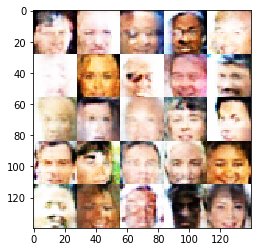

Epoch 1/5... Discriminator Loss: 0.9709... Generator Loss: 0.7173
Epoch 1/5... Discriminator Loss: 1.2373... Generator Loss: 1.2686
Epoch 1/5... Discriminator Loss: 0.8045... Generator Loss: 0.9727
Epoch 1/5... Discriminator Loss: 0.6068... Generator Loss: 1.4501
Epoch 1/5... Discriminator Loss: 1.2368... Generator Loss: 0.4734
Epoch 1/5... Discriminator Loss: 0.7492... Generator Loss: 1.5209
Epoch 1/5... Discriminator Loss: 0.9554... Generator Loss: 0.8023
Epoch 1/5... Discriminator Loss: 1.1517... Generator Loss: 0.6389
Epoch 1/5... Discriminator Loss: 0.9458... Generator Loss: 0.8545
Epoch 1/5... Discriminator Loss: 1.0845... Generator Loss: 0.6152


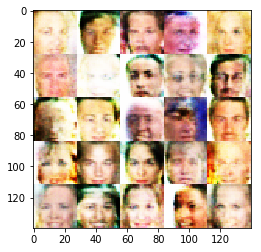

Epoch 1/5... Discriminator Loss: 0.9676... Generator Loss: 1.6177
Epoch 1/5... Discriminator Loss: 0.6308... Generator Loss: 1.2400
Epoch 1/5... Discriminator Loss: 0.7474... Generator Loss: 0.9632
Epoch 1/5... Discriminator Loss: 1.0581... Generator Loss: 0.5821
Epoch 1/5... Discriminator Loss: 1.1812... Generator Loss: 0.5355
Epoch 1/5... Discriminator Loss: 1.1025... Generator Loss: 0.5288
Epoch 1/5... Discriminator Loss: 0.9609... Generator Loss: 1.2429
Epoch 2/5... Discriminator Loss: 0.8104... Generator Loss: 1.0442
Epoch 2/5... Discriminator Loss: 0.8097... Generator Loss: 1.0768
Epoch 2/5... Discriminator Loss: 0.9320... Generator Loss: 1.3354


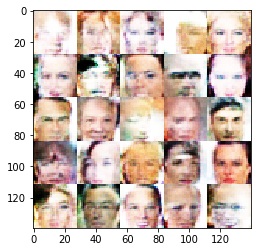

Epoch 2/5... Discriminator Loss: 1.1845... Generator Loss: 0.5370
Epoch 2/5... Discriminator Loss: 1.0290... Generator Loss: 0.6385
Epoch 2/5... Discriminator Loss: 0.9644... Generator Loss: 0.7095
Epoch 2/5... Discriminator Loss: 1.2637... Generator Loss: 0.5186
Epoch 2/5... Discriminator Loss: 1.1058... Generator Loss: 0.5999
Epoch 2/5... Discriminator Loss: 0.8287... Generator Loss: 0.8364
Epoch 2/5... Discriminator Loss: 0.9864... Generator Loss: 0.7786
Epoch 2/5... Discriminator Loss: 0.9639... Generator Loss: 0.6617
Epoch 2/5... Discriminator Loss: 0.7446... Generator Loss: 1.3693
Epoch 2/5... Discriminator Loss: 0.6053... Generator Loss: 1.2409


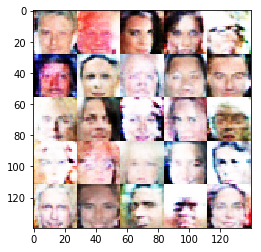

Epoch 2/5... Discriminator Loss: 1.3899... Generator Loss: 0.5425
Epoch 2/5... Discriminator Loss: 1.2943... Generator Loss: 0.4983
Epoch 2/5... Discriminator Loss: 0.8926... Generator Loss: 1.1059
Epoch 2/5... Discriminator Loss: 0.8078... Generator Loss: 1.0117
Epoch 2/5... Discriminator Loss: 1.2702... Generator Loss: 0.4613
Epoch 2/5... Discriminator Loss: 0.7850... Generator Loss: 1.1343
Epoch 2/5... Discriminator Loss: 0.8860... Generator Loss: 0.9679
Epoch 2/5... Discriminator Loss: 1.2474... Generator Loss: 0.5026
Epoch 2/5... Discriminator Loss: 1.1717... Generator Loss: 0.7045
Epoch 2/5... Discriminator Loss: 1.0467... Generator Loss: 0.6385


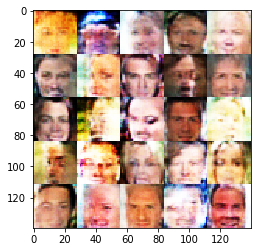

Epoch 2/5... Discriminator Loss: 1.0891... Generator Loss: 1.3299
Epoch 2/5... Discriminator Loss: 0.6683... Generator Loss: 1.1253
Epoch 2/5... Discriminator Loss: 0.8258... Generator Loss: 1.1486
Epoch 2/5... Discriminator Loss: 1.0680... Generator Loss: 0.8236
Epoch 2/5... Discriminator Loss: 0.7624... Generator Loss: 1.6291
Epoch 2/5... Discriminator Loss: 0.7952... Generator Loss: 0.9623
Epoch 2/5... Discriminator Loss: 0.8597... Generator Loss: 1.0734
Epoch 2/5... Discriminator Loss: 0.9097... Generator Loss: 0.8029
Epoch 2/5... Discriminator Loss: 0.9531... Generator Loss: 0.7612
Epoch 2/5... Discriminator Loss: 1.2609... Generator Loss: 0.4690


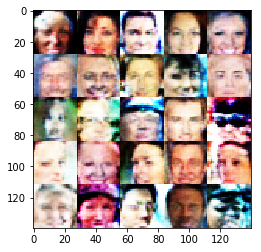

Epoch 2/5... Discriminator Loss: 0.8427... Generator Loss: 0.9021
Epoch 2/5... Discriminator Loss: 0.9995... Generator Loss: 0.6628
Epoch 2/5... Discriminator Loss: 0.8849... Generator Loss: 0.7556
Epoch 2/5... Discriminator Loss: 1.2216... Generator Loss: 0.4602
Epoch 2/5... Discriminator Loss: 0.8460... Generator Loss: 1.1640
Epoch 2/5... Discriminator Loss: 0.8368... Generator Loss: 0.8093
Epoch 2/5... Discriminator Loss: 0.8149... Generator Loss: 0.9525
Epoch 2/5... Discriminator Loss: 1.0861... Generator Loss: 0.5365
Epoch 2/5... Discriminator Loss: 0.8412... Generator Loss: 0.9528
Epoch 2/5... Discriminator Loss: 0.7729... Generator Loss: 1.0187


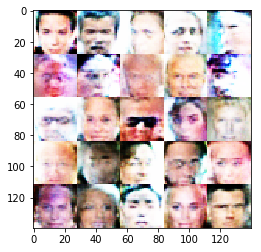

Epoch 2/5... Discriminator Loss: 0.6358... Generator Loss: 1.4822
Epoch 2/5... Discriminator Loss: 0.8621... Generator Loss: 0.7867
Epoch 2/5... Discriminator Loss: 0.9610... Generator Loss: 1.1414
Epoch 2/5... Discriminator Loss: 0.9871... Generator Loss: 0.9975
Epoch 2/5... Discriminator Loss: 1.0699... Generator Loss: 0.6141
Epoch 2/5... Discriminator Loss: 0.7395... Generator Loss: 0.9044
Epoch 2/5... Discriminator Loss: 0.9139... Generator Loss: 0.7580
Epoch 2/5... Discriminator Loss: 1.1314... Generator Loss: 0.5141
Epoch 2/5... Discriminator Loss: 1.0618... Generator Loss: 0.6188
Epoch 2/5... Discriminator Loss: 0.9160... Generator Loss: 1.3993


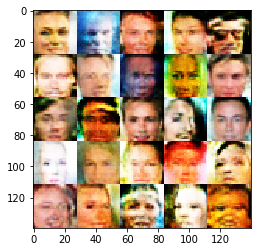

Epoch 2/5... Discriminator Loss: 1.3563... Generator Loss: 0.4362
Epoch 2/5... Discriminator Loss: 1.2894... Generator Loss: 0.4969
Epoch 2/5... Discriminator Loss: 1.0682... Generator Loss: 0.7542
Epoch 2/5... Discriminator Loss: 0.9732... Generator Loss: 0.7554
Epoch 2/5... Discriminator Loss: 1.1685... Generator Loss: 0.5323
Epoch 2/5... Discriminator Loss: 0.9331... Generator Loss: 1.2788
Epoch 2/5... Discriminator Loss: 0.7628... Generator Loss: 0.9319
Epoch 2/5... Discriminator Loss: 0.7248... Generator Loss: 1.1227
Epoch 2/5... Discriminator Loss: 1.1146... Generator Loss: 0.5797
Epoch 2/5... Discriminator Loss: 1.1704... Generator Loss: 0.4839


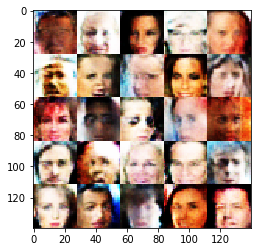

Epoch 2/5... Discriminator Loss: 0.9232... Generator Loss: 1.0809
Epoch 2/5... Discriminator Loss: 1.0310... Generator Loss: 0.7194
Epoch 2/5... Discriminator Loss: 1.0893... Generator Loss: 0.5905
Epoch 2/5... Discriminator Loss: 0.9630... Generator Loss: 0.7667
Epoch 2/5... Discriminator Loss: 0.6527... Generator Loss: 1.5372
Epoch 2/5... Discriminator Loss: 1.0786... Generator Loss: 0.6034
Epoch 2/5... Discriminator Loss: 0.8739... Generator Loss: 0.7567
Epoch 2/5... Discriminator Loss: 0.7116... Generator Loss: 1.4081
Epoch 2/5... Discriminator Loss: 0.9207... Generator Loss: 1.0738
Epoch 2/5... Discriminator Loss: 0.7341... Generator Loss: 1.3172


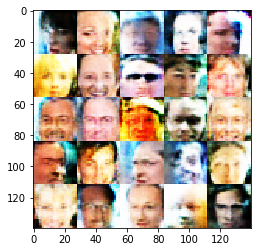

Epoch 2/5... Discriminator Loss: 0.8337... Generator Loss: 0.9142
Epoch 2/5... Discriminator Loss: 1.2664... Generator Loss: 0.4549
Epoch 2/5... Discriminator Loss: 0.8191... Generator Loss: 1.1977
Epoch 2/5... Discriminator Loss: 0.7402... Generator Loss: 1.3174
Epoch 2/5... Discriminator Loss: 0.9956... Generator Loss: 0.6506
Epoch 2/5... Discriminator Loss: 0.7978... Generator Loss: 0.9973
Epoch 2/5... Discriminator Loss: 0.9576... Generator Loss: 0.9605
Epoch 2/5... Discriminator Loss: 1.5020... Generator Loss: 0.3656
Epoch 2/5... Discriminator Loss: 1.1400... Generator Loss: 0.5189
Epoch 2/5... Discriminator Loss: 0.8924... Generator Loss: 0.8361


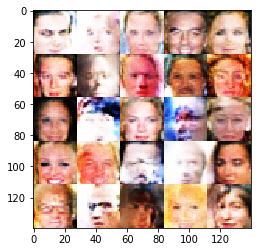

Epoch 2/5... Discriminator Loss: 0.8787... Generator Loss: 1.2195
Epoch 2/5... Discriminator Loss: 0.7316... Generator Loss: 1.0609
Epoch 2/5... Discriminator Loss: 0.8804... Generator Loss: 1.0254
Epoch 2/5... Discriminator Loss: 0.8380... Generator Loss: 0.7652
Epoch 2/5... Discriminator Loss: 0.7618... Generator Loss: 1.1783
Epoch 2/5... Discriminator Loss: 1.1120... Generator Loss: 0.5614
Epoch 2/5... Discriminator Loss: 1.0017... Generator Loss: 0.7357
Epoch 2/5... Discriminator Loss: 0.9543... Generator Loss: 0.7868
Epoch 2/5... Discriminator Loss: 1.4190... Generator Loss: 0.3568
Epoch 2/5... Discriminator Loss: 0.7762... Generator Loss: 0.9558


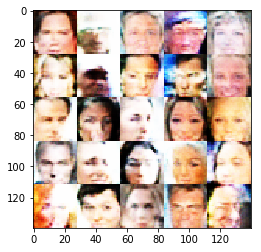

Epoch 2/5... Discriminator Loss: 1.2536... Generator Loss: 0.4810
Epoch 2/5... Discriminator Loss: 1.0153... Generator Loss: 0.7161
Epoch 2/5... Discriminator Loss: 1.1481... Generator Loss: 0.5742
Epoch 2/5... Discriminator Loss: 1.1954... Generator Loss: 0.4756
Epoch 2/5... Discriminator Loss: 1.1940... Generator Loss: 0.4868
Epoch 2/5... Discriminator Loss: 0.9690... Generator Loss: 0.6529
Epoch 2/5... Discriminator Loss: 0.9826... Generator Loss: 1.0839
Epoch 2/5... Discriminator Loss: 0.8384... Generator Loss: 0.8800
Epoch 2/5... Discriminator Loss: 0.7593... Generator Loss: 1.2284
Epoch 2/5... Discriminator Loss: 0.9071... Generator Loss: 0.9452


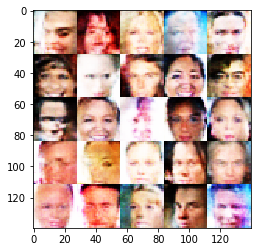

Epoch 2/5... Discriminator Loss: 0.9439... Generator Loss: 0.7598
Epoch 2/5... Discriminator Loss: 0.8800... Generator Loss: 0.9206
Epoch 2/5... Discriminator Loss: 1.2415... Generator Loss: 0.7015
Epoch 2/5... Discriminator Loss: 0.7608... Generator Loss: 1.0353
Epoch 2/5... Discriminator Loss: 1.0853... Generator Loss: 0.5319
Epoch 2/5... Discriminator Loss: 1.0416... Generator Loss: 0.6425
Epoch 2/5... Discriminator Loss: 1.0317... Generator Loss: 0.8684
Epoch 2/5... Discriminator Loss: 1.3157... Generator Loss: 0.4988
Epoch 2/5... Discriminator Loss: 1.1152... Generator Loss: 0.5355
Epoch 2/5... Discriminator Loss: 0.8234... Generator Loss: 0.8318


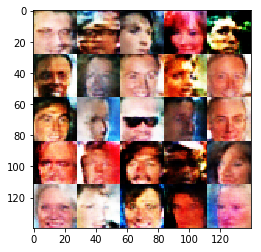

Epoch 2/5... Discriminator Loss: 1.0884... Generator Loss: 0.5871
Epoch 2/5... Discriminator Loss: 1.1503... Generator Loss: 0.6026
Epoch 2/5... Discriminator Loss: 0.6639... Generator Loss: 1.2382
Epoch 2/5... Discriminator Loss: 1.0562... Generator Loss: 0.6097
Epoch 2/5... Discriminator Loss: 1.1186... Generator Loss: 0.6256
Epoch 2/5... Discriminator Loss: 1.0920... Generator Loss: 0.6341
Epoch 2/5... Discriminator Loss: 1.0298... Generator Loss: 0.6339
Epoch 2/5... Discriminator Loss: 0.8679... Generator Loss: 1.4805
Epoch 2/5... Discriminator Loss: 1.5453... Generator Loss: 0.3276
Epoch 2/5... Discriminator Loss: 1.2685... Generator Loss: 0.4407


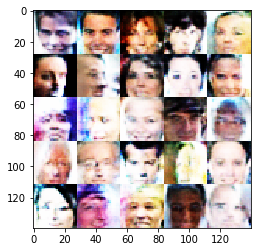

Epoch 2/5... Discriminator Loss: 1.1314... Generator Loss: 0.5248
Epoch 2/5... Discriminator Loss: 0.8782... Generator Loss: 0.7911
Epoch 2/5... Discriminator Loss: 1.1787... Generator Loss: 0.5525
Epoch 2/5... Discriminator Loss: 0.9046... Generator Loss: 0.7724
Epoch 2/5... Discriminator Loss: 0.7160... Generator Loss: 1.0351
Epoch 2/5... Discriminator Loss: 0.6524... Generator Loss: 1.2357
Epoch 2/5... Discriminator Loss: 1.0673... Generator Loss: 0.7992
Epoch 2/5... Discriminator Loss: 0.8151... Generator Loss: 1.3073
Epoch 2/5... Discriminator Loss: 0.7876... Generator Loss: 1.3555
Epoch 2/5... Discriminator Loss: 0.7381... Generator Loss: 1.0055


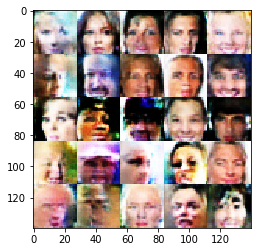

Epoch 2/5... Discriminator Loss: 0.8312... Generator Loss: 0.8832
Epoch 2/5... Discriminator Loss: 0.7401... Generator Loss: 1.3839
Epoch 2/5... Discriminator Loss: 0.7056... Generator Loss: 1.5783
Epoch 2/5... Discriminator Loss: 0.8954... Generator Loss: 0.9246
Epoch 2/5... Discriminator Loss: 0.9570... Generator Loss: 0.9717
Epoch 2/5... Discriminator Loss: 0.6869... Generator Loss: 1.0548
Epoch 2/5... Discriminator Loss: 1.0377... Generator Loss: 0.6706
Epoch 2/5... Discriminator Loss: 0.8913... Generator Loss: 0.7388
Epoch 2/5... Discriminator Loss: 0.8481... Generator Loss: 0.8860
Epoch 2/5... Discriminator Loss: 0.6807... Generator Loss: 1.1352


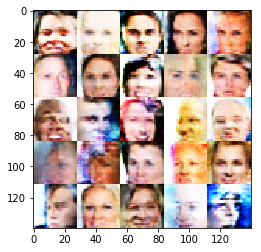

Epoch 2/5... Discriminator Loss: 0.9200... Generator Loss: 0.6796
Epoch 2/5... Discriminator Loss: 0.8653... Generator Loss: 1.3862
Epoch 2/5... Discriminator Loss: 1.0251... Generator Loss: 0.7788
Epoch 2/5... Discriminator Loss: 0.6060... Generator Loss: 1.1983
Epoch 2/5... Discriminator Loss: 0.9330... Generator Loss: 0.7637
Epoch 2/5... Discriminator Loss: 0.7335... Generator Loss: 1.2514
Epoch 2/5... Discriminator Loss: 1.1354... Generator Loss: 0.5470
Epoch 2/5... Discriminator Loss: 1.0536... Generator Loss: 0.7559
Epoch 2/5... Discriminator Loss: 0.8391... Generator Loss: 0.9446
Epoch 2/5... Discriminator Loss: 0.7615... Generator Loss: 0.9909


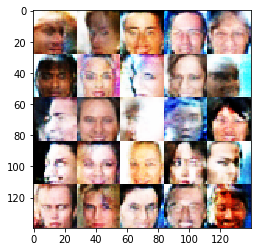

Epoch 2/5... Discriminator Loss: 0.8638... Generator Loss: 1.0219
Epoch 2/5... Discriminator Loss: 0.9375... Generator Loss: 1.1504
Epoch 2/5... Discriminator Loss: 0.9716... Generator Loss: 0.7136
Epoch 2/5... Discriminator Loss: 0.9740... Generator Loss: 0.7666
Epoch 2/5... Discriminator Loss: 0.7882... Generator Loss: 1.3100
Epoch 2/5... Discriminator Loss: 1.4076... Generator Loss: 0.5100
Epoch 2/5... Discriminator Loss: 0.8719... Generator Loss: 0.7907
Epoch 2/5... Discriminator Loss: 0.8031... Generator Loss: 0.8630
Epoch 2/5... Discriminator Loss: 1.0395... Generator Loss: 0.8092
Epoch 2/5... Discriminator Loss: 1.1654... Generator Loss: 0.7006


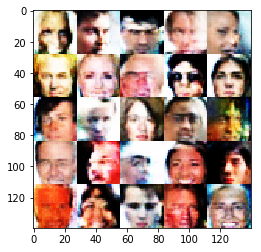

Epoch 2/5... Discriminator Loss: 0.8045... Generator Loss: 0.9367
Epoch 2/5... Discriminator Loss: 1.1698... Generator Loss: 0.7387
Epoch 2/5... Discriminator Loss: 1.1704... Generator Loss: 0.5475
Epoch 2/5... Discriminator Loss: 0.9769... Generator Loss: 0.6941
Epoch 2/5... Discriminator Loss: 0.8692... Generator Loss: 1.2051
Epoch 2/5... Discriminator Loss: 0.8581... Generator Loss: 1.1949
Epoch 2/5... Discriminator Loss: 1.5199... Generator Loss: 0.3824
Epoch 2/5... Discriminator Loss: 0.8118... Generator Loss: 0.9294
Epoch 2/5... Discriminator Loss: 0.8785... Generator Loss: 1.0137
Epoch 2/5... Discriminator Loss: 1.1293... Generator Loss: 1.3244


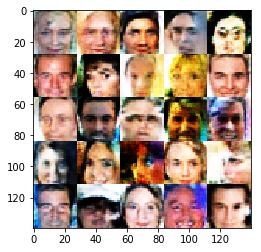

Epoch 2/5... Discriminator Loss: 0.7165... Generator Loss: 1.1518
Epoch 2/5... Discriminator Loss: 1.2766... Generator Loss: 0.4408
Epoch 2/5... Discriminator Loss: 0.9461... Generator Loss: 0.6827
Epoch 2/5... Discriminator Loss: 0.6491... Generator Loss: 1.3461
Epoch 2/5... Discriminator Loss: 1.2413... Generator Loss: 0.5295
Epoch 2/5... Discriminator Loss: 0.8841... Generator Loss: 1.2032
Epoch 2/5... Discriminator Loss: 0.9668... Generator Loss: 0.7242
Epoch 2/5... Discriminator Loss: 0.9983... Generator Loss: 0.8043
Epoch 2/5... Discriminator Loss: 1.0730... Generator Loss: 0.7791
Epoch 2/5... Discriminator Loss: 0.9677... Generator Loss: 0.7788


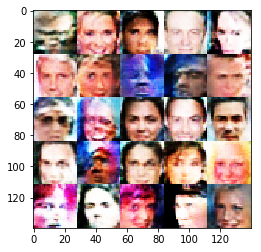

Epoch 2/5... Discriminator Loss: 0.9725... Generator Loss: 0.6395
Epoch 2/5... Discriminator Loss: 1.0676... Generator Loss: 0.6717
Epoch 2/5... Discriminator Loss: 0.9046... Generator Loss: 0.8183
Epoch 2/5... Discriminator Loss: 1.3619... Generator Loss: 0.4292
Epoch 2/5... Discriminator Loss: 1.3113... Generator Loss: 0.4072
Epoch 2/5... Discriminator Loss: 1.0522... Generator Loss: 0.6489
Epoch 2/5... Discriminator Loss: 1.2722... Generator Loss: 0.4485
Epoch 2/5... Discriminator Loss: 0.7550... Generator Loss: 1.2703
Epoch 2/5... Discriminator Loss: 0.7916... Generator Loss: 0.9913
Epoch 2/5... Discriminator Loss: 1.4558... Generator Loss: 0.3976


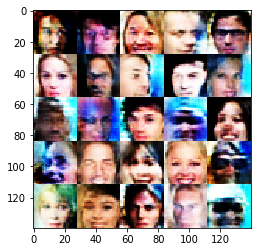

Epoch 2/5... Discriminator Loss: 1.3408... Generator Loss: 0.3954
Epoch 2/5... Discriminator Loss: 0.6529... Generator Loss: 1.1487
Epoch 2/5... Discriminator Loss: 0.6575... Generator Loss: 1.3275
Epoch 2/5... Discriminator Loss: 1.1996... Generator Loss: 0.5403
Epoch 2/5... Discriminator Loss: 0.9401... Generator Loss: 0.7095
Epoch 2/5... Discriminator Loss: 0.7602... Generator Loss: 1.1014
Epoch 2/5... Discriminator Loss: 1.0167... Generator Loss: 0.8124
Epoch 2/5... Discriminator Loss: 1.0703... Generator Loss: 0.5702
Epoch 2/5... Discriminator Loss: 1.1284... Generator Loss: 0.5039
Epoch 2/5... Discriminator Loss: 1.2487... Generator Loss: 0.4315


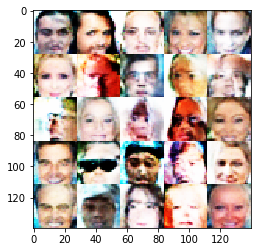

Epoch 2/5... Discriminator Loss: 0.7155... Generator Loss: 0.9350
Epoch 2/5... Discriminator Loss: 1.3221... Generator Loss: 0.7005
Epoch 2/5... Discriminator Loss: 0.8294... Generator Loss: 0.9558
Epoch 2/5... Discriminator Loss: 0.8075... Generator Loss: 1.1511
Epoch 2/5... Discriminator Loss: 1.0265... Generator Loss: 0.7028
Epoch 2/5... Discriminator Loss: 0.9449... Generator Loss: 0.7174
Epoch 2/5... Discriminator Loss: 0.9969... Generator Loss: 0.8651
Epoch 2/5... Discriminator Loss: 0.6651... Generator Loss: 1.2990
Epoch 2/5... Discriminator Loss: 1.2322... Generator Loss: 0.5390
Epoch 2/5... Discriminator Loss: 1.0885... Generator Loss: 0.5856


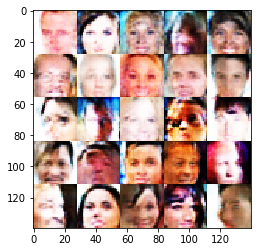

Epoch 2/5... Discriminator Loss: 1.2752... Generator Loss: 0.4632
Epoch 2/5... Discriminator Loss: 1.0931... Generator Loss: 0.8147
Epoch 2/5... Discriminator Loss: 1.1108... Generator Loss: 0.6105
Epoch 2/5... Discriminator Loss: 0.9538... Generator Loss: 0.8325
Epoch 2/5... Discriminator Loss: 1.2925... Generator Loss: 0.5006
Epoch 2/5... Discriminator Loss: 1.3226... Generator Loss: 0.3909
Epoch 2/5... Discriminator Loss: 0.5905... Generator Loss: 1.1590
Epoch 2/5... Discriminator Loss: 0.7568... Generator Loss: 0.9781
Epoch 2/5... Discriminator Loss: 1.3720... Generator Loss: 0.3744
Epoch 2/5... Discriminator Loss: 1.4051... Generator Loss: 0.3892


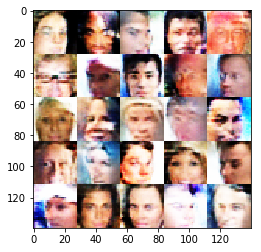

Epoch 2/5... Discriminator Loss: 0.6721... Generator Loss: 1.0875
Epoch 2/5... Discriminator Loss: 0.9482... Generator Loss: 0.6900
Epoch 2/5... Discriminator Loss: 1.2424... Generator Loss: 0.4826
Epoch 2/5... Discriminator Loss: 1.6451... Generator Loss: 0.3184
Epoch 2/5... Discriminator Loss: 0.8815... Generator Loss: 0.9788
Epoch 2/5... Discriminator Loss: 1.0466... Generator Loss: 0.9379
Epoch 2/5... Discriminator Loss: 0.8815... Generator Loss: 0.7006
Epoch 2/5... Discriminator Loss: 0.7710... Generator Loss: 1.3749
Epoch 2/5... Discriminator Loss: 1.0411... Generator Loss: 0.6776
Epoch 2/5... Discriminator Loss: 0.8408... Generator Loss: 0.8031


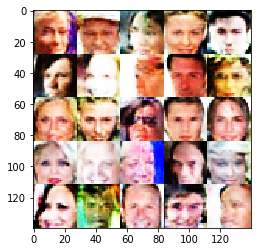

Epoch 2/5... Discriminator Loss: 0.7973... Generator Loss: 1.2241
Epoch 2/5... Discriminator Loss: 0.6478... Generator Loss: 1.0638
Epoch 2/5... Discriminator Loss: 0.8466... Generator Loss: 0.9383
Epoch 2/5... Discriminator Loss: 1.2563... Generator Loss: 0.5956
Epoch 2/5... Discriminator Loss: 0.8274... Generator Loss: 0.9099
Epoch 2/5... Discriminator Loss: 0.7922... Generator Loss: 1.1128
Epoch 2/5... Discriminator Loss: 0.7846... Generator Loss: 1.1510
Epoch 2/5... Discriminator Loss: 0.8586... Generator Loss: 1.8183
Epoch 2/5... Discriminator Loss: 0.9028... Generator Loss: 0.7921
Epoch 2/5... Discriminator Loss: 0.6189... Generator Loss: 1.1379


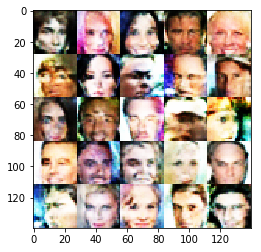

Epoch 2/5... Discriminator Loss: 0.9718... Generator Loss: 0.7324
Epoch 2/5... Discriminator Loss: 1.2647... Generator Loss: 0.4374
Epoch 2/5... Discriminator Loss: 0.8496... Generator Loss: 0.9407
Epoch 2/5... Discriminator Loss: 0.8079... Generator Loss: 1.0253
Epoch 2/5... Discriminator Loss: 0.9167... Generator Loss: 0.6788
Epoch 2/5... Discriminator Loss: 0.9506... Generator Loss: 0.7502
Epoch 2/5... Discriminator Loss: 1.1299... Generator Loss: 0.5737
Epoch 2/5... Discriminator Loss: 1.2451... Generator Loss: 0.5302
Epoch 2/5... Discriminator Loss: 0.7408... Generator Loss: 1.1289
Epoch 2/5... Discriminator Loss: 1.0530... Generator Loss: 0.5820


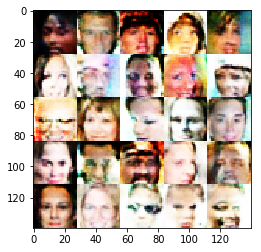

Epoch 2/5... Discriminator Loss: 0.8404... Generator Loss: 0.7784
Epoch 2/5... Discriminator Loss: 0.8212... Generator Loss: 0.7588
Epoch 2/5... Discriminator Loss: 1.1058... Generator Loss: 0.6290
Epoch 2/5... Discriminator Loss: 1.2283... Generator Loss: 0.5383
Epoch 2/5... Discriminator Loss: 1.0100... Generator Loss: 0.6635
Epoch 2/5... Discriminator Loss: 0.7897... Generator Loss: 0.9437
Epoch 2/5... Discriminator Loss: 1.4485... Generator Loss: 0.3348
Epoch 2/5... Discriminator Loss: 1.6147... Generator Loss: 0.5598
Epoch 2/5... Discriminator Loss: 1.5025... Generator Loss: 0.3281
Epoch 2/5... Discriminator Loss: 0.9660... Generator Loss: 0.6742


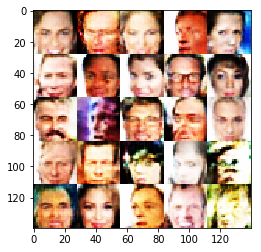

Epoch 2/5... Discriminator Loss: 0.7175... Generator Loss: 0.9516
Epoch 2/5... Discriminator Loss: 1.1508... Generator Loss: 0.5495
Epoch 2/5... Discriminator Loss: 0.9517... Generator Loss: 0.7844
Epoch 2/5... Discriminator Loss: 0.9480... Generator Loss: 0.7287
Epoch 2/5... Discriminator Loss: 0.8475... Generator Loss: 1.1126
Epoch 2/5... Discriminator Loss: 1.0610... Generator Loss: 0.6815
Epoch 2/5... Discriminator Loss: 0.7595... Generator Loss: 1.3502
Epoch 2/5... Discriminator Loss: 0.6527... Generator Loss: 1.2379
Epoch 2/5... Discriminator Loss: 0.4536... Generator Loss: 1.5474
Epoch 2/5... Discriminator Loss: 0.7103... Generator Loss: 1.0334


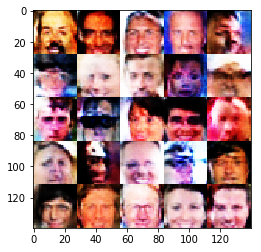

Epoch 2/5... Discriminator Loss: 1.1976... Generator Loss: 0.5014
Epoch 2/5... Discriminator Loss: 1.0924... Generator Loss: 0.5993
Epoch 2/5... Discriminator Loss: 0.9708... Generator Loss: 0.7066
Epoch 2/5... Discriminator Loss: 1.1703... Generator Loss: 0.5403
Epoch 2/5... Discriminator Loss: 1.0136... Generator Loss: 0.6718
Epoch 2/5... Discriminator Loss: 1.0755... Generator Loss: 0.6442
Epoch 2/5... Discriminator Loss: 0.6745... Generator Loss: 1.1846
Epoch 2/5... Discriminator Loss: 0.9269... Generator Loss: 0.7778
Epoch 2/5... Discriminator Loss: 1.1449... Generator Loss: 0.5042
Epoch 2/5... Discriminator Loss: 1.1403... Generator Loss: 0.4910


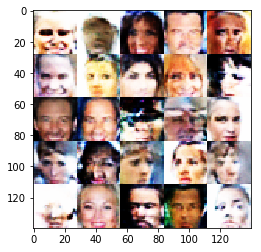

Epoch 2/5... Discriminator Loss: 0.8929... Generator Loss: 0.8231
Epoch 2/5... Discriminator Loss: 1.0466... Generator Loss: 0.6651
Epoch 2/5... Discriminator Loss: 1.1318... Generator Loss: 0.5430
Epoch 2/5... Discriminator Loss: 0.7344... Generator Loss: 0.9737
Epoch 2/5... Discriminator Loss: 0.6129... Generator Loss: 1.2466
Epoch 2/5... Discriminator Loss: 1.3963... Generator Loss: 0.3973
Epoch 2/5... Discriminator Loss: 1.0353... Generator Loss: 0.6218
Epoch 2/5... Discriminator Loss: 0.8855... Generator Loss: 0.8854
Epoch 2/5... Discriminator Loss: 1.2333... Generator Loss: 0.4630
Epoch 2/5... Discriminator Loss: 1.1475... Generator Loss: 0.4907


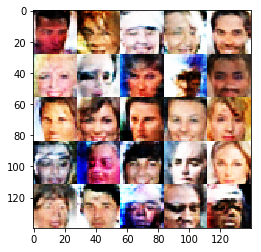

Epoch 2/5... Discriminator Loss: 0.9791... Generator Loss: 0.8798
Epoch 2/5... Discriminator Loss: 0.8693... Generator Loss: 0.7951
Epoch 2/5... Discriminator Loss: 0.8880... Generator Loss: 0.6937
Epoch 2/5... Discriminator Loss: 1.0574... Generator Loss: 0.6882
Epoch 2/5... Discriminator Loss: 1.1483... Generator Loss: 0.5025
Epoch 2/5... Discriminator Loss: 0.9939... Generator Loss: 0.6004
Epoch 2/5... Discriminator Loss: 0.8904... Generator Loss: 0.7985
Epoch 2/5... Discriminator Loss: 0.8692... Generator Loss: 0.7555
Epoch 2/5... Discriminator Loss: 0.7220... Generator Loss: 1.0970
Epoch 2/5... Discriminator Loss: 0.8006... Generator Loss: 0.9680


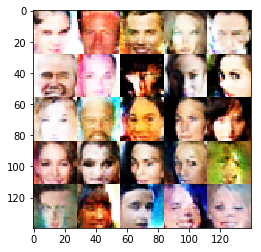

Epoch 2/5... Discriminator Loss: 0.5534... Generator Loss: 1.4708
Epoch 2/5... Discriminator Loss: 1.3879... Generator Loss: 0.3731
Epoch 2/5... Discriminator Loss: 1.6877... Generator Loss: 0.2875
Epoch 2/5... Discriminator Loss: 1.3838... Generator Loss: 0.3850
Epoch 2/5... Discriminator Loss: 0.7031... Generator Loss: 1.1704
Epoch 2/5... Discriminator Loss: 1.4137... Generator Loss: 0.4496
Epoch 2/5... Discriminator Loss: 1.1405... Generator Loss: 0.5080
Epoch 2/5... Discriminator Loss: 1.0107... Generator Loss: 0.6286
Epoch 2/5... Discriminator Loss: 1.0527... Generator Loss: 0.7629
Epoch 2/5... Discriminator Loss: 0.9693... Generator Loss: 0.6229


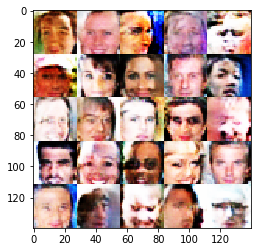

Epoch 2/5... Discriminator Loss: 1.2060... Generator Loss: 0.4631
Epoch 2/5... Discriminator Loss: 0.8525... Generator Loss: 0.8378
Epoch 2/5... Discriminator Loss: 1.3262... Generator Loss: 0.4428
Epoch 2/5... Discriminator Loss: 0.8485... Generator Loss: 0.8352
Epoch 3/5... Discriminator Loss: 0.8628... Generator Loss: 0.8061
Epoch 3/5... Discriminator Loss: 1.1359... Generator Loss: 0.5828
Epoch 3/5... Discriminator Loss: 0.9700... Generator Loss: 0.7016
Epoch 3/5... Discriminator Loss: 1.2488... Generator Loss: 0.4930
Epoch 3/5... Discriminator Loss: 0.8958... Generator Loss: 0.7804
Epoch 3/5... Discriminator Loss: 0.6497... Generator Loss: 1.5304


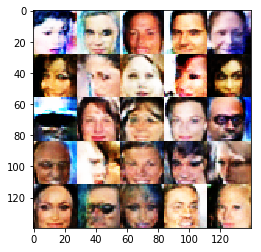

Epoch 3/5... Discriminator Loss: 0.9280... Generator Loss: 0.8885
Epoch 3/5... Discriminator Loss: 1.0825... Generator Loss: 0.5961
Epoch 3/5... Discriminator Loss: 0.9705... Generator Loss: 0.7823
Epoch 3/5... Discriminator Loss: 1.3197... Generator Loss: 0.4508
Epoch 3/5... Discriminator Loss: 1.4121... Generator Loss: 0.3434
Epoch 3/5... Discriminator Loss: 0.8425... Generator Loss: 1.1276
Epoch 3/5... Discriminator Loss: 1.1457... Generator Loss: 0.5342
Epoch 3/5... Discriminator Loss: 0.8052... Generator Loss: 1.2966
Epoch 3/5... Discriminator Loss: 1.0770... Generator Loss: 0.6366
Epoch 3/5... Discriminator Loss: 1.1853... Generator Loss: 0.5549


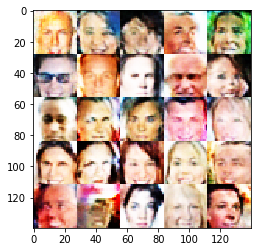

Epoch 3/5... Discriminator Loss: 1.1535... Generator Loss: 0.5064
Epoch 3/5... Discriminator Loss: 1.1022... Generator Loss: 0.6826
Epoch 3/5... Discriminator Loss: 0.7968... Generator Loss: 1.8522
Epoch 3/5... Discriminator Loss: 0.8107... Generator Loss: 1.0777
Epoch 3/5... Discriminator Loss: 0.5345... Generator Loss: 1.4286
Epoch 3/5... Discriminator Loss: 0.9038... Generator Loss: 0.9566
Epoch 3/5... Discriminator Loss: 0.7018... Generator Loss: 1.0289
Epoch 3/5... Discriminator Loss: 1.2785... Generator Loss: 0.5000
Epoch 3/5... Discriminator Loss: 1.0841... Generator Loss: 0.5708
Epoch 3/5... Discriminator Loss: 0.7979... Generator Loss: 0.9971


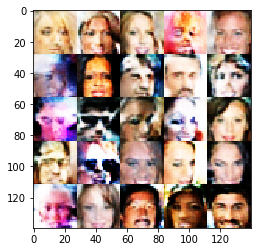

Epoch 3/5... Discriminator Loss: 0.9211... Generator Loss: 0.7705
Epoch 3/5... Discriminator Loss: 1.2154... Generator Loss: 0.4875
Epoch 3/5... Discriminator Loss: 0.6612... Generator Loss: 1.0074
Epoch 3/5... Discriminator Loss: 0.9953... Generator Loss: 0.8703
Epoch 3/5... Discriminator Loss: 0.7870... Generator Loss: 0.9434
Epoch 3/5... Discriminator Loss: 0.7538... Generator Loss: 1.2811
Epoch 3/5... Discriminator Loss: 1.3026... Generator Loss: 0.4751
Epoch 3/5... Discriminator Loss: 1.2589... Generator Loss: 0.4743
Epoch 3/5... Discriminator Loss: 0.7232... Generator Loss: 1.0157
Epoch 3/5... Discriminator Loss: 1.1097... Generator Loss: 0.5096


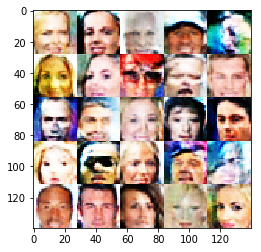

Epoch 3/5... Discriminator Loss: 1.2557... Generator Loss: 0.4566
Epoch 3/5... Discriminator Loss: 1.2170... Generator Loss: 0.4574
Epoch 3/5... Discriminator Loss: 0.8265... Generator Loss: 0.8983
Epoch 3/5... Discriminator Loss: 1.1348... Generator Loss: 1.0684
Epoch 3/5... Discriminator Loss: 1.0875... Generator Loss: 0.5262
Epoch 3/5... Discriminator Loss: 1.0143... Generator Loss: 1.3788
Epoch 3/5... Discriminator Loss: 0.8226... Generator Loss: 0.9323
Epoch 3/5... Discriminator Loss: 0.7602... Generator Loss: 1.0567
Epoch 3/5... Discriminator Loss: 0.9569... Generator Loss: 0.6817
Epoch 3/5... Discriminator Loss: 0.8732... Generator Loss: 0.8720


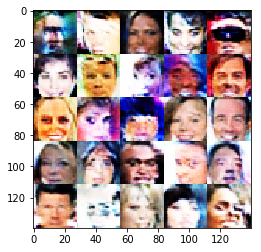

Epoch 3/5... Discriminator Loss: 1.3936... Generator Loss: 0.3471
Epoch 3/5... Discriminator Loss: 0.9674... Generator Loss: 0.6864
Epoch 3/5... Discriminator Loss: 0.8192... Generator Loss: 0.9620
Epoch 3/5... Discriminator Loss: 0.6252... Generator Loss: 1.2110
Epoch 3/5... Discriminator Loss: 1.2669... Generator Loss: 0.6140
Epoch 3/5... Discriminator Loss: 0.9516... Generator Loss: 0.8214
Epoch 3/5... Discriminator Loss: 0.9608... Generator Loss: 0.6913
Epoch 3/5... Discriminator Loss: 0.9205... Generator Loss: 0.7499
Epoch 3/5... Discriminator Loss: 0.7992... Generator Loss: 0.8935
Epoch 3/5... Discriminator Loss: 1.2997... Generator Loss: 0.4440


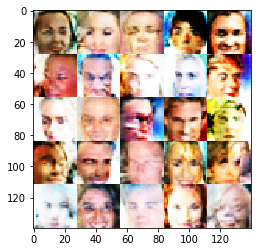

Epoch 3/5... Discriminator Loss: 0.9984... Generator Loss: 0.8013
Epoch 3/5... Discriminator Loss: 1.4551... Generator Loss: 0.3716
Epoch 3/5... Discriminator Loss: 1.0767... Generator Loss: 0.6406
Epoch 3/5... Discriminator Loss: 0.9070... Generator Loss: 0.7738
Epoch 3/5... Discriminator Loss: 0.7921... Generator Loss: 1.0129
Epoch 3/5... Discriminator Loss: 0.9038... Generator Loss: 0.7331
Epoch 3/5... Discriminator Loss: 0.7732... Generator Loss: 1.2696
Epoch 3/5... Discriminator Loss: 1.0615... Generator Loss: 0.6291
Epoch 3/5... Discriminator Loss: 1.0680... Generator Loss: 0.6584
Epoch 3/5... Discriminator Loss: 0.9772... Generator Loss: 0.6965


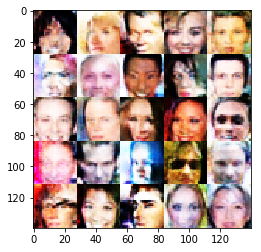

Epoch 3/5... Discriminator Loss: 0.9839... Generator Loss: 0.6515
Epoch 3/5... Discriminator Loss: 1.4765... Generator Loss: 0.3624
Epoch 3/5... Discriminator Loss: 0.9016... Generator Loss: 0.7024
Epoch 3/5... Discriminator Loss: 1.0584... Generator Loss: 0.6849
Epoch 3/5... Discriminator Loss: 0.8027... Generator Loss: 0.8023
Epoch 3/5... Discriminator Loss: 0.8786... Generator Loss: 0.7552
Epoch 3/5... Discriminator Loss: 0.8082... Generator Loss: 0.9104
Epoch 3/5... Discriminator Loss: 0.8372... Generator Loss: 1.6530
Epoch 3/5... Discriminator Loss: 0.8910... Generator Loss: 1.2625
Epoch 3/5... Discriminator Loss: 0.9903... Generator Loss: 0.7139


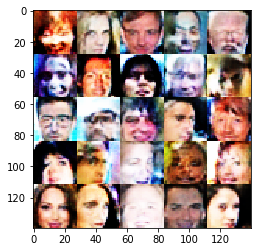

Epoch 3/5... Discriminator Loss: 0.6191... Generator Loss: 1.1197
Epoch 3/5... Discriminator Loss: 1.0573... Generator Loss: 0.6212
Epoch 3/5... Discriminator Loss: 0.8145... Generator Loss: 1.0074
Epoch 3/5... Discriminator Loss: 1.0612... Generator Loss: 0.5807
Epoch 3/5... Discriminator Loss: 1.3589... Generator Loss: 0.3632
Epoch 3/5... Discriminator Loss: 1.0767... Generator Loss: 0.5920
Epoch 3/5... Discriminator Loss: 1.0457... Generator Loss: 0.6636
Epoch 3/5... Discriminator Loss: 1.3832... Generator Loss: 0.3713
Epoch 3/5... Discriminator Loss: 0.7070... Generator Loss: 1.1461
Epoch 3/5... Discriminator Loss: 1.0997... Generator Loss: 0.5365


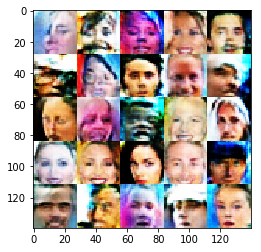

Epoch 3/5... Discriminator Loss: 0.7488... Generator Loss: 1.0974
Epoch 3/5... Discriminator Loss: 1.3068... Generator Loss: 0.5376
Epoch 3/5... Discriminator Loss: 1.0778... Generator Loss: 0.7584
Epoch 3/5... Discriminator Loss: 0.8944... Generator Loss: 0.7515
Epoch 3/5... Discriminator Loss: 0.8602... Generator Loss: 0.9576
Epoch 3/5... Discriminator Loss: 0.7594... Generator Loss: 0.8938
Epoch 3/5... Discriminator Loss: 0.8818... Generator Loss: 0.7671
Epoch 3/5... Discriminator Loss: 0.7997... Generator Loss: 1.0684
Epoch 3/5... Discriminator Loss: 1.4948... Generator Loss: 0.3195
Epoch 3/5... Discriminator Loss: 0.8355... Generator Loss: 0.9511


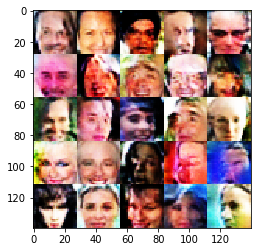

Epoch 3/5... Discriminator Loss: 1.1931... Generator Loss: 0.4699
Epoch 3/5... Discriminator Loss: 0.7776... Generator Loss: 1.8226
Epoch 3/5... Discriminator Loss: 0.9544... Generator Loss: 0.6749
Epoch 3/5... Discriminator Loss: 0.4814... Generator Loss: 1.3099
Epoch 3/5... Discriminator Loss: 1.3369... Generator Loss: 0.3830
Epoch 3/5... Discriminator Loss: 0.8925... Generator Loss: 0.8082
Epoch 3/5... Discriminator Loss: 0.9749... Generator Loss: 0.8072
Epoch 3/5... Discriminator Loss: 0.8643... Generator Loss: 0.7751
Epoch 3/5... Discriminator Loss: 1.1504... Generator Loss: 0.4894
Epoch 3/5... Discriminator Loss: 1.0203... Generator Loss: 0.6136


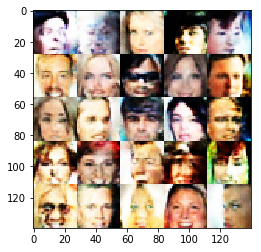

Epoch 3/5... Discriminator Loss: 0.9350... Generator Loss: 0.7629
Epoch 3/5... Discriminator Loss: 0.9780... Generator Loss: 0.7638
Epoch 3/5... Discriminator Loss: 1.0018... Generator Loss: 0.6807
Epoch 3/5... Discriminator Loss: 1.2775... Generator Loss: 0.4539
Epoch 3/5... Discriminator Loss: 1.3403... Generator Loss: 0.4402
Epoch 3/5... Discriminator Loss: 0.6627... Generator Loss: 1.3261
Epoch 3/5... Discriminator Loss: 0.9318... Generator Loss: 0.7228
Epoch 3/5... Discriminator Loss: 1.0963... Generator Loss: 0.5151
Epoch 3/5... Discriminator Loss: 0.8410... Generator Loss: 1.1647
Epoch 3/5... Discriminator Loss: 1.2373... Generator Loss: 0.4395


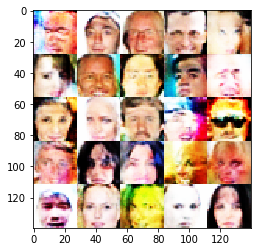

Epoch 3/5... Discriminator Loss: 1.1536... Generator Loss: 0.5034
Epoch 3/5... Discriminator Loss: 0.7264... Generator Loss: 0.9001
Epoch 3/5... Discriminator Loss: 0.9710... Generator Loss: 0.8984
Epoch 3/5... Discriminator Loss: 0.9367... Generator Loss: 0.6810
Epoch 3/5... Discriminator Loss: 0.8755... Generator Loss: 0.7945
Epoch 3/5... Discriminator Loss: 0.8089... Generator Loss: 0.9323
Epoch 3/5... Discriminator Loss: 1.1192... Generator Loss: 0.5313
Epoch 3/5... Discriminator Loss: 1.0929... Generator Loss: 1.0349
Epoch 3/5... Discriminator Loss: 0.8863... Generator Loss: 0.8543
Epoch 3/5... Discriminator Loss: 0.7842... Generator Loss: 0.9523


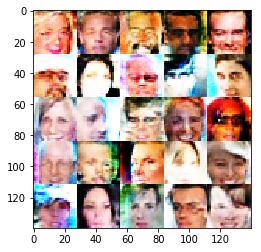

Epoch 3/5... Discriminator Loss: 1.0181... Generator Loss: 0.5708
Epoch 3/5... Discriminator Loss: 1.4130... Generator Loss: 0.3558
Epoch 3/5... Discriminator Loss: 1.4577... Generator Loss: 0.3602
Epoch 3/5... Discriminator Loss: 0.8633... Generator Loss: 1.0191
Epoch 3/5... Discriminator Loss: 0.9975... Generator Loss: 0.8431
Epoch 3/5... Discriminator Loss: 0.8055... Generator Loss: 0.8004
Epoch 3/5... Discriminator Loss: 1.4382... Generator Loss: 0.3585
Epoch 3/5... Discriminator Loss: 1.0365... Generator Loss: 0.7166
Epoch 3/5... Discriminator Loss: 0.6569... Generator Loss: 1.0115
Epoch 3/5... Discriminator Loss: 0.6914... Generator Loss: 1.1086


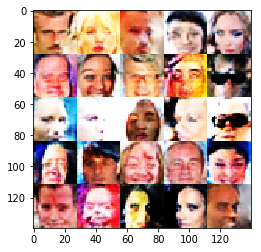

Epoch 3/5... Discriminator Loss: 1.1796... Generator Loss: 0.8768
Epoch 3/5... Discriminator Loss: 1.2832... Generator Loss: 0.4638
Epoch 3/5... Discriminator Loss: 1.1115... Generator Loss: 0.6084
Epoch 3/5... Discriminator Loss: 0.7910... Generator Loss: 0.8354
Epoch 3/5... Discriminator Loss: 0.9550... Generator Loss: 0.6142
Epoch 3/5... Discriminator Loss: 1.0412... Generator Loss: 0.6908
Epoch 3/5... Discriminator Loss: 0.7540... Generator Loss: 0.8835
Epoch 3/5... Discriminator Loss: 0.7810... Generator Loss: 0.9664
Epoch 3/5... Discriminator Loss: 1.2688... Generator Loss: 0.4200
Epoch 3/5... Discriminator Loss: 1.1567... Generator Loss: 0.4755


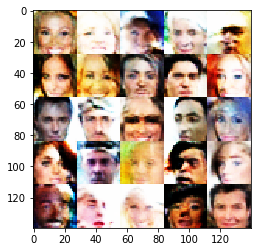

Epoch 3/5... Discriminator Loss: 0.7768... Generator Loss: 1.4103
Epoch 3/5... Discriminator Loss: 0.9826... Generator Loss: 0.5900
Epoch 3/5... Discriminator Loss: 0.9209... Generator Loss: 0.7413
Epoch 3/5... Discriminator Loss: 0.7677... Generator Loss: 0.8913
Epoch 3/5... Discriminator Loss: 0.8250... Generator Loss: 0.8529
Epoch 3/5... Discriminator Loss: 1.0188... Generator Loss: 0.6104
Epoch 3/5... Discriminator Loss: 0.7829... Generator Loss: 1.2545
Epoch 3/5... Discriminator Loss: 1.7478... Generator Loss: 0.2553
Epoch 3/5... Discriminator Loss: 0.6523... Generator Loss: 1.6920
Epoch 3/5... Discriminator Loss: 1.0228... Generator Loss: 0.6293


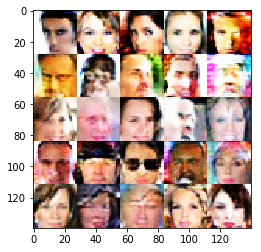

Epoch 3/5... Discriminator Loss: 0.4993... Generator Loss: 1.3184
Epoch 3/5... Discriminator Loss: 0.9649... Generator Loss: 0.6541
Epoch 3/5... Discriminator Loss: 0.9501... Generator Loss: 0.6178
Epoch 3/5... Discriminator Loss: 1.0886... Generator Loss: 0.7999
Epoch 3/5... Discriminator Loss: 0.9745... Generator Loss: 0.7411
Epoch 3/5... Discriminator Loss: 1.0231... Generator Loss: 0.6008
Epoch 3/5... Discriminator Loss: 1.1418... Generator Loss: 0.5207
Epoch 3/5... Discriminator Loss: 1.1968... Generator Loss: 0.4947
Epoch 3/5... Discriminator Loss: 1.0481... Generator Loss: 0.5667
Epoch 3/5... Discriminator Loss: 0.7118... Generator Loss: 1.0072


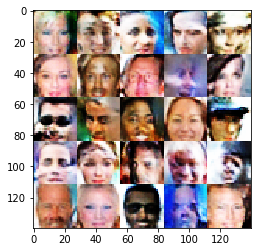

Epoch 3/5... Discriminator Loss: 0.5295... Generator Loss: 1.3785
Epoch 3/5... Discriminator Loss: 0.8290... Generator Loss: 1.0225
Epoch 3/5... Discriminator Loss: 0.6457... Generator Loss: 1.2858
Epoch 3/5... Discriminator Loss: 0.8003... Generator Loss: 1.2584
Epoch 3/5... Discriminator Loss: 0.9280... Generator Loss: 0.8061
Epoch 3/5... Discriminator Loss: 1.1464... Generator Loss: 0.5801
Epoch 3/5... Discriminator Loss: 0.9953... Generator Loss: 0.6896
Epoch 3/5... Discriminator Loss: 0.6731... Generator Loss: 1.1886
Epoch 3/5... Discriminator Loss: 1.1766... Generator Loss: 0.7176
Epoch 3/5... Discriminator Loss: 0.9511... Generator Loss: 0.7324


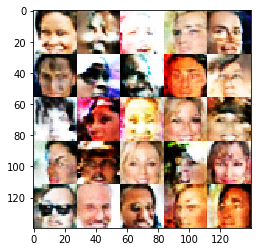

Epoch 3/5... Discriminator Loss: 0.8688... Generator Loss: 0.6573
Epoch 3/5... Discriminator Loss: 0.7414... Generator Loss: 1.0195
Epoch 3/5... Discriminator Loss: 1.0704... Generator Loss: 0.7817
Epoch 3/5... Discriminator Loss: 0.7938... Generator Loss: 0.8568
Epoch 3/5... Discriminator Loss: 1.0627... Generator Loss: 0.6159
Epoch 3/5... Discriminator Loss: 1.1007... Generator Loss: 0.5417
Epoch 3/5... Discriminator Loss: 1.3528... Generator Loss: 0.3833
Epoch 3/5... Discriminator Loss: 1.3195... Generator Loss: 0.3768
Epoch 3/5... Discriminator Loss: 1.4059... Generator Loss: 0.3827
Epoch 3/5... Discriminator Loss: 0.8990... Generator Loss: 0.7916


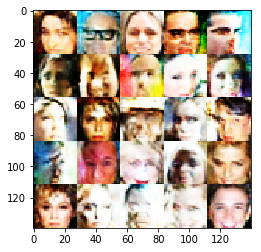

Epoch 3/5... Discriminator Loss: 0.9451... Generator Loss: 0.6706
Epoch 3/5... Discriminator Loss: 0.6748... Generator Loss: 1.1564
Epoch 3/5... Discriminator Loss: 1.0169... Generator Loss: 0.7017
Epoch 3/5... Discriminator Loss: 0.6542... Generator Loss: 1.2232
Epoch 3/5... Discriminator Loss: 1.0836... Generator Loss: 0.5358
Epoch 3/5... Discriminator Loss: 1.7621... Generator Loss: 0.2557
Epoch 3/5... Discriminator Loss: 0.7178... Generator Loss: 0.8796
Epoch 3/5... Discriminator Loss: 1.0677... Generator Loss: 0.5873
Epoch 3/5... Discriminator Loss: 1.4171... Generator Loss: 0.4090
Epoch 3/5... Discriminator Loss: 0.6496... Generator Loss: 1.0154


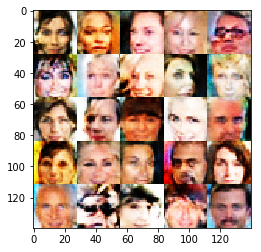

Epoch 3/5... Discriminator Loss: 1.0094... Generator Loss: 0.6153
Epoch 3/5... Discriminator Loss: 1.4137... Generator Loss: 0.4191
Epoch 3/5... Discriminator Loss: 1.6622... Generator Loss: 0.2737
Epoch 3/5... Discriminator Loss: 0.6484... Generator Loss: 1.5585
Epoch 3/5... Discriminator Loss: 0.8241... Generator Loss: 1.0889
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.3380
Epoch 3/5... Discriminator Loss: 1.2632... Generator Loss: 0.4652
Epoch 3/5... Discriminator Loss: 0.4301... Generator Loss: 1.7702
Epoch 3/5... Discriminator Loss: 0.9865... Generator Loss: 0.6006
Epoch 3/5... Discriminator Loss: 1.0633... Generator Loss: 0.5768


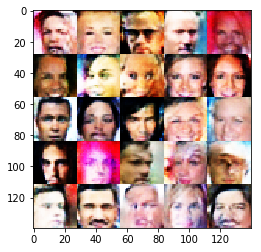

Epoch 3/5... Discriminator Loss: 1.4645... Generator Loss: 0.3342
Epoch 3/5... Discriminator Loss: 0.7814... Generator Loss: 0.9259
Epoch 3/5... Discriminator Loss: 0.7067... Generator Loss: 0.9209
Epoch 3/5... Discriminator Loss: 1.3339... Generator Loss: 0.3766
Epoch 3/5... Discriminator Loss: 0.9948... Generator Loss: 0.5759
Epoch 3/5... Discriminator Loss: 0.9069... Generator Loss: 1.0923
Epoch 3/5... Discriminator Loss: 0.4388... Generator Loss: 1.3711
Epoch 3/5... Discriminator Loss: 0.8545... Generator Loss: 0.7558
Epoch 3/5... Discriminator Loss: 1.2495... Generator Loss: 0.4228
Epoch 3/5... Discriminator Loss: 0.6597... Generator Loss: 1.0971


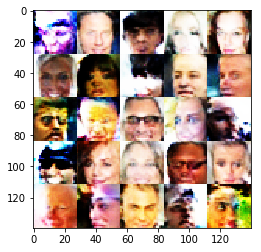

Epoch 3/5... Discriminator Loss: 0.6749... Generator Loss: 1.2935
Epoch 3/5... Discriminator Loss: 1.2285... Generator Loss: 0.4872
Epoch 3/5... Discriminator Loss: 1.5918... Generator Loss: 0.3038
Epoch 3/5... Discriminator Loss: 1.0358... Generator Loss: 0.5761
Epoch 3/5... Discriminator Loss: 1.4660... Generator Loss: 0.3649
Epoch 3/5... Discriminator Loss: 0.9420... Generator Loss: 0.7569
Epoch 3/5... Discriminator Loss: 1.5043... Generator Loss: 0.3473
Epoch 3/5... Discriminator Loss: 0.8905... Generator Loss: 0.9583
Epoch 3/5... Discriminator Loss: 0.8355... Generator Loss: 0.7799
Epoch 3/5... Discriminator Loss: 1.3506... Generator Loss: 0.3689


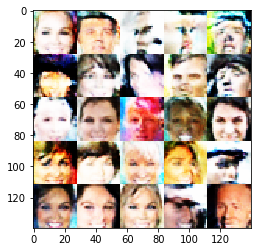

Epoch 3/5... Discriminator Loss: 1.0202... Generator Loss: 0.7241
Epoch 3/5... Discriminator Loss: 1.3516... Generator Loss: 0.3819
Epoch 3/5... Discriminator Loss: 0.7716... Generator Loss: 1.7005
Epoch 3/5... Discriminator Loss: 0.8245... Generator Loss: 0.7911
Epoch 3/5... Discriminator Loss: 1.0902... Generator Loss: 0.5624
Epoch 3/5... Discriminator Loss: 1.1975... Generator Loss: 0.8271
Epoch 3/5... Discriminator Loss: 0.9955... Generator Loss: 0.5895
Epoch 3/5... Discriminator Loss: 1.3891... Generator Loss: 0.3503
Epoch 3/5... Discriminator Loss: 0.7000... Generator Loss: 1.5595
Epoch 3/5... Discriminator Loss: 1.1314... Generator Loss: 0.5493


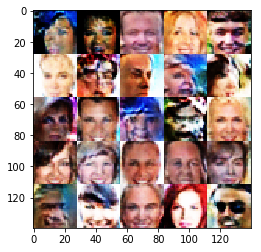

Epoch 3/5... Discriminator Loss: 1.4244... Generator Loss: 0.3514
Epoch 3/5... Discriminator Loss: 1.2359... Generator Loss: 0.5031
Epoch 3/5... Discriminator Loss: 1.0884... Generator Loss: 0.5448
Epoch 3/5... Discriminator Loss: 1.1975... Generator Loss: 0.4853
Epoch 3/5... Discriminator Loss: 0.7612... Generator Loss: 1.1669
Epoch 3/5... Discriminator Loss: 0.6343... Generator Loss: 1.6222
Epoch 3/5... Discriminator Loss: 1.0835... Generator Loss: 0.5125
Epoch 3/5... Discriminator Loss: 0.8938... Generator Loss: 0.6534
Epoch 3/5... Discriminator Loss: 0.7444... Generator Loss: 0.9412
Epoch 3/5... Discriminator Loss: 1.3414... Generator Loss: 0.4104


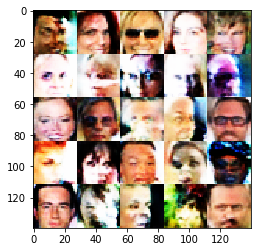

Epoch 3/5... Discriminator Loss: 1.2858... Generator Loss: 0.4470
Epoch 3/5... Discriminator Loss: 0.7716... Generator Loss: 0.8690
Epoch 3/5... Discriminator Loss: 1.3807... Generator Loss: 0.3851
Epoch 3/5... Discriminator Loss: 0.6644... Generator Loss: 1.3871
Epoch 3/5... Discriminator Loss: 1.2855... Generator Loss: 0.4485
Epoch 3/5... Discriminator Loss: 0.5426... Generator Loss: 1.5394
Epoch 3/5... Discriminator Loss: 1.3031... Generator Loss: 0.4548
Epoch 3/5... Discriminator Loss: 0.9725... Generator Loss: 0.7011
Epoch 3/5... Discriminator Loss: 0.8290... Generator Loss: 1.0827
Epoch 3/5... Discriminator Loss: 0.5665... Generator Loss: 1.3700


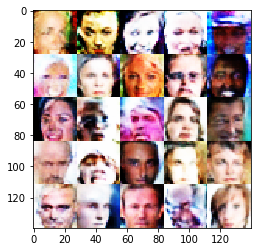

Epoch 3/5... Discriminator Loss: 0.8869... Generator Loss: 0.7773
Epoch 3/5... Discriminator Loss: 1.4507... Generator Loss: 0.3664
Epoch 3/5... Discriminator Loss: 1.3035... Generator Loss: 0.4188
Epoch 3/5... Discriminator Loss: 1.0327... Generator Loss: 0.5977
Epoch 3/5... Discriminator Loss: 1.2842... Generator Loss: 0.4609
Epoch 3/5... Discriminator Loss: 1.0389... Generator Loss: 0.5835
Epoch 3/5... Discriminator Loss: 1.5380... Generator Loss: 0.3014
Epoch 3/5... Discriminator Loss: 1.2333... Generator Loss: 0.4597
Epoch 3/5... Discriminator Loss: 1.1563... Generator Loss: 0.4747
Epoch 3/5... Discriminator Loss: 1.2084... Generator Loss: 0.4443


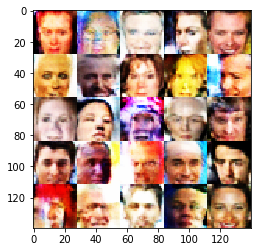

Epoch 3/5... Discriminator Loss: 0.8224... Generator Loss: 0.8571
Epoch 3/5... Discriminator Loss: 0.8330... Generator Loss: 1.6047
Epoch 3/5... Discriminator Loss: 1.4141... Generator Loss: 0.3939
Epoch 3/5... Discriminator Loss: 1.6198... Generator Loss: 0.2820
Epoch 3/5... Discriminator Loss: 0.8771... Generator Loss: 0.8803
Epoch 3/5... Discriminator Loss: 0.8741... Generator Loss: 1.3332
Epoch 3/5... Discriminator Loss: 1.0814... Generator Loss: 0.5977
Epoch 3/5... Discriminator Loss: 0.9133... Generator Loss: 0.7397
Epoch 3/5... Discriminator Loss: 0.6437... Generator Loss: 1.0707
Epoch 3/5... Discriminator Loss: 1.2437... Generator Loss: 0.4536


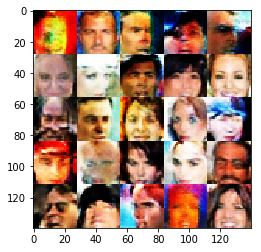

Epoch 3/5... Discriminator Loss: 0.8726... Generator Loss: 0.9116
Epoch 3/5... Discriminator Loss: 1.1627... Generator Loss: 0.4922
Epoch 3/5... Discriminator Loss: 0.8177... Generator Loss: 0.9459
Epoch 3/5... Discriminator Loss: 1.3305... Generator Loss: 0.4067
Epoch 3/5... Discriminator Loss: 1.3560... Generator Loss: 0.4097
Epoch 3/5... Discriminator Loss: 1.0621... Generator Loss: 0.5808
Epoch 3/5... Discriminator Loss: 0.8502... Generator Loss: 1.4411
Epoch 3/5... Discriminator Loss: 0.5978... Generator Loss: 0.9472
Epoch 3/5... Discriminator Loss: 0.9443... Generator Loss: 0.9434
Epoch 3/5... Discriminator Loss: 1.2489... Generator Loss: 0.4448


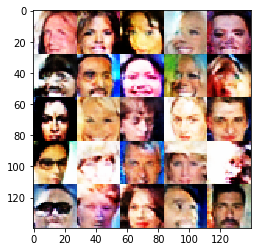

Epoch 3/5... Discriminator Loss: 0.8632... Generator Loss: 0.7981
Epoch 3/5... Discriminator Loss: 0.9159... Generator Loss: 0.7296
Epoch 3/5... Discriminator Loss: 0.5902... Generator Loss: 1.4796
Epoch 3/5... Discriminator Loss: 1.6584... Generator Loss: 0.2985
Epoch 3/5... Discriminator Loss: 1.0491... Generator Loss: 0.7236
Epoch 3/5... Discriminator Loss: 0.6567... Generator Loss: 1.5661
Epoch 3/5... Discriminator Loss: 0.6872... Generator Loss: 0.9585
Epoch 3/5... Discriminator Loss: 1.5583... Generator Loss: 0.2968
Epoch 3/5... Discriminator Loss: 0.6641... Generator Loss: 1.2308
Epoch 3/5... Discriminator Loss: 1.0240... Generator Loss: 0.6055


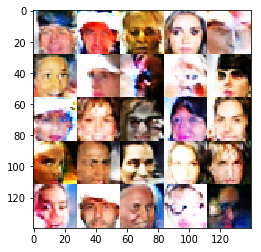

Epoch 3/5... Discriminator Loss: 0.7041... Generator Loss: 0.9415
Epoch 3/5... Discriminator Loss: 0.8023... Generator Loss: 0.8979
Epoch 3/5... Discriminator Loss: 0.7670... Generator Loss: 0.8757
Epoch 3/5... Discriminator Loss: 0.9417... Generator Loss: 0.6138
Epoch 3/5... Discriminator Loss: 1.1718... Generator Loss: 0.5455
Epoch 3/5... Discriminator Loss: 0.6729... Generator Loss: 0.9988
Epoch 3/5... Discriminator Loss: 0.9008... Generator Loss: 0.7037
Epoch 3/5... Discriminator Loss: 0.7144... Generator Loss: 1.4797
Epoch 3/5... Discriminator Loss: 0.5788... Generator Loss: 1.0784
Epoch 3/5... Discriminator Loss: 0.9393... Generator Loss: 0.6568


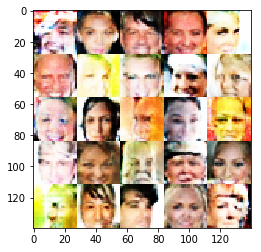

Epoch 3/5... Discriminator Loss: 1.1767... Generator Loss: 0.5051
Epoch 3/5... Discriminator Loss: 0.5617... Generator Loss: 2.4142
Epoch 3/5... Discriminator Loss: 0.9577... Generator Loss: 0.6439
Epoch 3/5... Discriminator Loss: 0.7461... Generator Loss: 1.2228
Epoch 3/5... Discriminator Loss: 0.6323... Generator Loss: 0.9889
Epoch 3/5... Discriminator Loss: 1.1318... Generator Loss: 0.5248
Epoch 3/5... Discriminator Loss: 1.6815... Generator Loss: 0.2543
Epoch 3/5... Discriminator Loss: 0.8145... Generator Loss: 0.9363
Epoch 3/5... Discriminator Loss: 1.0002... Generator Loss: 0.8325
Epoch 3/5... Discriminator Loss: 0.7791... Generator Loss: 0.9820


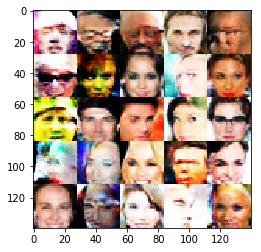

Epoch 4/5... Discriminator Loss: 0.9502... Generator Loss: 0.7986
Epoch 4/5... Discriminator Loss: 1.0011... Generator Loss: 0.6695
Epoch 4/5... Discriminator Loss: 0.8915... Generator Loss: 1.4365
Epoch 4/5... Discriminator Loss: 0.8901... Generator Loss: 0.7303
Epoch 4/5... Discriminator Loss: 1.1660... Generator Loss: 0.5084
Epoch 4/5... Discriminator Loss: 1.6339... Generator Loss: 0.2586
Epoch 4/5... Discriminator Loss: 1.4535... Generator Loss: 0.3693
Epoch 4/5... Discriminator Loss: 1.0581... Generator Loss: 0.8355
Epoch 4/5... Discriminator Loss: 1.0134... Generator Loss: 0.6544
Epoch 4/5... Discriminator Loss: 1.0128... Generator Loss: 0.5767


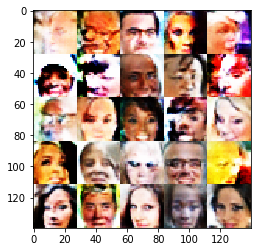

Epoch 4/5... Discriminator Loss: 1.1600... Generator Loss: 0.4741
Epoch 4/5... Discriminator Loss: 0.6790... Generator Loss: 1.1619
Epoch 4/5... Discriminator Loss: 0.9477... Generator Loss: 0.6670
Epoch 4/5... Discriminator Loss: 1.5136... Generator Loss: 0.3115
Epoch 4/5... Discriminator Loss: 1.0511... Generator Loss: 0.6176
Epoch 4/5... Discriminator Loss: 1.0890... Generator Loss: 0.5226
Epoch 4/5... Discriminator Loss: 1.0681... Generator Loss: 0.5675
Epoch 4/5... Discriminator Loss: 1.1491... Generator Loss: 0.5522
Epoch 4/5... Discriminator Loss: 0.7254... Generator Loss: 0.8727
Epoch 4/5... Discriminator Loss: 1.1791... Generator Loss: 0.4575


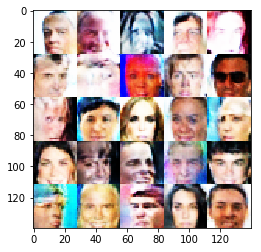

Epoch 4/5... Discriminator Loss: 1.0714... Generator Loss: 0.6755
Epoch 4/5... Discriminator Loss: 1.4028... Generator Loss: 0.3831
Epoch 4/5... Discriminator Loss: 1.2303... Generator Loss: 0.4488
Epoch 4/5... Discriminator Loss: 0.9665... Generator Loss: 0.7586
Epoch 4/5... Discriminator Loss: 1.0145... Generator Loss: 0.7826
Epoch 4/5... Discriminator Loss: 1.0839... Generator Loss: 0.8809
Epoch 4/5... Discriminator Loss: 1.5914... Generator Loss: 0.2789
Epoch 4/5... Discriminator Loss: 0.8311... Generator Loss: 1.0121
Epoch 4/5... Discriminator Loss: 1.0825... Generator Loss: 0.5250
Epoch 4/5... Discriminator Loss: 1.1266... Generator Loss: 0.5485


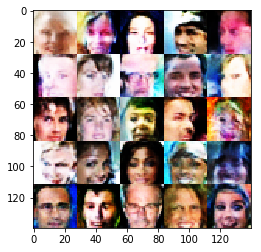

Epoch 4/5... Discriminator Loss: 1.4230... Generator Loss: 0.3797
Epoch 4/5... Discriminator Loss: 0.6768... Generator Loss: 1.1270
Epoch 4/5... Discriminator Loss: 1.1857... Generator Loss: 0.5275
Epoch 4/5... Discriminator Loss: 0.6845... Generator Loss: 0.9397
Epoch 4/5... Discriminator Loss: 1.0346... Generator Loss: 0.5601
Epoch 4/5... Discriminator Loss: 1.0655... Generator Loss: 0.6043
Epoch 4/5... Discriminator Loss: 0.9891... Generator Loss: 0.6521
Epoch 4/5... Discriminator Loss: 0.8439... Generator Loss: 0.7967
Epoch 4/5... Discriminator Loss: 0.5849... Generator Loss: 1.1304
Epoch 4/5... Discriminator Loss: 1.5949... Generator Loss: 0.3670


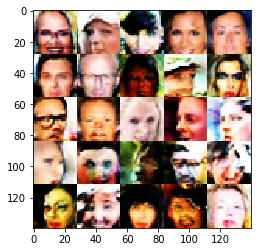

Epoch 4/5... Discriminator Loss: 1.5880... Generator Loss: 0.2919
Epoch 4/5... Discriminator Loss: 0.7597... Generator Loss: 1.1461
Epoch 4/5... Discriminator Loss: 0.6591... Generator Loss: 1.3426
Epoch 4/5... Discriminator Loss: 1.5764... Generator Loss: 0.3251
Epoch 4/5... Discriminator Loss: 1.0701... Generator Loss: 0.5842
Epoch 4/5... Discriminator Loss: 0.7898... Generator Loss: 1.1305
Epoch 4/5... Discriminator Loss: 1.1019... Generator Loss: 0.5784
Epoch 4/5... Discriminator Loss: 0.7246... Generator Loss: 1.0702
Epoch 4/5... Discriminator Loss: 1.4594... Generator Loss: 0.3526
Epoch 4/5... Discriminator Loss: 0.6626... Generator Loss: 0.9754


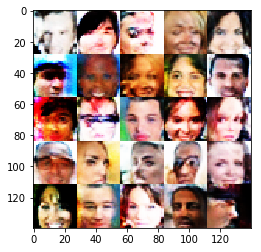

Epoch 4/5... Discriminator Loss: 1.5961... Generator Loss: 0.2987
Epoch 4/5... Discriminator Loss: 1.0823... Generator Loss: 0.5375
Epoch 4/5... Discriminator Loss: 0.9186... Generator Loss: 0.7726
Epoch 4/5... Discriminator Loss: 0.6653... Generator Loss: 0.9873
Epoch 4/5... Discriminator Loss: 0.6673... Generator Loss: 2.1526
Epoch 4/5... Discriminator Loss: 0.7173... Generator Loss: 1.2161
Epoch 4/5... Discriminator Loss: 1.3413... Generator Loss: 0.3884
Epoch 4/5... Discriminator Loss: 0.9713... Generator Loss: 0.8798
Epoch 4/5... Discriminator Loss: 0.7716... Generator Loss: 0.8647
Epoch 4/5... Discriminator Loss: 0.7329... Generator Loss: 0.9632


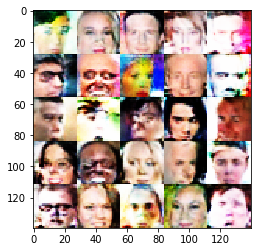

Epoch 4/5... Discriminator Loss: 0.7308... Generator Loss: 0.9456
Epoch 4/5... Discriminator Loss: 0.9203... Generator Loss: 0.6519
Epoch 4/5... Discriminator Loss: 1.1689... Generator Loss: 0.5081
Epoch 4/5... Discriminator Loss: 0.7365... Generator Loss: 1.3335
Epoch 4/5... Discriminator Loss: 1.1736... Generator Loss: 0.4585
Epoch 4/5... Discriminator Loss: 1.2876... Generator Loss: 0.4445
Epoch 4/5... Discriminator Loss: 1.3036... Generator Loss: 0.4124
Epoch 4/5... Discriminator Loss: 0.6616... Generator Loss: 1.0179
Epoch 4/5... Discriminator Loss: 0.7447... Generator Loss: 1.4635
Epoch 4/5... Discriminator Loss: 0.7508... Generator Loss: 1.4429


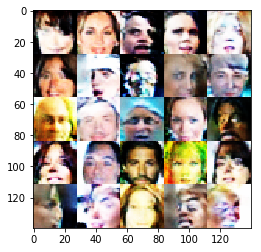

Epoch 4/5... Discriminator Loss: 0.4748... Generator Loss: 1.3576
Epoch 4/5... Discriminator Loss: 0.3163... Generator Loss: 2.0253
Epoch 4/5... Discriminator Loss: 1.0295... Generator Loss: 0.5907
Epoch 4/5... Discriminator Loss: 0.8319... Generator Loss: 0.7979
Epoch 4/5... Discriminator Loss: 1.3998... Generator Loss: 0.3323
Epoch 4/5... Discriminator Loss: 1.3751... Generator Loss: 0.3753
Epoch 4/5... Discriminator Loss: 0.6013... Generator Loss: 1.1340
Epoch 4/5... Discriminator Loss: 1.7281... Generator Loss: 0.2437
Epoch 4/5... Discriminator Loss: 0.7321... Generator Loss: 0.9219
Epoch 4/5... Discriminator Loss: 0.8324... Generator Loss: 0.7444


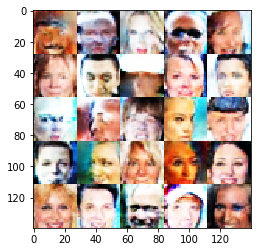

Epoch 4/5... Discriminator Loss: 1.0806... Generator Loss: 0.5661
Epoch 4/5... Discriminator Loss: 0.9420... Generator Loss: 0.7567
Epoch 4/5... Discriminator Loss: 1.0109... Generator Loss: 0.6063
Epoch 4/5... Discriminator Loss: 0.6570... Generator Loss: 0.9911
Epoch 4/5... Discriminator Loss: 0.9853... Generator Loss: 0.7711
Epoch 4/5... Discriminator Loss: 1.4209... Generator Loss: 0.3517
Epoch 4/5... Discriminator Loss: 1.1261... Generator Loss: 0.4856
Epoch 4/5... Discriminator Loss: 0.7317... Generator Loss: 1.0851
Epoch 4/5... Discriminator Loss: 1.3898... Generator Loss: 0.3533
Epoch 4/5... Discriminator Loss: 1.0287... Generator Loss: 0.6482


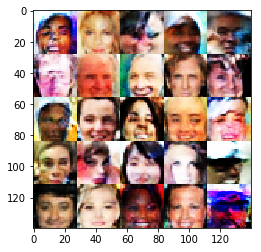

Epoch 4/5... Discriminator Loss: 0.8177... Generator Loss: 1.0280
Epoch 4/5... Discriminator Loss: 0.5739... Generator Loss: 1.3879
Epoch 4/5... Discriminator Loss: 0.8900... Generator Loss: 0.7309
Epoch 4/5... Discriminator Loss: 1.6088... Generator Loss: 0.2793
Epoch 4/5... Discriminator Loss: 0.6919... Generator Loss: 1.3396
Epoch 4/5... Discriminator Loss: 1.0433... Generator Loss: 0.6013
Epoch 4/5... Discriminator Loss: 0.7472... Generator Loss: 1.0039
Epoch 4/5... Discriminator Loss: 1.0191... Generator Loss: 0.5781
Epoch 4/5... Discriminator Loss: 0.6523... Generator Loss: 1.4880
Epoch 4/5... Discriminator Loss: 1.5944... Generator Loss: 0.2897


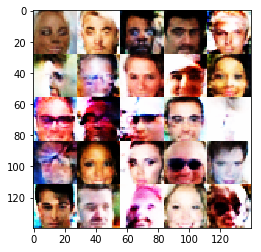

Epoch 4/5... Discriminator Loss: 0.8703... Generator Loss: 0.6684
Epoch 4/5... Discriminator Loss: 0.5806... Generator Loss: 1.3265
Epoch 4/5... Discriminator Loss: 0.6857... Generator Loss: 1.1055
Epoch 4/5... Discriminator Loss: 0.9555... Generator Loss: 0.6956
Epoch 4/5... Discriminator Loss: 0.8196... Generator Loss: 0.8167
Epoch 4/5... Discriminator Loss: 2.0270... Generator Loss: 0.1954
Epoch 4/5... Discriminator Loss: 0.4618... Generator Loss: 1.8857
Epoch 4/5... Discriminator Loss: 0.7212... Generator Loss: 0.9308
Epoch 4/5... Discriminator Loss: 0.6971... Generator Loss: 1.1432
Epoch 4/5... Discriminator Loss: 1.1807... Generator Loss: 0.4898


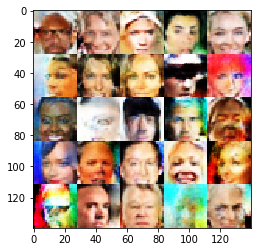

Epoch 4/5... Discriminator Loss: 0.8870... Generator Loss: 1.0428
Epoch 4/5... Discriminator Loss: 0.9404... Generator Loss: 0.7455
Epoch 4/5... Discriminator Loss: 0.8703... Generator Loss: 0.6797
Epoch 4/5... Discriminator Loss: 0.8847... Generator Loss: 1.3317
Epoch 4/5... Discriminator Loss: 0.4720... Generator Loss: 1.8473
Epoch 4/5... Discriminator Loss: 0.9981... Generator Loss: 0.6181
Epoch 4/5... Discriminator Loss: 0.9195... Generator Loss: 1.1019
Epoch 4/5... Discriminator Loss: 0.7073... Generator Loss: 1.0947
Epoch 4/5... Discriminator Loss: 1.1720... Generator Loss: 0.5235
Epoch 4/5... Discriminator Loss: 0.6735... Generator Loss: 0.9721


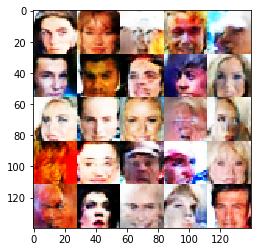

Epoch 4/5... Discriminator Loss: 0.4923... Generator Loss: 1.8835
Epoch 4/5... Discriminator Loss: 1.0778... Generator Loss: 0.5478
Epoch 4/5... Discriminator Loss: 1.1305... Generator Loss: 0.5010
Epoch 4/5... Discriminator Loss: 1.0323... Generator Loss: 0.5714
Epoch 4/5... Discriminator Loss: 0.8486... Generator Loss: 0.8205
Epoch 4/5... Discriminator Loss: 1.8346... Generator Loss: 0.2351
Epoch 4/5... Discriminator Loss: 0.8758... Generator Loss: 0.7026
Epoch 4/5... Discriminator Loss: 0.6601... Generator Loss: 1.1108
Epoch 4/5... Discriminator Loss: 0.5672... Generator Loss: 1.2532
Epoch 4/5... Discriminator Loss: 0.9885... Generator Loss: 0.7246


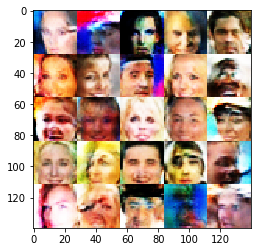

Epoch 4/5... Discriminator Loss: 0.9573... Generator Loss: 1.6972
Epoch 4/5... Discriminator Loss: 0.6134... Generator Loss: 1.2804
Epoch 4/5... Discriminator Loss: 0.6914... Generator Loss: 1.5846
Epoch 4/5... Discriminator Loss: 0.5960... Generator Loss: 1.2996
Epoch 4/5... Discriminator Loss: 0.6589... Generator Loss: 1.2249
Epoch 4/5... Discriminator Loss: 0.8695... Generator Loss: 0.7330
Epoch 4/5... Discriminator Loss: 1.4906... Generator Loss: 0.3328
Epoch 4/5... Discriminator Loss: 1.2463... Generator Loss: 0.4504
Epoch 4/5... Discriminator Loss: 1.0038... Generator Loss: 0.6870
Epoch 4/5... Discriminator Loss: 0.7140... Generator Loss: 1.0074


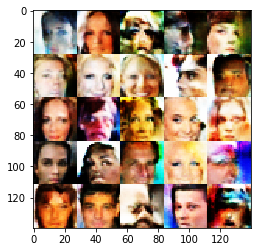

Epoch 4/5... Discriminator Loss: 1.0746... Generator Loss: 0.5174
Epoch 4/5... Discriminator Loss: 1.0024... Generator Loss: 0.6197
Epoch 4/5... Discriminator Loss: 0.6904... Generator Loss: 1.0390
Epoch 4/5... Discriminator Loss: 0.8502... Generator Loss: 0.7228
Epoch 4/5... Discriminator Loss: 0.7216... Generator Loss: 1.0790
Epoch 4/5... Discriminator Loss: 1.2922... Generator Loss: 0.4466
Epoch 4/5... Discriminator Loss: 1.9992... Generator Loss: 0.1822
Epoch 4/5... Discriminator Loss: 1.4865... Generator Loss: 0.3325
Epoch 4/5... Discriminator Loss: 0.9628... Generator Loss: 0.6802
Epoch 4/5... Discriminator Loss: 1.3294... Generator Loss: 0.4114


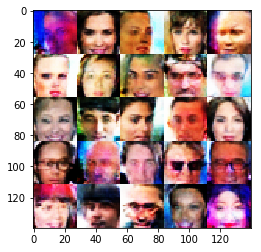

Epoch 4/5... Discriminator Loss: 1.0039... Generator Loss: 0.5917
Epoch 4/5... Discriminator Loss: 0.7741... Generator Loss: 0.8470
Epoch 4/5... Discriminator Loss: 0.7192... Generator Loss: 0.9712
Epoch 4/5... Discriminator Loss: 0.6490... Generator Loss: 1.5129
Epoch 4/5... Discriminator Loss: 0.6095... Generator Loss: 1.1138
Epoch 4/5... Discriminator Loss: 0.7893... Generator Loss: 0.8616
Epoch 4/5... Discriminator Loss: 0.8746... Generator Loss: 1.2850
Epoch 4/5... Discriminator Loss: 0.7926... Generator Loss: 0.7791
Epoch 4/5... Discriminator Loss: 1.0932... Generator Loss: 0.6745
Epoch 4/5... Discriminator Loss: 1.0261... Generator Loss: 0.6535


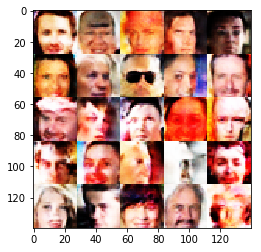

Epoch 4/5... Discriminator Loss: 1.1212... Generator Loss: 0.6729
Epoch 4/5... Discriminator Loss: 0.9627... Generator Loss: 0.7009
Epoch 4/5... Discriminator Loss: 0.7399... Generator Loss: 1.5237
Epoch 4/5... Discriminator Loss: 1.0656... Generator Loss: 0.7134
Epoch 4/5... Discriminator Loss: 1.3265... Generator Loss: 0.4252
Epoch 4/5... Discriminator Loss: 0.7022... Generator Loss: 0.9519
Epoch 4/5... Discriminator Loss: 1.1195... Generator Loss: 0.5187
Epoch 4/5... Discriminator Loss: 1.0805... Generator Loss: 0.6023
Epoch 4/5... Discriminator Loss: 1.0521... Generator Loss: 0.6241
Epoch 4/5... Discriminator Loss: 1.2930... Generator Loss: 0.3984


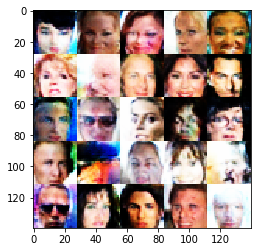

Epoch 4/5... Discriminator Loss: 1.2416... Generator Loss: 0.4542
Epoch 4/5... Discriminator Loss: 0.8209... Generator Loss: 0.9197
Epoch 4/5... Discriminator Loss: 0.9305... Generator Loss: 0.6630
Epoch 4/5... Discriminator Loss: 0.7906... Generator Loss: 0.7945
Epoch 4/5... Discriminator Loss: 1.4183... Generator Loss: 0.3576
Epoch 4/5... Discriminator Loss: 0.6390... Generator Loss: 1.1434
Epoch 4/5... Discriminator Loss: 0.6213... Generator Loss: 1.2443
Epoch 4/5... Discriminator Loss: 0.7148... Generator Loss: 1.5528
Epoch 4/5... Discriminator Loss: 1.3771... Generator Loss: 0.3642
Epoch 4/5... Discriminator Loss: 1.2398... Generator Loss: 0.4491


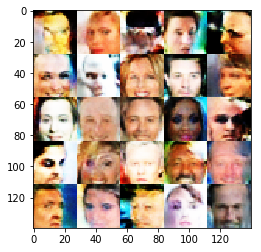

Epoch 4/5... Discriminator Loss: 0.7883... Generator Loss: 1.1256
Epoch 4/5... Discriminator Loss: 0.9811... Generator Loss: 1.1443
Epoch 4/5... Discriminator Loss: 1.4148... Generator Loss: 0.3561
Epoch 4/5... Discriminator Loss: 1.0443... Generator Loss: 0.6937
Epoch 4/5... Discriminator Loss: 0.7889... Generator Loss: 1.4861
Epoch 4/5... Discriminator Loss: 1.1862... Generator Loss: 0.4782
Epoch 4/5... Discriminator Loss: 1.0269... Generator Loss: 0.5844
Epoch 4/5... Discriminator Loss: 1.0617... Generator Loss: 0.6724
Epoch 4/5... Discriminator Loss: 0.5938... Generator Loss: 1.1191
Epoch 4/5... Discriminator Loss: 1.1483... Generator Loss: 0.5290


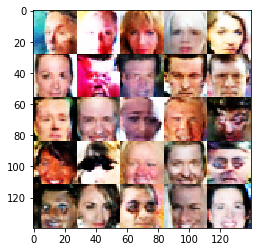

Epoch 4/5... Discriminator Loss: 0.9222... Generator Loss: 0.8877
Epoch 4/5... Discriminator Loss: 0.5986... Generator Loss: 1.2679
Epoch 4/5... Discriminator Loss: 0.6853... Generator Loss: 1.0217
Epoch 4/5... Discriminator Loss: 0.8823... Generator Loss: 1.1380
Epoch 4/5... Discriminator Loss: 0.5757... Generator Loss: 1.9412
Epoch 4/5... Discriminator Loss: 0.8381... Generator Loss: 0.8442
Epoch 4/5... Discriminator Loss: 0.8493... Generator Loss: 0.7942
Epoch 4/5... Discriminator Loss: 0.8968... Generator Loss: 0.7418
Epoch 4/5... Discriminator Loss: 0.4553... Generator Loss: 1.4136
Epoch 4/5... Discriminator Loss: 0.9630... Generator Loss: 0.6434


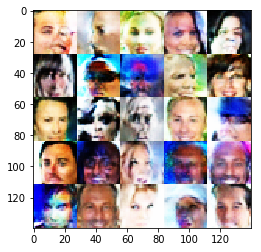

Epoch 4/5... Discriminator Loss: 1.1279... Generator Loss: 0.5089
Epoch 4/5... Discriminator Loss: 1.2324... Generator Loss: 0.4754
Epoch 4/5... Discriminator Loss: 1.3707... Generator Loss: 0.4310
Epoch 4/5... Discriminator Loss: 0.6867... Generator Loss: 1.0059
Epoch 4/5... Discriminator Loss: 0.7880... Generator Loss: 1.5995
Epoch 4/5... Discriminator Loss: 0.9246... Generator Loss: 0.6803
Epoch 4/5... Discriminator Loss: 0.9187... Generator Loss: 0.6632
Epoch 4/5... Discriminator Loss: 0.7963... Generator Loss: 0.9355
Epoch 4/5... Discriminator Loss: 0.6996... Generator Loss: 0.9918
Epoch 4/5... Discriminator Loss: 1.2291... Generator Loss: 0.4936


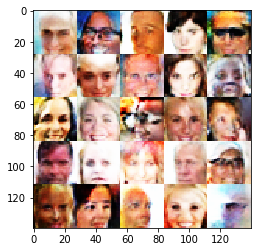

Epoch 4/5... Discriminator Loss: 0.9265... Generator Loss: 0.7054
Epoch 4/5... Discriminator Loss: 1.3725... Generator Loss: 0.4113
Epoch 4/5... Discriminator Loss: 1.1146... Generator Loss: 0.6560
Epoch 4/5... Discriminator Loss: 1.2884... Generator Loss: 0.4180
Epoch 4/5... Discriminator Loss: 1.0333... Generator Loss: 0.6400
Epoch 4/5... Discriminator Loss: 1.7609... Generator Loss: 0.2228
Epoch 4/5... Discriminator Loss: 1.1888... Generator Loss: 0.4607
Epoch 4/5... Discriminator Loss: 1.3521... Generator Loss: 0.3716
Epoch 4/5... Discriminator Loss: 1.5668... Generator Loss: 0.3149
Epoch 4/5... Discriminator Loss: 0.7737... Generator Loss: 0.8605


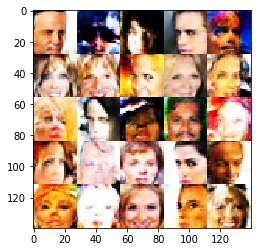

Epoch 4/5... Discriminator Loss: 0.6883... Generator Loss: 1.0352
Epoch 4/5... Discriminator Loss: 0.7714... Generator Loss: 0.9251
Epoch 4/5... Discriminator Loss: 0.8267... Generator Loss: 0.7401
Epoch 4/5... Discriminator Loss: 0.8190... Generator Loss: 0.7145
Epoch 4/5... Discriminator Loss: 0.7765... Generator Loss: 0.8822
Epoch 4/5... Discriminator Loss: 0.9982... Generator Loss: 0.6299
Epoch 4/5... Discriminator Loss: 1.2710... Generator Loss: 0.4504
Epoch 4/5... Discriminator Loss: 1.0342... Generator Loss: 0.5860
Epoch 4/5... Discriminator Loss: 0.9974... Generator Loss: 0.6725
Epoch 4/5... Discriminator Loss: 0.7742... Generator Loss: 0.8737


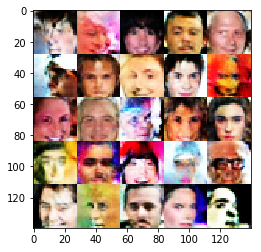

Epoch 4/5... Discriminator Loss: 0.6930... Generator Loss: 1.1518
Epoch 4/5... Discriminator Loss: 1.4962... Generator Loss: 0.3180
Epoch 4/5... Discriminator Loss: 0.8774... Generator Loss: 0.7855
Epoch 4/5... Discriminator Loss: 0.9744... Generator Loss: 0.6391
Epoch 4/5... Discriminator Loss: 0.3633... Generator Loss: 1.4868
Epoch 4/5... Discriminator Loss: 0.5718... Generator Loss: 1.0668
Epoch 4/5... Discriminator Loss: 0.7074... Generator Loss: 0.9302
Epoch 4/5... Discriminator Loss: 0.7002... Generator Loss: 1.0301
Epoch 4/5... Discriminator Loss: 1.0656... Generator Loss: 0.5387
Epoch 4/5... Discriminator Loss: 1.2555... Generator Loss: 0.4648


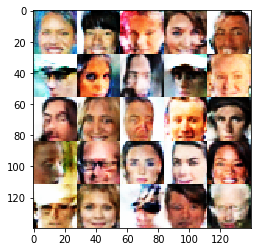

Epoch 4/5... Discriminator Loss: 1.3084... Generator Loss: 0.4144
Epoch 4/5... Discriminator Loss: 0.5446... Generator Loss: 1.3062
Epoch 4/5... Discriminator Loss: 0.9419... Generator Loss: 0.7175
Epoch 4/5... Discriminator Loss: 1.3859... Generator Loss: 0.3600
Epoch 4/5... Discriminator Loss: 1.1186... Generator Loss: 0.5457
Epoch 4/5... Discriminator Loss: 0.9424... Generator Loss: 0.6657
Epoch 4/5... Discriminator Loss: 1.2520... Generator Loss: 0.4455
Epoch 4/5... Discriminator Loss: 1.1356... Generator Loss: 0.6073
Epoch 4/5... Discriminator Loss: 0.7101... Generator Loss: 1.1675
Epoch 4/5... Discriminator Loss: 1.0091... Generator Loss: 0.5680


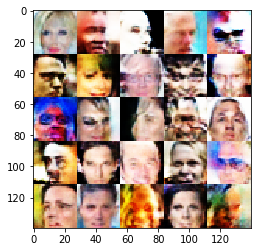

Epoch 4/5... Discriminator Loss: 0.9287... Generator Loss: 0.7193
Epoch 4/5... Discriminator Loss: 0.3911... Generator Loss: 1.7979
Epoch 4/5... Discriminator Loss: 0.9150... Generator Loss: 0.6709
Epoch 4/5... Discriminator Loss: 0.6414... Generator Loss: 1.4970
Epoch 4/5... Discriminator Loss: 0.6332... Generator Loss: 1.1568
Epoch 4/5... Discriminator Loss: 1.0750... Generator Loss: 0.5927
Epoch 4/5... Discriminator Loss: 1.4411... Generator Loss: 0.3427
Epoch 4/5... Discriminator Loss: 1.2162... Generator Loss: 0.4723
Epoch 4/5... Discriminator Loss: 0.9937... Generator Loss: 0.6254
Epoch 4/5... Discriminator Loss: 1.5030... Generator Loss: 0.3480


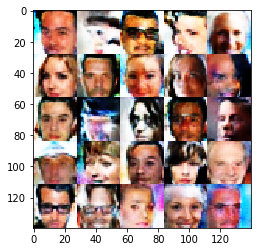

Epoch 4/5... Discriminator Loss: 1.0281... Generator Loss: 0.6202
Epoch 4/5... Discriminator Loss: 1.1979... Generator Loss: 0.4383
Epoch 4/5... Discriminator Loss: 0.7935... Generator Loss: 0.8457
Epoch 4/5... Discriminator Loss: 0.6090... Generator Loss: 1.0538
Epoch 4/5... Discriminator Loss: 0.5404... Generator Loss: 1.4786
Epoch 4/5... Discriminator Loss: 1.1490... Generator Loss: 0.4791
Epoch 4/5... Discriminator Loss: 0.7102... Generator Loss: 1.1256
Epoch 4/5... Discriminator Loss: 0.6287... Generator Loss: 1.0580
Epoch 4/5... Discriminator Loss: 1.0871... Generator Loss: 0.6449
Epoch 4/5... Discriminator Loss: 0.9786... Generator Loss: 0.7269


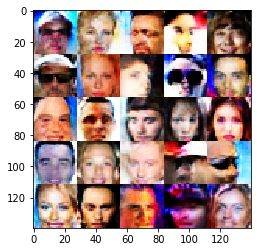

Epoch 4/5... Discriminator Loss: 0.9733... Generator Loss: 0.6139
Epoch 4/5... Discriminator Loss: 0.7879... Generator Loss: 0.7397
Epoch 4/5... Discriminator Loss: 1.7188... Generator Loss: 0.2712
Epoch 4/5... Discriminator Loss: 0.7879... Generator Loss: 1.0615
Epoch 4/5... Discriminator Loss: 0.9577... Generator Loss: 0.6864
Epoch 4/5... Discriminator Loss: 0.9116... Generator Loss: 0.7258
Epoch 4/5... Discriminator Loss: 0.7455... Generator Loss: 1.0946
Epoch 4/5... Discriminator Loss: 0.6578... Generator Loss: 1.2106
Epoch 4/5... Discriminator Loss: 0.7599... Generator Loss: 0.7921
Epoch 4/5... Discriminator Loss: 0.6541... Generator Loss: 1.0255


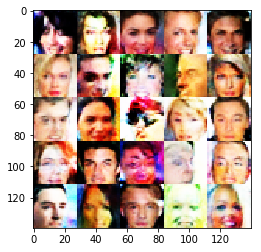

Epoch 4/5... Discriminator Loss: 1.3653... Generator Loss: 0.3745
Epoch 4/5... Discriminator Loss: 1.2344... Generator Loss: 0.5637
Epoch 4/5... Discriminator Loss: 1.2283... Generator Loss: 0.6331
Epoch 4/5... Discriminator Loss: 0.6048... Generator Loss: 1.3808
Epoch 4/5... Discriminator Loss: 0.9142... Generator Loss: 0.7014
Epoch 4/5... Discriminator Loss: 1.2559... Generator Loss: 0.4449
Epoch 4/5... Discriminator Loss: 1.0223... Generator Loss: 0.5653
Epoch 4/5... Discriminator Loss: 0.5652... Generator Loss: 1.2664
Epoch 4/5... Discriminator Loss: 1.1816... Generator Loss: 0.6321
Epoch 4/5... Discriminator Loss: 0.7326... Generator Loss: 1.1675


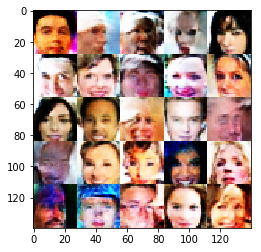

Epoch 4/5... Discriminator Loss: 0.6838... Generator Loss: 1.0263
Epoch 4/5... Discriminator Loss: 1.2422... Generator Loss: 0.4119
Epoch 4/5... Discriminator Loss: 0.6701... Generator Loss: 1.0041
Epoch 4/5... Discriminator Loss: 0.8387... Generator Loss: 0.7993
Epoch 4/5... Discriminator Loss: 0.8290... Generator Loss: 0.8313
Epoch 4/5... Discriminator Loss: 0.9100... Generator Loss: 0.7958
Epoch 4/5... Discriminator Loss: 1.0159... Generator Loss: 0.6269
Epoch 4/5... Discriminator Loss: 0.9617... Generator Loss: 0.8390
Epoch 4/5... Discriminator Loss: 0.9812... Generator Loss: 0.6263
Epoch 4/5... Discriminator Loss: 0.6165... Generator Loss: 1.1157


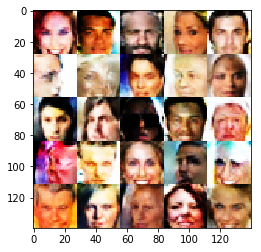

Epoch 4/5... Discriminator Loss: 1.2651... Generator Loss: 0.4436
Epoch 4/5... Discriminator Loss: 0.5928... Generator Loss: 1.0366
Epoch 4/5... Discriminator Loss: 1.3613... Generator Loss: 0.3686
Epoch 4/5... Discriminator Loss: 0.6933... Generator Loss: 0.9264
Epoch 4/5... Discriminator Loss: 1.5912... Generator Loss: 0.3050
Epoch 4/5... Discriminator Loss: 1.2565... Generator Loss: 0.4125
Epoch 4/5... Discriminator Loss: 0.8141... Generator Loss: 0.8390
Epoch 4/5... Discriminator Loss: 0.6028... Generator Loss: 1.3877
Epoch 4/5... Discriminator Loss: 1.4364... Generator Loss: 0.3489
Epoch 4/5... Discriminator Loss: 0.7667... Generator Loss: 0.8677


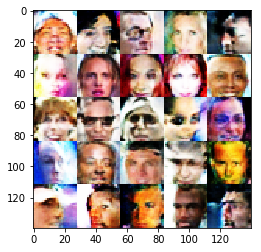

Epoch 4/5... Discriminator Loss: 1.0171... Generator Loss: 0.5553
Epoch 4/5... Discriminator Loss: 1.1351... Generator Loss: 0.5273
Epoch 4/5... Discriminator Loss: 0.5509... Generator Loss: 1.2320
Epoch 4/5... Discriminator Loss: 0.8280... Generator Loss: 0.8061
Epoch 4/5... Discriminator Loss: 1.0199... Generator Loss: 0.5918
Epoch 4/5... Discriminator Loss: 1.9667... Generator Loss: 0.2208
Epoch 4/5... Discriminator Loss: 1.3610... Generator Loss: 0.3760
Epoch 5/5... Discriminator Loss: 0.5919... Generator Loss: 1.0818
Epoch 5/5... Discriminator Loss: 1.2504... Generator Loss: 0.4610
Epoch 5/5... Discriminator Loss: 0.5862... Generator Loss: 1.1518


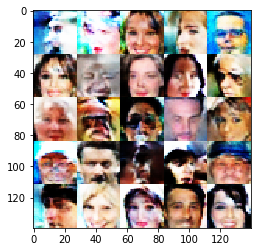

Epoch 5/5... Discriminator Loss: 2.5743... Generator Loss: 0.1109
Epoch 5/5... Discriminator Loss: 0.6977... Generator Loss: 1.1477
Epoch 5/5... Discriminator Loss: 0.2863... Generator Loss: 1.9086
Epoch 5/5... Discriminator Loss: 1.1204... Generator Loss: 0.5510
Epoch 5/5... Discriminator Loss: 0.8895... Generator Loss: 0.7424
Epoch 5/5... Discriminator Loss: 0.7513... Generator Loss: 0.7896
Epoch 5/5... Discriminator Loss: 1.0198... Generator Loss: 0.9776
Epoch 5/5... Discriminator Loss: 0.9897... Generator Loss: 0.6204
Epoch 5/5... Discriminator Loss: 1.5345... Generator Loss: 0.3787
Epoch 5/5... Discriminator Loss: 0.9703... Generator Loss: 0.6542


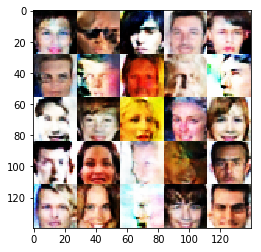

Epoch 5/5... Discriminator Loss: 0.4468... Generator Loss: 1.4441
Epoch 5/5... Discriminator Loss: 1.1257... Generator Loss: 0.5111
Epoch 5/5... Discriminator Loss: 3.0424... Generator Loss: 0.0650
Epoch 5/5... Discriminator Loss: 2.2186... Generator Loss: 0.1391
Epoch 5/5... Discriminator Loss: 0.7538... Generator Loss: 1.2681
Epoch 5/5... Discriminator Loss: 1.1316... Generator Loss: 0.5240
Epoch 5/5... Discriminator Loss: 0.5842... Generator Loss: 1.0894
Epoch 5/5... Discriminator Loss: 0.5239... Generator Loss: 1.5000
Epoch 5/5... Discriminator Loss: 0.5441... Generator Loss: 1.7262
Epoch 5/5... Discriminator Loss: 0.5098... Generator Loss: 1.3586


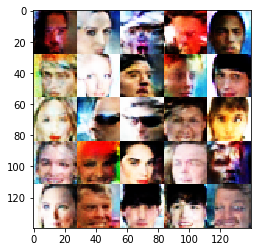

Epoch 5/5... Discriminator Loss: 0.9392... Generator Loss: 0.6688
Epoch 5/5... Discriminator Loss: 0.4432... Generator Loss: 1.7672
Epoch 5/5... Discriminator Loss: 0.3417... Generator Loss: 2.1903
Epoch 5/5... Discriminator Loss: 0.8322... Generator Loss: 0.7578
Epoch 5/5... Discriminator Loss: 0.7129... Generator Loss: 1.1512
Epoch 5/5... Discriminator Loss: 1.0701... Generator Loss: 0.5347
Epoch 5/5... Discriminator Loss: 0.8023... Generator Loss: 0.8821
Epoch 5/5... Discriminator Loss: 0.7339... Generator Loss: 0.8849
Epoch 5/5... Discriminator Loss: 1.5500... Generator Loss: 0.3348
Epoch 5/5... Discriminator Loss: 0.9046... Generator Loss: 0.8512


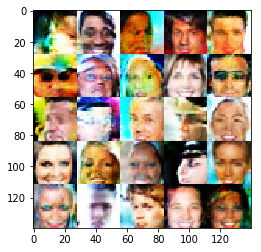

Epoch 5/5... Discriminator Loss: 0.6218... Generator Loss: 1.1711
Epoch 5/5... Discriminator Loss: 0.7826... Generator Loss: 0.8318
Epoch 5/5... Discriminator Loss: 1.4357... Generator Loss: 0.3421
Epoch 5/5... Discriminator Loss: 0.8828... Generator Loss: 0.7220
Epoch 5/5... Discriminator Loss: 0.7173... Generator Loss: 0.8895
Epoch 5/5... Discriminator Loss: 1.1465... Generator Loss: 0.5422
Epoch 5/5... Discriminator Loss: 0.7801... Generator Loss: 1.1451
Epoch 5/5... Discriminator Loss: 1.3820... Generator Loss: 0.4543
Epoch 5/5... Discriminator Loss: 1.1447... Generator Loss: 0.4886
Epoch 5/5... Discriminator Loss: 0.9597... Generator Loss: 0.6245


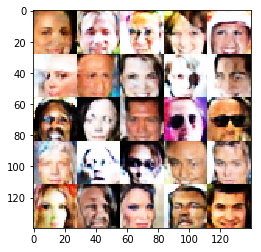

Epoch 5/5... Discriminator Loss: 1.4062... Generator Loss: 0.3806
Epoch 5/5... Discriminator Loss: 0.9387... Generator Loss: 0.6367
Epoch 5/5... Discriminator Loss: 0.9550... Generator Loss: 0.7638
Epoch 5/5... Discriminator Loss: 1.1769... Generator Loss: 0.5055
Epoch 5/5... Discriminator Loss: 0.8105... Generator Loss: 0.7913
Epoch 5/5... Discriminator Loss: 1.1024... Generator Loss: 0.5492
Epoch 5/5... Discriminator Loss: 0.9732... Generator Loss: 0.6168
Epoch 5/5... Discriminator Loss: 0.5121... Generator Loss: 2.2012
Epoch 5/5... Discriminator Loss: 0.4882... Generator Loss: 1.5276
Epoch 5/5... Discriminator Loss: 1.0427... Generator Loss: 0.6333


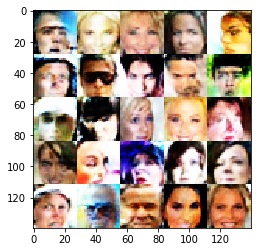

Epoch 5/5... Discriminator Loss: 1.0881... Generator Loss: 0.5140
Epoch 5/5... Discriminator Loss: 1.1585... Generator Loss: 0.5332
Epoch 5/5... Discriminator Loss: 1.1079... Generator Loss: 0.4924
Epoch 5/5... Discriminator Loss: 0.9844... Generator Loss: 0.7070
Epoch 5/5... Discriminator Loss: 1.9616... Generator Loss: 0.1874
Epoch 5/5... Discriminator Loss: 1.0530... Generator Loss: 0.5872
Epoch 5/5... Discriminator Loss: 0.6191... Generator Loss: 1.2049
Epoch 5/5... Discriminator Loss: 0.6199... Generator Loss: 1.1095
Epoch 5/5... Discriminator Loss: 1.0935... Generator Loss: 0.5462
Epoch 5/5... Discriminator Loss: 0.5233... Generator Loss: 1.2108


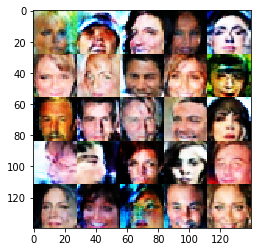

Epoch 5/5... Discriminator Loss: 0.7165... Generator Loss: 0.9445
Epoch 5/5... Discriminator Loss: 1.0457... Generator Loss: 0.5524
Epoch 5/5... Discriminator Loss: 0.9372... Generator Loss: 0.6958
Epoch 5/5... Discriminator Loss: 0.9492... Generator Loss: 0.7056
Epoch 5/5... Discriminator Loss: 1.2921... Generator Loss: 0.4052
Epoch 5/5... Discriminator Loss: 1.3166... Generator Loss: 0.4141
Epoch 5/5... Discriminator Loss: 0.7729... Generator Loss: 0.8036
Epoch 5/5... Discriminator Loss: 0.9535... Generator Loss: 0.6749
Epoch 5/5... Discriminator Loss: 0.6433... Generator Loss: 1.3325
Epoch 5/5... Discriminator Loss: 0.8946... Generator Loss: 0.6716


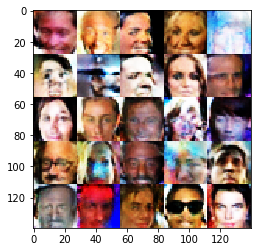

Epoch 5/5... Discriminator Loss: 0.7716... Generator Loss: 1.3555
Epoch 5/5... Discriminator Loss: 1.4448... Generator Loss: 0.3730
Epoch 5/5... Discriminator Loss: 0.9492... Generator Loss: 0.6782
Epoch 5/5... Discriminator Loss: 0.5782... Generator Loss: 1.4754
Epoch 5/5... Discriminator Loss: 2.1161... Generator Loss: 0.1648
Epoch 5/5... Discriminator Loss: 0.5051... Generator Loss: 1.3122
Epoch 5/5... Discriminator Loss: 1.4479... Generator Loss: 0.3433
Epoch 5/5... Discriminator Loss: 0.9829... Generator Loss: 0.6045
Epoch 5/5... Discriminator Loss: 1.0697... Generator Loss: 0.5817
Epoch 5/5... Discriminator Loss: 0.5929... Generator Loss: 1.0785


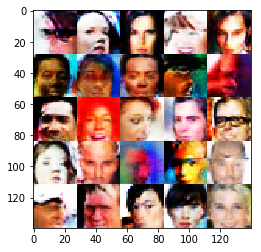

Epoch 5/5... Discriminator Loss: 1.2367... Generator Loss: 0.4548
Epoch 5/5... Discriminator Loss: 0.6530... Generator Loss: 1.1320
Epoch 5/5... Discriminator Loss: 1.1225... Generator Loss: 0.5361
Epoch 5/5... Discriminator Loss: 0.7820... Generator Loss: 0.8501
Epoch 5/5... Discriminator Loss: 0.7451... Generator Loss: 1.0429
Epoch 5/5... Discriminator Loss: 0.7252... Generator Loss: 0.9302
Epoch 5/5... Discriminator Loss: 0.6139... Generator Loss: 1.0874
Epoch 5/5... Discriminator Loss: 0.9119... Generator Loss: 0.9559
Epoch 5/5... Discriminator Loss: 0.5941... Generator Loss: 1.0825
Epoch 5/5... Discriminator Loss: 1.1099... Generator Loss: 0.5245


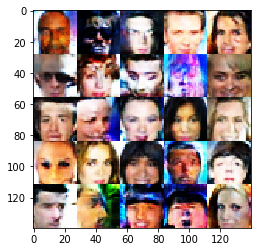

Epoch 5/5... Discriminator Loss: 0.5622... Generator Loss: 1.7859
Epoch 5/5... Discriminator Loss: 0.8574... Generator Loss: 0.8404
Epoch 5/5... Discriminator Loss: 0.9914... Generator Loss: 0.6505
Epoch 5/5... Discriminator Loss: 1.0175... Generator Loss: 0.5847
Epoch 5/5... Discriminator Loss: 0.6669... Generator Loss: 1.4299
Epoch 5/5... Discriminator Loss: 0.7426... Generator Loss: 0.9231
Epoch 5/5... Discriminator Loss: 0.9582... Generator Loss: 0.6222
Epoch 5/5... Discriminator Loss: 1.2926... Generator Loss: 0.4545
Epoch 5/5... Discriminator Loss: 1.5068... Generator Loss: 0.3400
Epoch 5/5... Discriminator Loss: 1.4956... Generator Loss: 0.3454


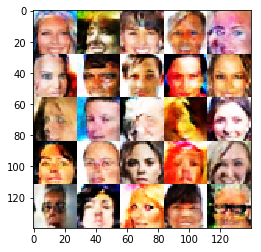

Epoch 5/5... Discriminator Loss: 0.7840... Generator Loss: 1.2796
Epoch 5/5... Discriminator Loss: 1.0414... Generator Loss: 0.5569
Epoch 5/5... Discriminator Loss: 1.0524... Generator Loss: 0.5556
Epoch 5/5... Discriminator Loss: 1.1486... Generator Loss: 0.5307
Epoch 5/5... Discriminator Loss: 1.0734... Generator Loss: 0.5474
Epoch 5/5... Discriminator Loss: 0.7824... Generator Loss: 0.8449
Epoch 5/5... Discriminator Loss: 1.2717... Generator Loss: 0.4386
Epoch 5/5... Discriminator Loss: 0.7568... Generator Loss: 1.1303
Epoch 5/5... Discriminator Loss: 0.5495... Generator Loss: 1.3350
Epoch 5/5... Discriminator Loss: 1.0551... Generator Loss: 0.9654


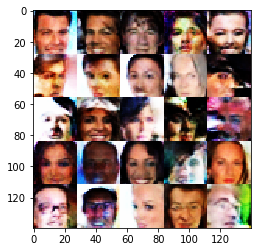

Epoch 5/5... Discriminator Loss: 1.9029... Generator Loss: 0.2068
Epoch 5/5... Discriminator Loss: 0.5244... Generator Loss: 1.7380
Epoch 5/5... Discriminator Loss: 0.7222... Generator Loss: 0.9339
Epoch 5/5... Discriminator Loss: 0.7660... Generator Loss: 0.8381
Epoch 5/5... Discriminator Loss: 0.4657... Generator Loss: 1.3652
Epoch 5/5... Discriminator Loss: 0.8483... Generator Loss: 0.7541
Epoch 5/5... Discriminator Loss: 1.3947... Generator Loss: 0.3598
Epoch 5/5... Discriminator Loss: 0.4955... Generator Loss: 1.2811
Epoch 5/5... Discriminator Loss: 1.1781... Generator Loss: 0.4930
Epoch 5/5... Discriminator Loss: 1.1924... Generator Loss: 0.4603


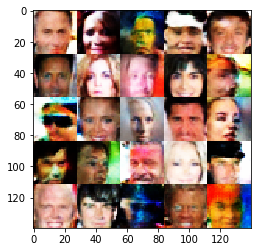

Epoch 5/5... Discriminator Loss: 0.3641... Generator Loss: 1.9227
Epoch 5/5... Discriminator Loss: 0.5631... Generator Loss: 1.1827
Epoch 5/5... Discriminator Loss: 0.8084... Generator Loss: 0.7836
Epoch 5/5... Discriminator Loss: 0.9917... Generator Loss: 0.6515
Epoch 5/5... Discriminator Loss: 0.8334... Generator Loss: 1.3840
Epoch 5/5... Discriminator Loss: 0.9744... Generator Loss: 0.6991
Epoch 5/5... Discriminator Loss: 1.2467... Generator Loss: 0.4478
Epoch 5/5... Discriminator Loss: 0.5918... Generator Loss: 1.2887
Epoch 5/5... Discriminator Loss: 1.1263... Generator Loss: 0.5491
Epoch 5/5... Discriminator Loss: 1.4475... Generator Loss: 0.3370


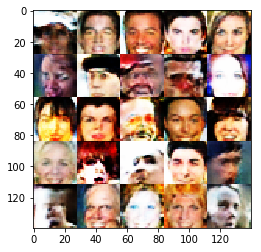

Epoch 5/5... Discriminator Loss: 1.3920... Generator Loss: 0.3730
Epoch 5/5... Discriminator Loss: 0.9431... Generator Loss: 0.6637
Epoch 5/5... Discriminator Loss: 0.6866... Generator Loss: 0.9387
Epoch 5/5... Discriminator Loss: 0.5147... Generator Loss: 2.1172
Epoch 5/5... Discriminator Loss: 1.0616... Generator Loss: 0.5976
Epoch 5/5... Discriminator Loss: 0.7481... Generator Loss: 0.8735
Epoch 5/5... Discriminator Loss: 1.1984... Generator Loss: 0.4758
Epoch 5/5... Discriminator Loss: 0.7337... Generator Loss: 0.8592
Epoch 5/5... Discriminator Loss: 0.5205... Generator Loss: 2.4504
Epoch 5/5... Discriminator Loss: 0.9557... Generator Loss: 0.6877


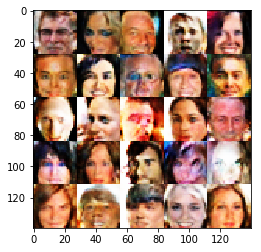

Epoch 5/5... Discriminator Loss: 0.7128... Generator Loss: 1.0340
Epoch 5/5... Discriminator Loss: 0.6469... Generator Loss: 1.0028
Epoch 5/5... Discriminator Loss: 1.5705... Generator Loss: 0.2850
Epoch 5/5... Discriminator Loss: 1.4858... Generator Loss: 0.3251
Epoch 5/5... Discriminator Loss: 1.9705... Generator Loss: 0.1966
Epoch 5/5... Discriminator Loss: 0.9670... Generator Loss: 0.6502
Epoch 5/5... Discriminator Loss: 0.5761... Generator Loss: 1.2008
Epoch 5/5... Discriminator Loss: 0.5568... Generator Loss: 1.0603
Epoch 5/5... Discriminator Loss: 1.1069... Generator Loss: 0.5108
Epoch 5/5... Discriminator Loss: 1.0985... Generator Loss: 0.5343


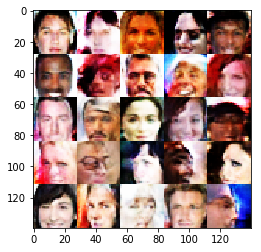

Epoch 5/5... Discriminator Loss: 1.2296... Generator Loss: 0.4873
Epoch 5/5... Discriminator Loss: 0.6099... Generator Loss: 1.3144
Epoch 5/5... Discriminator Loss: 1.0641... Generator Loss: 0.5549
Epoch 5/5... Discriminator Loss: 0.3833... Generator Loss: 1.8858
Epoch 5/5... Discriminator Loss: 1.1802... Generator Loss: 0.4828
Epoch 5/5... Discriminator Loss: 1.5095... Generator Loss: 0.3244
Epoch 5/5... Discriminator Loss: 0.5724... Generator Loss: 1.4024
Epoch 5/5... Discriminator Loss: 0.7894... Generator Loss: 0.8354
Epoch 5/5... Discriminator Loss: 1.3235... Generator Loss: 0.3886
Epoch 5/5... Discriminator Loss: 0.4615... Generator Loss: 1.3334


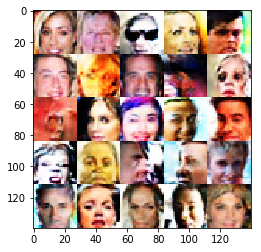

Epoch 5/5... Discriminator Loss: 0.9161... Generator Loss: 0.7818
Epoch 5/5... Discriminator Loss: 0.8333... Generator Loss: 0.7291
Epoch 5/5... Discriminator Loss: 0.5046... Generator Loss: 1.6463
Epoch 5/5... Discriminator Loss: 0.6842... Generator Loss: 0.9128
Epoch 5/5... Discriminator Loss: 0.8246... Generator Loss: 0.8506
Epoch 5/5... Discriminator Loss: 0.7335... Generator Loss: 0.9091
Epoch 5/5... Discriminator Loss: 1.1407... Generator Loss: 0.4826
Epoch 5/5... Discriminator Loss: 0.9375... Generator Loss: 0.6451
Epoch 5/5... Discriminator Loss: 0.7943... Generator Loss: 0.8177
Epoch 5/5... Discriminator Loss: 0.6882... Generator Loss: 1.0404


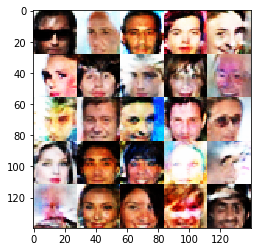

Epoch 5/5... Discriminator Loss: 0.5147... Generator Loss: 1.3009
Epoch 5/5... Discriminator Loss: 1.2800... Generator Loss: 0.4507
Epoch 5/5... Discriminator Loss: 1.1959... Generator Loss: 0.4733
Epoch 5/5... Discriminator Loss: 0.9998... Generator Loss: 0.6062
Epoch 5/5... Discriminator Loss: 0.8364... Generator Loss: 0.9312
Epoch 5/5... Discriminator Loss: 1.5981... Generator Loss: 0.2997
Epoch 5/5... Discriminator Loss: 1.1039... Generator Loss: 0.5992
Epoch 5/5... Discriminator Loss: 0.6694... Generator Loss: 0.8717
Epoch 5/5... Discriminator Loss: 0.9300... Generator Loss: 0.7700
Epoch 5/5... Discriminator Loss: 0.7458... Generator Loss: 1.2147


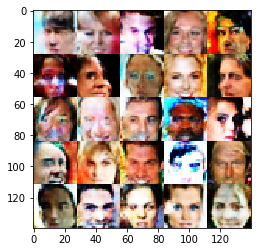

Epoch 5/5... Discriminator Loss: 0.9978... Generator Loss: 0.5891
Epoch 5/5... Discriminator Loss: 0.5882... Generator Loss: 1.1861
Epoch 5/5... Discriminator Loss: 1.7184... Generator Loss: 0.2394
Epoch 5/5... Discriminator Loss: 0.8784... Generator Loss: 0.7260
Epoch 5/5... Discriminator Loss: 0.6483... Generator Loss: 1.1397
Epoch 5/5... Discriminator Loss: 0.8951... Generator Loss: 2.3005
Epoch 5/5... Discriminator Loss: 1.0477... Generator Loss: 0.5581
Epoch 5/5... Discriminator Loss: 0.8224... Generator Loss: 0.7624
Epoch 5/5... Discriminator Loss: 0.9003... Generator Loss: 0.6827
Epoch 5/5... Discriminator Loss: 0.8412... Generator Loss: 0.7331


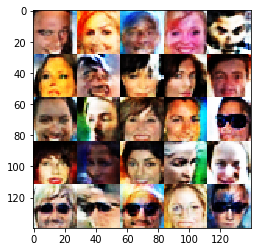

Epoch 5/5... Discriminator Loss: 1.5383... Generator Loss: 0.3399
Epoch 5/5... Discriminator Loss: 0.7973... Generator Loss: 0.8155
Epoch 5/5... Discriminator Loss: 0.5658... Generator Loss: 1.1249
Epoch 5/5... Discriminator Loss: 1.1502... Generator Loss: 0.4846
Epoch 5/5... Discriminator Loss: 0.9699... Generator Loss: 0.7173
Epoch 5/5... Discriminator Loss: 0.9374... Generator Loss: 0.7157
Epoch 5/5... Discriminator Loss: 0.7579... Generator Loss: 0.8494
Epoch 5/5... Discriminator Loss: 0.7223... Generator Loss: 1.3722
Epoch 5/5... Discriminator Loss: 0.6468... Generator Loss: 1.0495
Epoch 5/5... Discriminator Loss: 1.1376... Generator Loss: 0.5365


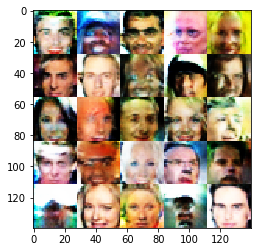

Epoch 5/5... Discriminator Loss: 0.4295... Generator Loss: 1.7738
Epoch 5/5... Discriminator Loss: 1.1774... Generator Loss: 0.5226
Epoch 5/5... Discriminator Loss: 0.5781... Generator Loss: 1.3644
Epoch 5/5... Discriminator Loss: 0.6040... Generator Loss: 1.1460
Epoch 5/5... Discriminator Loss: 0.4562... Generator Loss: 1.6962
Epoch 5/5... Discriminator Loss: 0.8164... Generator Loss: 0.8712
Epoch 5/5... Discriminator Loss: 0.8276... Generator Loss: 0.7346
Epoch 5/5... Discriminator Loss: 0.6815... Generator Loss: 0.8813
Epoch 5/5... Discriminator Loss: 1.3057... Generator Loss: 0.3946
Epoch 5/5... Discriminator Loss: 0.6489... Generator Loss: 0.9452


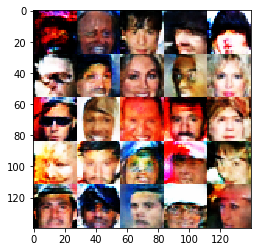

Epoch 5/5... Discriminator Loss: 1.6409... Generator Loss: 0.2937
Epoch 5/5... Discriminator Loss: 1.1190... Generator Loss: 0.5254
Epoch 5/5... Discriminator Loss: 0.7154... Generator Loss: 0.8379
Epoch 5/5... Discriminator Loss: 0.6102... Generator Loss: 1.1520
Epoch 5/5... Discriminator Loss: 0.7454... Generator Loss: 1.1868
Epoch 5/5... Discriminator Loss: 1.4703... Generator Loss: 0.3314
Epoch 5/5... Discriminator Loss: 0.5602... Generator Loss: 1.2390
Epoch 5/5... Discriminator Loss: 1.3496... Generator Loss: 0.4144
Epoch 5/5... Discriminator Loss: 0.6576... Generator Loss: 0.9948
Epoch 5/5... Discriminator Loss: 0.9613... Generator Loss: 0.6604


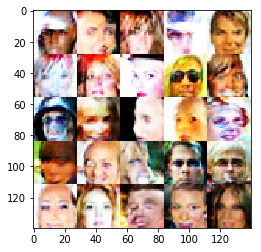

Epoch 5/5... Discriminator Loss: 0.7131... Generator Loss: 0.8700
Epoch 5/5... Discriminator Loss: 0.7810... Generator Loss: 0.8234
Epoch 5/5... Discriminator Loss: 0.9357... Generator Loss: 0.6718
Epoch 5/5... Discriminator Loss: 0.8354... Generator Loss: 0.7604
Epoch 5/5... Discriminator Loss: 1.0931... Generator Loss: 0.5277
Epoch 5/5... Discriminator Loss: 0.8601... Generator Loss: 0.7638
Epoch 5/5... Discriminator Loss: 0.5183... Generator Loss: 1.5381
Epoch 5/5... Discriminator Loss: 0.6323... Generator Loss: 0.9984
Epoch 5/5... Discriminator Loss: 1.2960... Generator Loss: 0.4271
Epoch 5/5... Discriminator Loss: 1.0783... Generator Loss: 0.5387


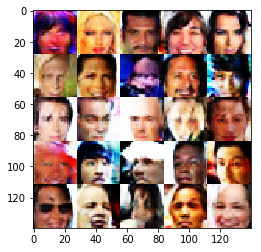

Epoch 5/5... Discriminator Loss: 0.9782... Generator Loss: 0.6116
Epoch 5/5... Discriminator Loss: 0.4761... Generator Loss: 1.4141
Epoch 5/5... Discriminator Loss: 1.2206... Generator Loss: 0.4388
Epoch 5/5... Discriminator Loss: 1.8355... Generator Loss: 0.2596
Epoch 5/5... Discriminator Loss: 1.5737... Generator Loss: 0.3208
Epoch 5/5... Discriminator Loss: 1.0281... Generator Loss: 0.5691
Epoch 5/5... Discriminator Loss: 1.2742... Generator Loss: 0.4375
Epoch 5/5... Discriminator Loss: 1.8927... Generator Loss: 0.2238
Epoch 5/5... Discriminator Loss: 0.3611... Generator Loss: 1.8531
Epoch 5/5... Discriminator Loss: 1.2440... Generator Loss: 0.4415


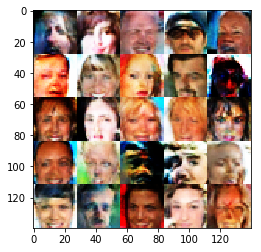

Epoch 5/5... Discriminator Loss: 1.7815... Generator Loss: 0.2496
Epoch 5/5... Discriminator Loss: 0.4982... Generator Loss: 1.3253
Epoch 5/5... Discriminator Loss: 1.5819... Generator Loss: 0.2984
Epoch 5/5... Discriminator Loss: 1.3401... Generator Loss: 0.3852
Epoch 5/5... Discriminator Loss: 0.3956... Generator Loss: 1.5520
Epoch 5/5... Discriminator Loss: 0.5090... Generator Loss: 1.2698
Epoch 5/5... Discriminator Loss: 0.4117... Generator Loss: 1.5431
Epoch 5/5... Discriminator Loss: 1.1279... Generator Loss: 0.5297
Epoch 5/5... Discriminator Loss: 0.9696... Generator Loss: 0.6334
Epoch 5/5... Discriminator Loss: 1.5549... Generator Loss: 0.3096


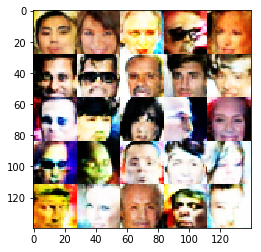

Epoch 5/5... Discriminator Loss: 1.2811... Generator Loss: 0.4414
Epoch 5/5... Discriminator Loss: 0.6774... Generator Loss: 1.1882
Epoch 5/5... Discriminator Loss: 0.7168... Generator Loss: 0.8960
Epoch 5/5... Discriminator Loss: 1.1291... Generator Loss: 0.5177
Epoch 5/5... Discriminator Loss: 1.7634... Generator Loss: 0.2470
Epoch 5/5... Discriminator Loss: 0.6485... Generator Loss: 2.1844
Epoch 5/5... Discriminator Loss: 0.9021... Generator Loss: 0.7200
Epoch 5/5... Discriminator Loss: 1.1541... Generator Loss: 0.5321
Epoch 5/5... Discriminator Loss: 1.6441... Generator Loss: 0.2730
Epoch 5/5... Discriminator Loss: 1.4539... Generator Loss: 3.4574


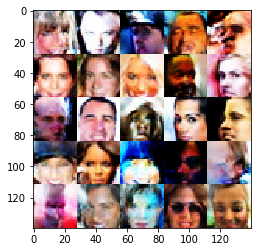

Epoch 5/5... Discriminator Loss: 0.5293... Generator Loss: 1.1401
Epoch 5/5... Discriminator Loss: 0.6671... Generator Loss: 1.0757
Epoch 5/5... Discriminator Loss: 0.9586... Generator Loss: 0.8208
Epoch 5/5... Discriminator Loss: 1.3861... Generator Loss: 0.3662
Epoch 5/5... Discriminator Loss: 0.9947... Generator Loss: 2.4679
Epoch 5/5... Discriminator Loss: 1.3942... Generator Loss: 0.3821
Epoch 5/5... Discriminator Loss: 1.7094... Generator Loss: 0.2871
Epoch 5/5... Discriminator Loss: 0.9270... Generator Loss: 0.8221
Epoch 5/5... Discriminator Loss: 0.5689... Generator Loss: 1.3975
Epoch 5/5... Discriminator Loss: 0.7145... Generator Loss: 1.0239


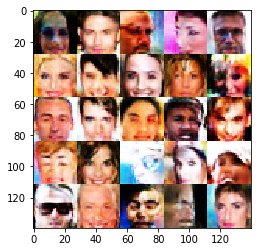

Epoch 5/5... Discriminator Loss: 0.3076... Generator Loss: 1.8019
Epoch 5/5... Discriminator Loss: 1.0360... Generator Loss: 0.5666
Epoch 5/5... Discriminator Loss: 1.5685... Generator Loss: 0.3383
Epoch 5/5... Discriminator Loss: 0.7197... Generator Loss: 0.9384
Epoch 5/5... Discriminator Loss: 0.9093... Generator Loss: 0.7563
Epoch 5/5... Discriminator Loss: 0.5687... Generator Loss: 1.2126
Epoch 5/5... Discriminator Loss: 1.0795... Generator Loss: 0.5651
Epoch 5/5... Discriminator Loss: 0.8694... Generator Loss: 0.7262
Epoch 5/5... Discriminator Loss: 1.1881... Generator Loss: 0.5101
Epoch 5/5... Discriminator Loss: 0.8967... Generator Loss: 0.7276


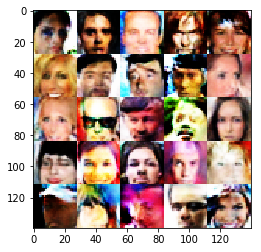

Epoch 5/5... Discriminator Loss: 0.9104... Generator Loss: 0.7143
Epoch 5/5... Discriminator Loss: 0.7198... Generator Loss: 0.9513
Epoch 5/5... Discriminator Loss: 0.8852... Generator Loss: 0.6871
Epoch 5/5... Discriminator Loss: 0.8288... Generator Loss: 0.8141
Epoch 5/5... Discriminator Loss: 0.4164... Generator Loss: 1.3524
Epoch 5/5... Discriminator Loss: 0.4825... Generator Loss: 1.3471
Epoch 5/5... Discriminator Loss: 0.8630... Generator Loss: 0.7045
Epoch 5/5... Discriminator Loss: 1.5501... Generator Loss: 0.3251
Epoch 5/5... Discriminator Loss: 0.4058... Generator Loss: 2.1259
Epoch 5/5... Discriminator Loss: 0.5792... Generator Loss: 1.0476


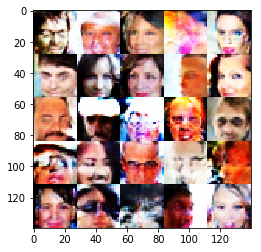

Epoch 5/5... Discriminator Loss: 1.5919... Generator Loss: 0.3250
Epoch 5/5... Discriminator Loss: 0.8325... Generator Loss: 3.0216
Epoch 5/5... Discriminator Loss: 0.6487... Generator Loss: 1.1417
Epoch 5/5... Discriminator Loss: 0.4533... Generator Loss: 1.7714
Epoch 5/5... Discriminator Loss: 0.9210... Generator Loss: 0.7018
Epoch 5/5... Discriminator Loss: 0.5314... Generator Loss: 1.4755
Epoch 5/5... Discriminator Loss: 1.0399... Generator Loss: 0.5686
Epoch 5/5... Discriminator Loss: 1.1944... Generator Loss: 0.4982
Epoch 5/5... Discriminator Loss: 0.3760... Generator Loss: 1.4504
Epoch 5/5... Discriminator Loss: 0.5879... Generator Loss: 1.0577


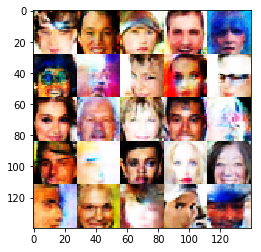

Epoch 5/5... Discriminator Loss: 0.3298... Generator Loss: 2.0093
Epoch 5/5... Discriminator Loss: 0.6748... Generator Loss: 1.0488
Epoch 5/5... Discriminator Loss: 1.3231... Generator Loss: 0.4638
Epoch 5/5... Discriminator Loss: 0.6476... Generator Loss: 1.0664
Epoch 5/5... Discriminator Loss: 0.7889... Generator Loss: 0.7738
Epoch 5/5... Discriminator Loss: 0.7654... Generator Loss: 1.1600
Epoch 5/5... Discriminator Loss: 0.9493... Generator Loss: 0.6342


In [ ]:
batch_size = 64
z_dim = 128
learning_rate = 0.0001
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 5

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.